In [1]:
# depending on where you run this, this may have to be %matplotlib notebook
%matplotlib inline

import os
import astropy
import requests
import pandas as pd
import numpy as np
import lightkurve as lk 
from scipy.interpolate import interp1d
from astropy.modeling import models, fitting
import matplotlib.pyplot as plt
import emcee
import sys
import csv
from astropy.timeseries import LombScargle
from os.path import basename, exists

# change these paths to wherever you have the files
# sys.path.insert(1,'/Users/neisner/Documents/code/utils/')
import filters # Suzanne's functions
import norm

# change these paths to wherever you have the files
# sys.path.insert(1,'/Users/neisner/Documents/code/ETV')
import etv_functions # Nora's functions 

%matplotlib inline

In [2]:
from IPython.display import display, HTML, Javascript, clear_output

display(HTML("<style>.container { width:99% !important; }</style>"))  # Jupyter 6
display(HTML("<style>.jp-Notebook { --jp-notebook-max-width: 98%; }</style>"))  # Jupyter 7

# define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
outfile_base = './etv_out'  # for ETV
lk_download_dir = 'C:/dev/_juypter/PH_TESS_LightCurveViewer/data'  

# A command from shell that can be run to notify users, e.g., fitting is finished. Use "echo" if you do not have one
NOTIFY_CMD = "win-notify.bat"

if hasattr(lk, "conf"):  # default download dir
    lk.conf.cache_dir = lk_download_dir
if hasattr(lk.search, "sr_cache"):   # PR for persistent query result cache
    lk.search.sr_cache.cache_dir = lk_download_dir  # None
    lk.search.sr_cache.expire_second = 86400

In [3]:
# define the plotting parameters

figsize = (8,4)

In [4]:
# import the data

# choose a TIC ID to analyze
ticid =  30034081

# define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
outfile_path = f"{outfile_base}/tic{ticid}_etv_primary.csv"
outfile_path_s = f"{outfile_base}/tic{ticid}_etv_secondary.csv"


# import data using Lightkurve
sr = lk.search_lightcurve('TIC {}'.format(ticid), author = 'SPOC')
display(sr)
search_result = sr.download_all().stitch()

time = search_result.time.value
flux = search_result.flux.value
fluxerr = search_result.flux_err.value
len(search_result)

#,mission,year,author,exptime,target_name,distance,proposal_id
,,,,s,,arcsec,
0,TESS Sector 04,2018,SPOC,120,30034081,0.0,G011154
1,TESS Sector 05,2018,SPOC,120,30034081,0.0,G011154
2,TESS Sector 06,2018,SPOC,120,30034081,0.0,G011154
3,TESS Sector 07,2019,SPOC,120,30034081,0.0,G011154
4,TESS Sector 08,2019,SPOC,120,30034081,0.0,G011154
5,TESS Sector 09,2019,SPOC,120,30034081,0.0,G011154
6,TESS Sector 10,2019,SPOC,120,30034081,0.0,G011154
7,TESS Sector 12,2019,SPOC,120,30034081,0.0,G011154
8,TESS Sector 13,2019,SPOC,120,30034081,0.0,G011154


528422

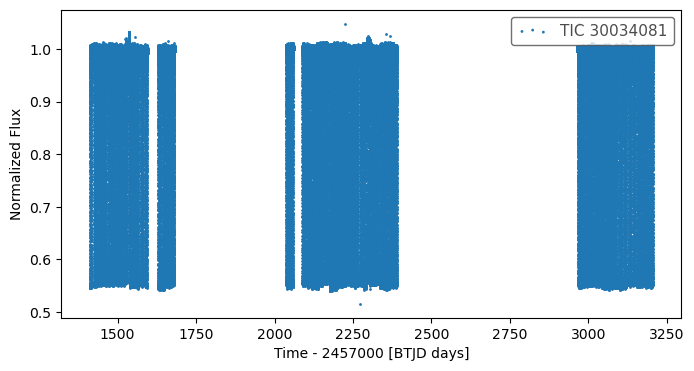

In [5]:
# mask out data you don't like...

fig, ax = plt.subplots(figsize=figsize)
search_result.scatter(ax = ax)

# t0 = 2337.376
# period_triple = 0.774

mask = time < 0  # (time > 2893.16-1) & (time < 2893.16+1) 

time = time[~mask]
flux = flux[~mask]
fluxerr = fluxerr[~mask]

# make sure that therte are no nans!

finite_mask = np.isfinite(time) * np.isfinite(flux) * np.isfinite(fluxerr)

# make a dictionary of the data 

data = pd.DataFrame({'time': time[finite_mask], 'flux': flux[finite_mask], 'err': fluxerr[finite_mask]})


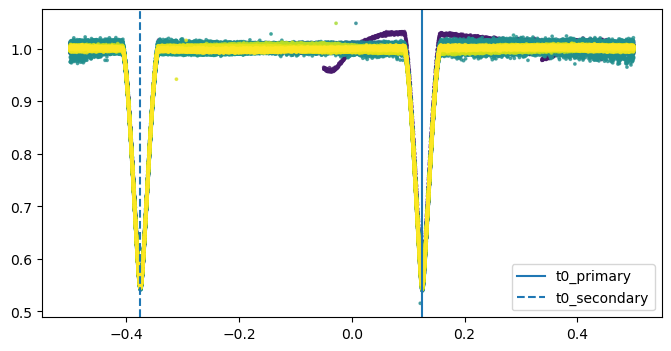

In [6]:
%matplotlib inline
# %matplotlib widget

# define the orbital period and the t0 

# FILL-IN THE eclipse epoch / period, 
# we assume the TCE caught both primary and secondary eclipses
# epoch=1411.5528, duration_hr=7.0212, period=2.344623, label="s0001-s0069:TCE1"
period = 2.344623 * 2

t0_primary = 1411.5528 + period / 2
t0_secondary = 1411.5528

duration_hr_primary = 7.0212  # used for the window to cut the lighcurve around eclipses in later cells

t0_for_plotting = 0  # keep 0 for plotting purposes
t0_for_plotting = t0_primary - np.abs(t0_primary - t0_secondary) * 0.25  # use a custom one so that the eclipses are not near the edge (-0.5 or +0.5)

phase = etv_functions.phase_data(data['time'], t0_for_plotting, period)

fig, ax = plt.subplots(figsize = (8,4))

plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])

# add the phase to the dataframe
data['phase'] = phase

plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
plt.legend()
# plt.ylim(0.535, 0.55)
# plt.xlim(-0.5, 0.1)
plt.show();

### Now that the data is ready we can start 

In [7]:
# show data to visualize what's changed in each step below
data  

,time,flux,err,phase
0,1410.902918,0.994350,0.001387,0.486410
1,1410.904307,0.996388,0.001389,0.486706
2,1410.905696,0.990963,0.001386,0.487003
3,1410.907085,0.991479,0.001387,0.487299
4,1410.908474,0.996198,0.001388,0.487595
...,...,...,...,...
479075,3206.376043,1.002296,0.001530,0.378057
479076,3206.377432,1.004778,0.001532,0.378354
479077,3206.378821,1.000041,0.001531,0.378650
479078,3206.380210,1.001699,0.001532,0.378946


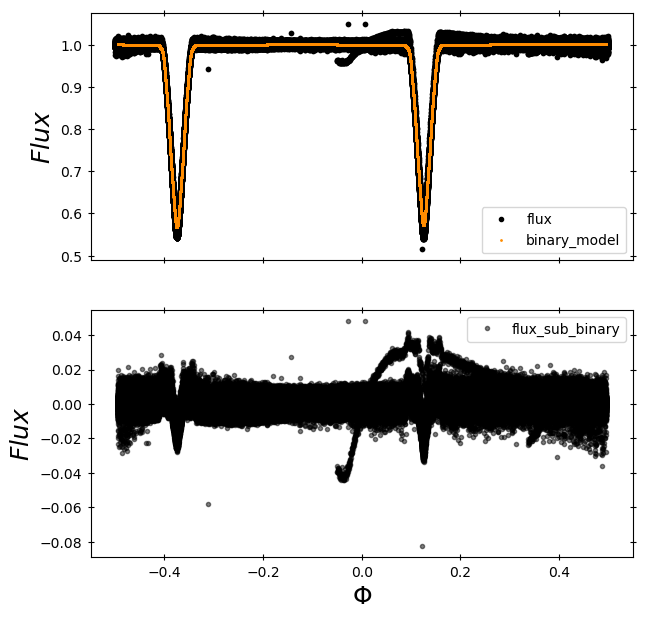

,time,flux,err,phase,flux_sub_binary,binary_model
0,1410.902918,0.994350,0.001387,0.486410,-0.006541,1.000891
1,1410.904307,0.996388,0.001389,0.486706,-0.004500,1.000888
2,1410.905696,0.990963,0.001386,0.487003,-0.009923,1.000885
3,1410.907085,0.991479,0.001387,0.487299,-0.009404,1.000883
4,1410.908474,0.996198,0.001388,0.487595,-0.004682,1.000880
...,...,...,...,...,...,...
479075,3206.376043,1.002296,0.001530,0.378057,0.000752,1.001544
479076,3206.377432,1.004778,0.001532,0.378354,0.003233,1.001545
479077,3206.378821,1.000041,0.001531,0.378650,-0.001505,1.001546
479078,3206.380210,1.001699,0.001532,0.378946,0.000152,1.001547


In [8]:
# phase fold the data and create an appoximate binary model (top) and subtract it from the data (bottom)
#_, _ , flux_sub_binary, model, _, _ = etv_functions.trend_removal_interact(period, 0, data['time'], data['flux'], data['time'], data['flux'])

data = etv_functions.trend_removal_interact(period, t0_for_plotting, data)
data

10 474284 901
reached the end
10 442875 901
reached the end
10 438029 901
reached the end
10 436535 901
reached the end
10 435902 901
reached the end


,time,flux,err,phase,flux_sub_binary,binary_model,flux_detrended
0,1410.902918,0.994350,0.001387,0.486410,-0.006541,1.000891,1.000238
1,1410.904307,0.996388,0.001389,0.486706,-0.004500,1.000888,1.002265
2,1410.905696,0.990963,0.001386,0.487003,-0.009923,1.000885,0.996830
3,1410.907085,0.991479,0.001387,0.487299,-0.009404,1.000883,0.997337
4,1410.908474,0.996198,0.001388,0.487595,-0.004682,1.000880,1.002048
...,...,...,...,...,...,...,...
479075,3206.376043,1.002296,0.001530,0.378057,0.000752,1.001544,1.001899
479076,3206.377432,1.004778,0.001532,0.378354,0.003233,1.001545,1.004381
479077,3206.378821,1.000041,0.001531,0.378650,-0.001505,1.001546,0.999645
479078,3206.380210,1.001699,0.001532,0.378946,0.000152,1.001547,1.001301


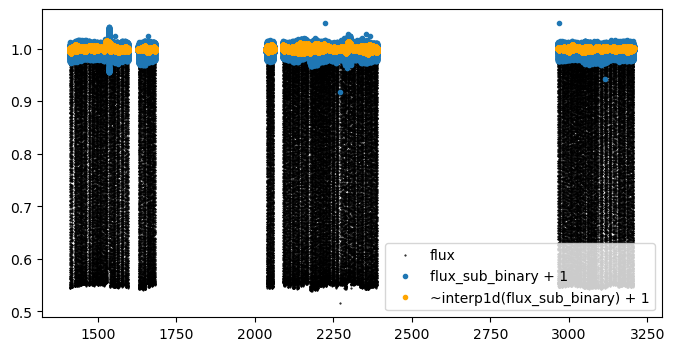

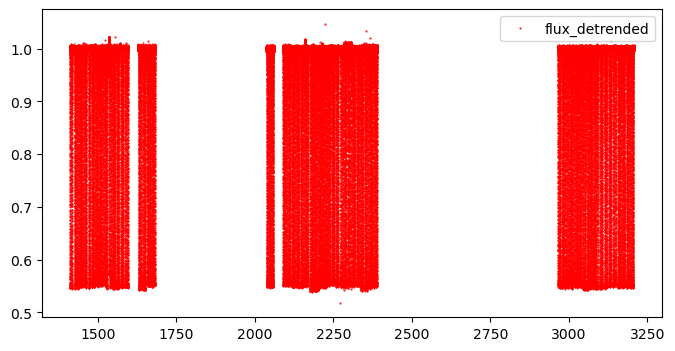

In [9]:
# if you want to detrend the data run this line!

data = etv_functions.detrend_suz(data, T_dur = 10, plot = True)
data

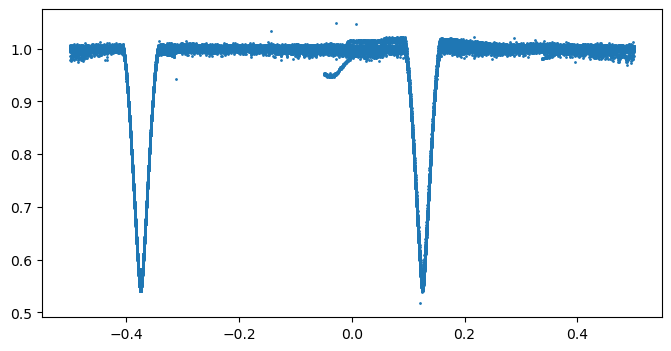

In [10]:
# plot the phase folded data here so that you know at what phase you want to cut the data to model 
fig, ax = plt.subplots(figsize = figsize)
plt.scatter(data.phase, data.flux_detrended, s = 1)
plt.show()

Primary:   1413.897423 0.12499999999999767
Secondary: 1411.5528 -0.37499999999999306
window_width (phase): 0.07486491431671531


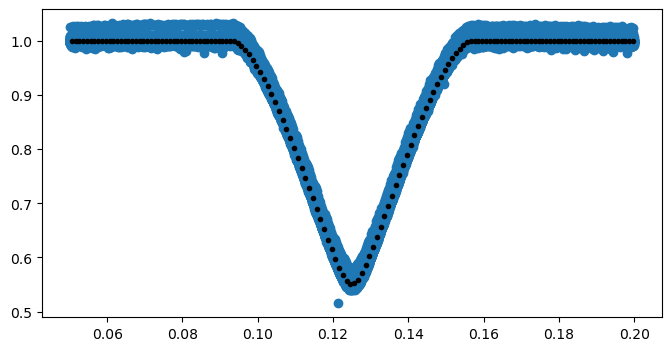

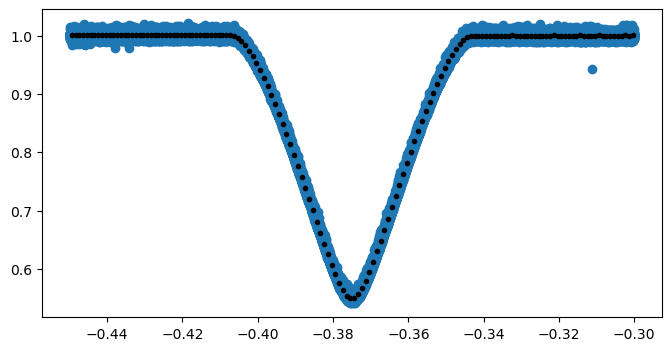

In [11]:
# define the midpoints of the primary and secondary eclipses and the window width

# if these don't look central - change them!! the eclipses should be central
midpoint_p =  etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0]  # convet to time in phase
midpoint_s =  etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0]

print('Primary:  ', t0_primary, midpoint_p)
print('Secondary:', t0_secondary, midpoint_s)

# change depending on the width of the eclipses, default to be slightly larger than the primary eclipse
window_width = 1.2 * duration_hr_primary / 24 / period
# window_width = 0.05
print("window_width (phase):", window_width)


data_primary = data[(data['phase'] > midpoint_p - window_width) & (data['phase'] < midpoint_p + window_width) ]
data_secondary = data[(data['phase'] > midpoint_s - window_width) & (data['phase'] < midpoint_s + window_width) ]

ph_binned,flux_binned,err_binned = etv_functions.run_binning_phased(data_primary.phase, data_primary.flux, yerr=data_primary.err,nbins=1000)
ph_binned_s,flux_binned_s,err_binned_s = etv_functions.run_binning_phased(data_secondary.phase, data_secondary.flux, yerr=data_secondary.err,nbins=1000)


# -- -- -- -- -- -- -- -- -- 

fig = plt.subplots(figsize=figsize, sharex=True)
plt.errorbar(ph_binned, flux_binned, yerr=err_binned, fmt=".k", capsize=0, zorder = 2)
plt.scatter(data_primary.phase, data_primary.flux, zorder = -2)
plt.show()

# -- -- -- -- -- -- -- -- -- 
fig = plt.subplots(figsize=figsize, sharex=True)
plt.errorbar(ph_binned_s, flux_binned_s, yerr=err_binned_s, fmt=".k", capsize=0, zorder = 2)
plt.scatter(data_secondary.phase, data_secondary.flux, zorder = -2)
plt.show() 

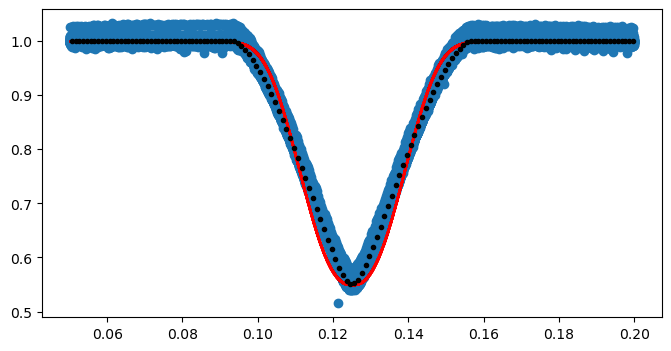

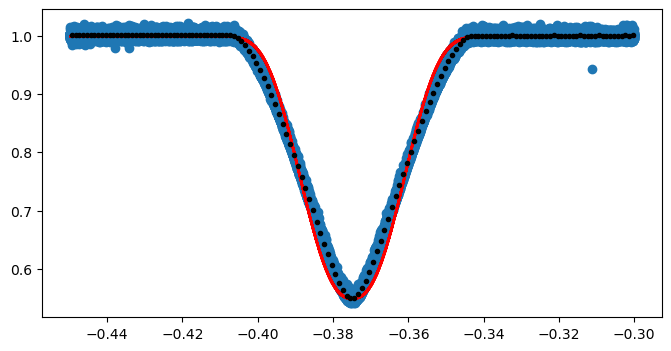

In [12]:
### # you need initial guesses!! The order is :
# alpha0, alpha1, t0, d, Tau - CHANGE THESE TO YOUR OWN INITIAL GUESSES
# median flux, -eclipse depth, t0, related to duration, related to shape (U or V) 
# t0 in normalixed phase
start_vals = [1, -0.45, midpoint_p, 0.012, 1.2]
start_vals_s = [1, -0.45, midpoint_s, 0.012, 1.2]

# - - -- - 

etv_functions.plot_initial_guess(data_primary, ph_binned, flux_binned, err_binned, *start_vals)
etv_functions.plot_initial_guess(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, *start_vals_s)


100%|████████████████████████████████████████████████████████| 1000/1000 [1:40:41<00:00,  6.04s/it]


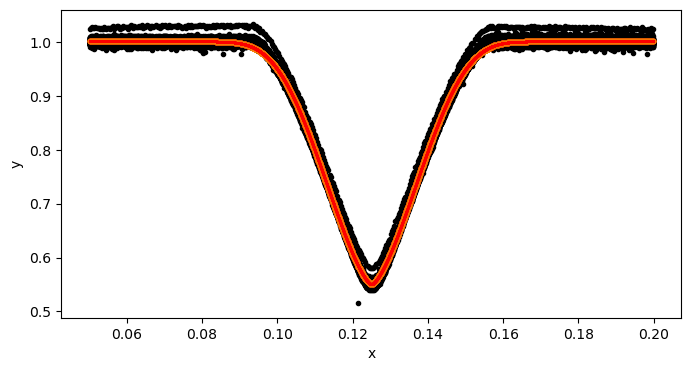

100%|██████████████████████████████████████████████████████████| 1000/1000 [10:17<00:00,  1.62it/s]


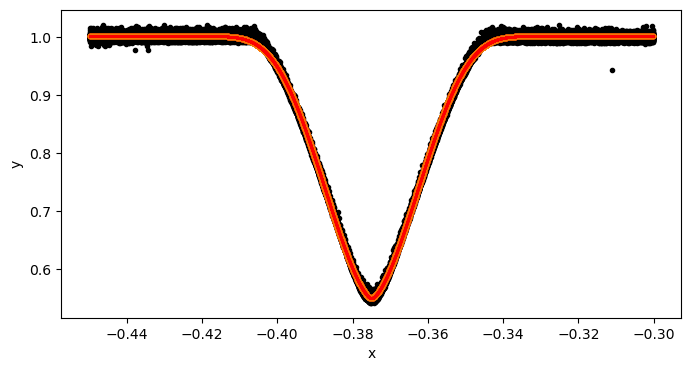

In [41]:
# run the initial model fit using MCMC for the primary and secondary eclipses 

mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = etv_functions.run_mcmc_initial_fit(data_primary, start_vals, nruns = 1000, plot_chains = False, plot = True)
mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = etv_functions.run_mcmc_initial_fit(data_secondary, start_vals_s, nruns = 1000, plot_chains = False, plot = True)
!$NOTIFY_CMD "Initial fit done"

In [13]:
# Initial fit params
mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.0011142495421985, -0.4510105175356701, 0.12499719178254205, 0.014577189327488124, 0.7247681117651352
mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 1.0013589390322668, -0.452358403656157, -0.37500037502926503, 0.014534760518686683, 0.7649265918969392


382

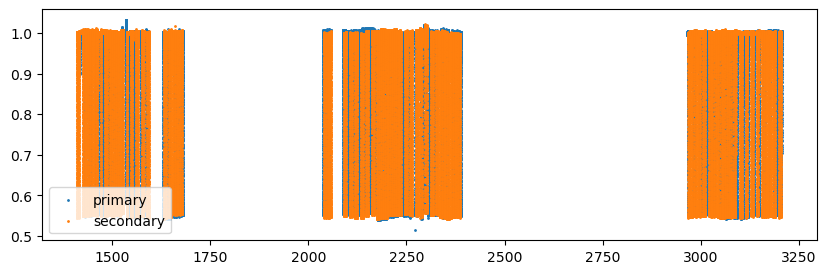

In [14]:
fig = plt.subplots(figsize=(10, 3), sharex=True)
plt.scatter(data_primary.time,data_primary.flux , s = 1, label = 'primary')
plt.scatter(data_secondary.time,data_secondary.flux , s = 1, label = 'secondary')
plt.legend()

# calculate the number of transits there are within the data 
n_transits = int((max(data_primary.time) - min(data_primary.time)) / period)
n_transits

1413.897423 4.689246 1413.897423


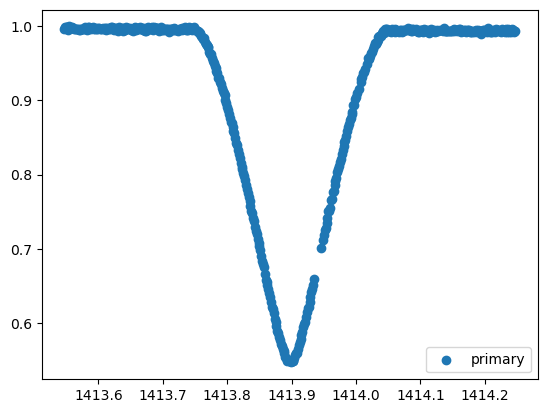

1413.897423 4.689246 1418.5866689999998


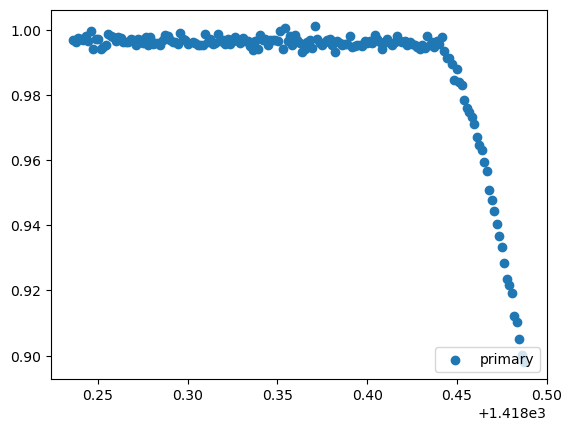

1413.897423 4.689246 1423.275915


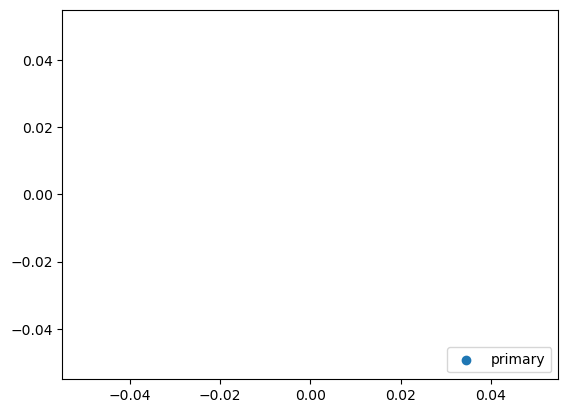

1411.5528 4.689246 1411.5528


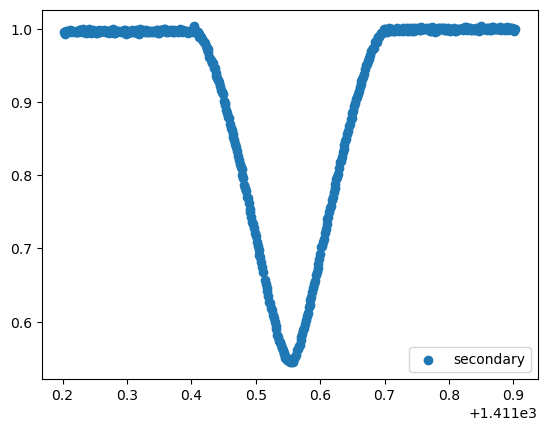

1411.5528 4.689246 1416.2420459999998


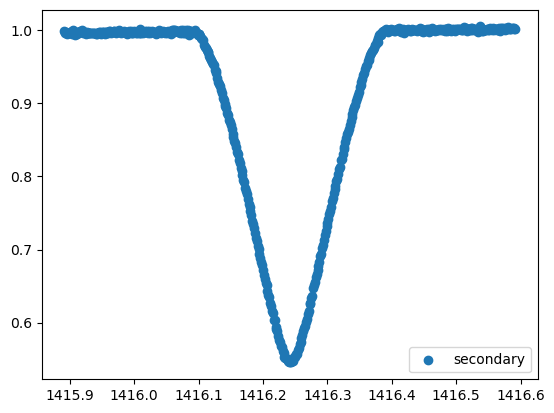

1411.5528 4.689246 1420.931292


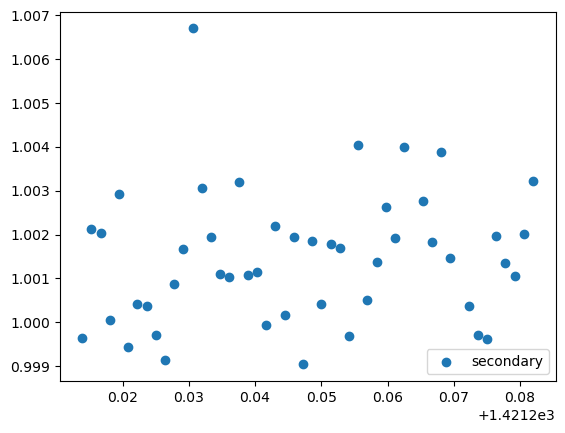

In [15]:
tr_index = range(0,n_transits)

for i in tr_index[0:3]:        
    transit_time = t0_primary+(period*i)
    x = np.array(data_primary.time)
    y = np.array(data_primary.flux) 
    yerr = np.array(data_primary.err)
    
    print (t0_primary, period, transit_time)
    
    mask = (x > (transit_time - (0.2*period))) & (x < (transit_time + (0.2*period))) 
    
    x = np.array(x[mask])
    y = np.array(y[mask]) 
    yerr = np.array(yerr[mask])
    fig, ax = plt.subplots()
    plt.scatter(x,y, label="primary")
    plt.legend(loc="lower right")
    plt.show()
    

for i in tr_index[0:3]:        
    transit_time = t0_secondary+(period*i)
    x = np.array(data_secondary.time)
    y = np.array(data_secondary.flux) 
    yerr = np.array(data_secondary.err)
    
    print (t0_secondary, period, transit_time)
    
    mask = (x > (transit_time - (0.2*period))) & (x < (transit_time + (0.2*period))) 
    
    x = np.array(x[mask])
    y = np.array(y[mask]) 
    yerr = np.array(yerr[mask])
    fig, ax = plt.subplots()
    plt.scatter(x,y, label="secondary")
    plt.legend(loc="lower right")
    plt.show()

Fitting individual primary eclipses...
Creating new manifest file
1413.897423 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:41<00:00, 239.29it/s]


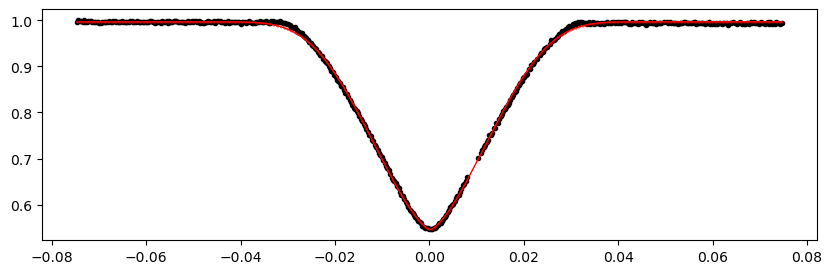

1418.5866689999998 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.74it/s]


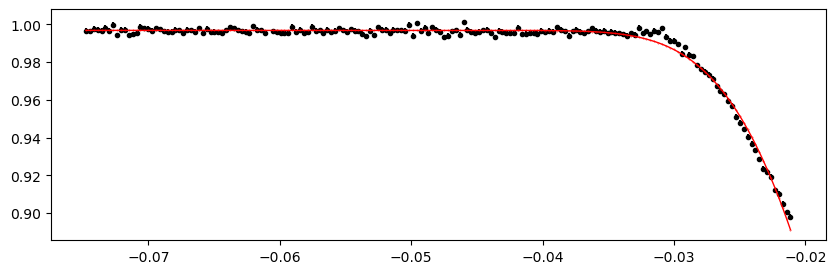

1427.9651609999999 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:40<00:00, 245.97it/s]


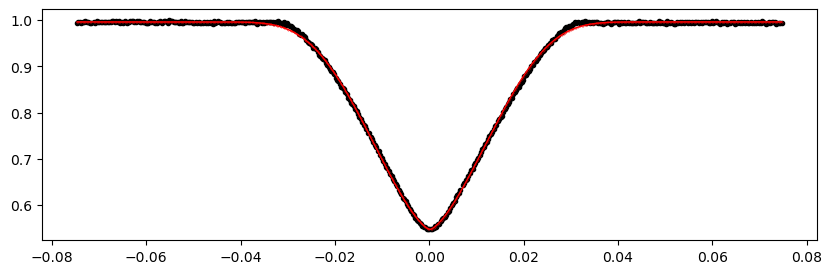

1432.654407 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:41<00:00, 238.74it/s]


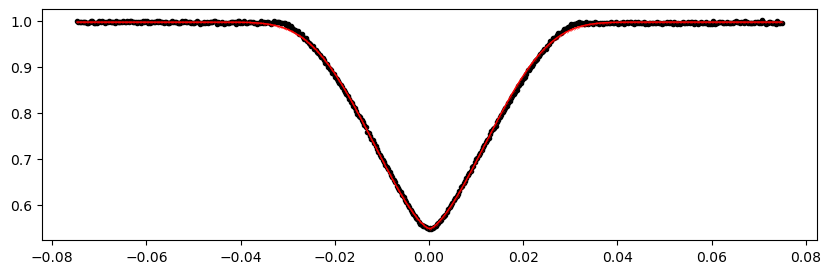

1442.0328989999998 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:41<00:00, 239.43it/s]


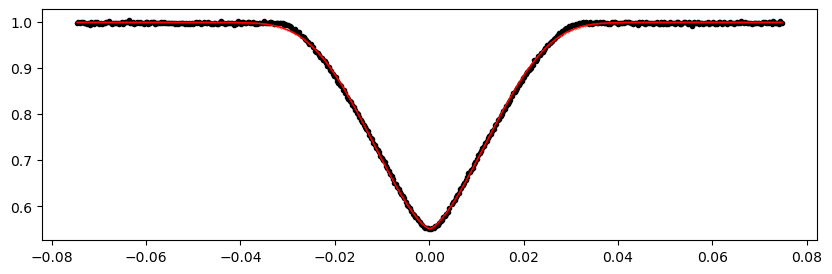

1446.722145 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:39<00:00, 251.65it/s]


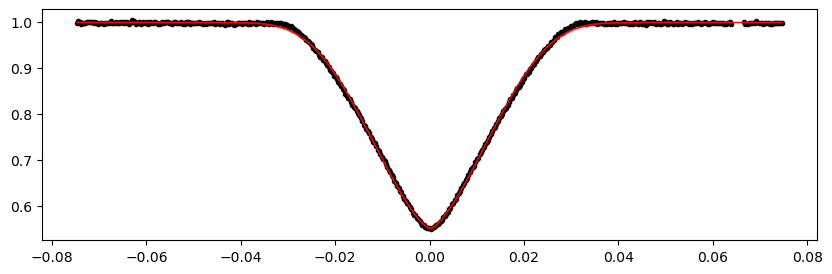

1451.4113909999999 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:21<00:00, 474.08it/s]


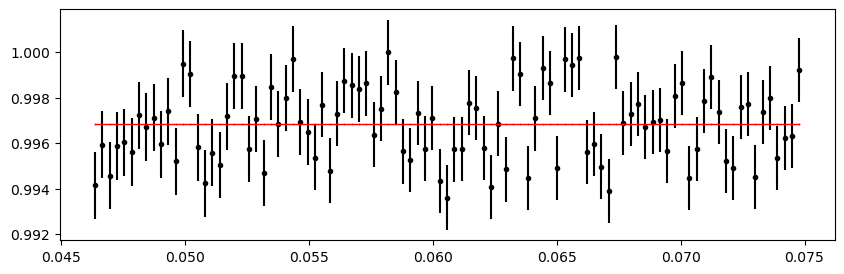

1456.1006369999998 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:41<00:00, 242.35it/s]


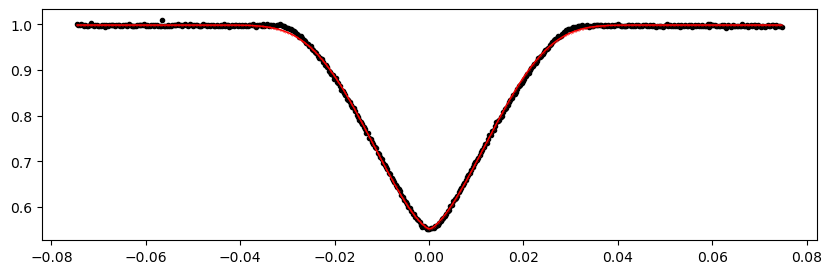

1460.789883 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:40<00:00, 244.22it/s]


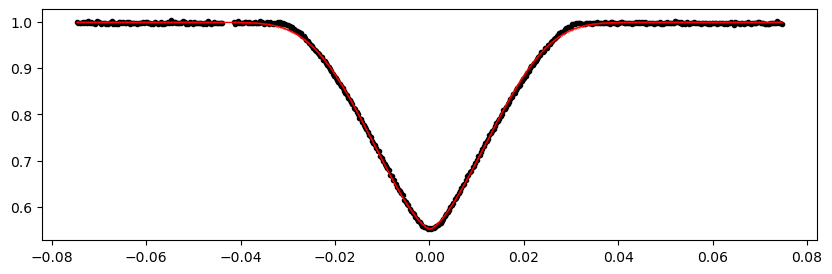

1470.168375 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:41<00:00, 240.07it/s]


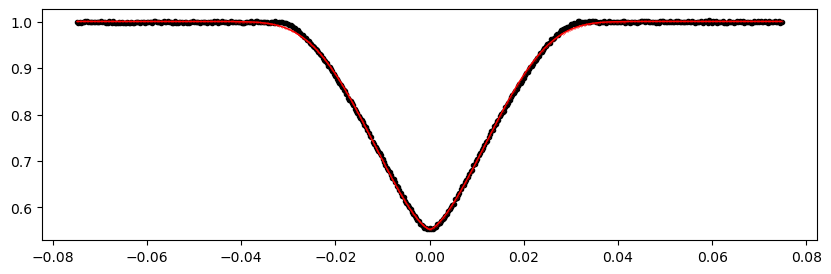

1474.8576209999999 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:42<00:00, 237.30it/s]


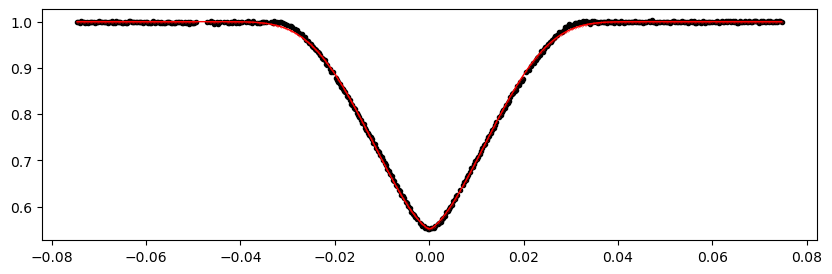

1479.5468669999998 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 221.50it/s]


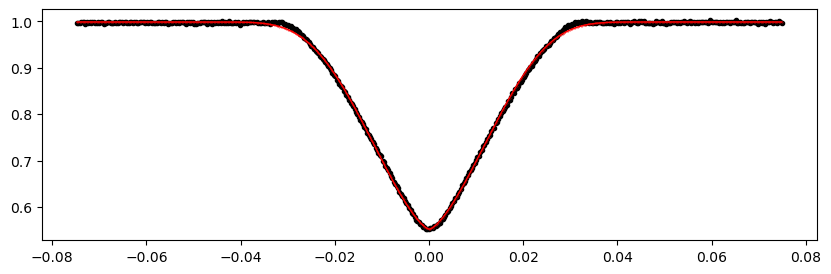

1484.236113 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:40<00:00, 245.15it/s]


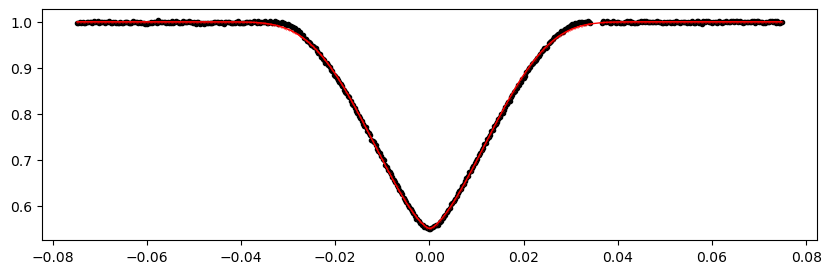

1488.9253589999998 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:43<00:00, 231.33it/s]


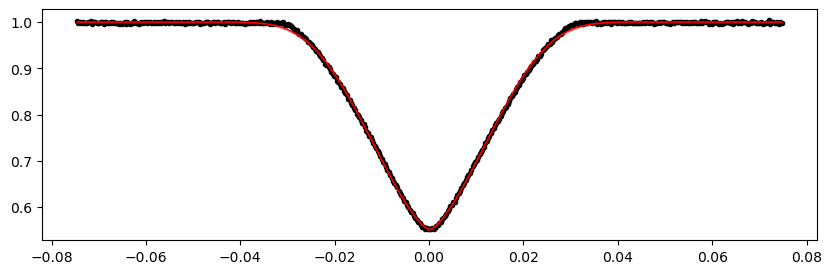

1493.614605 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:43<00:00, 232.47it/s]


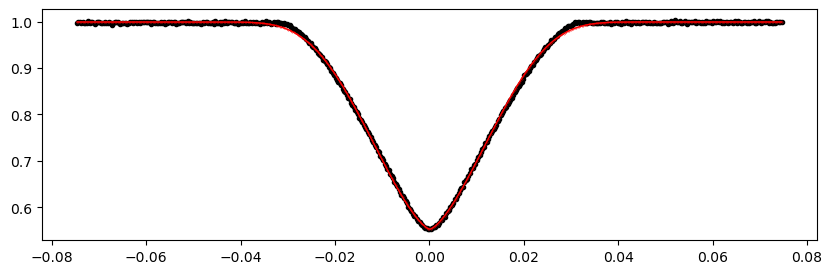

1498.303851 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:43<00:00, 230.35it/s]


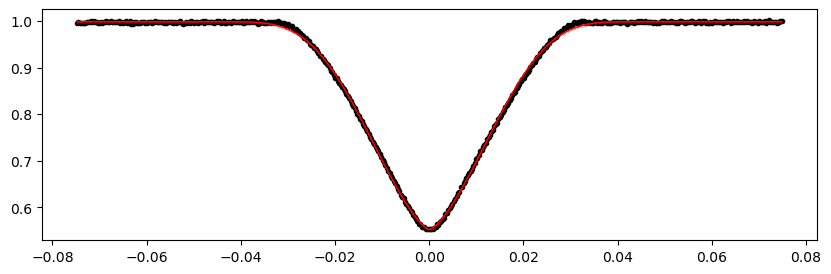

1502.9930969999998 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:35<00:00, 283.30it/s]


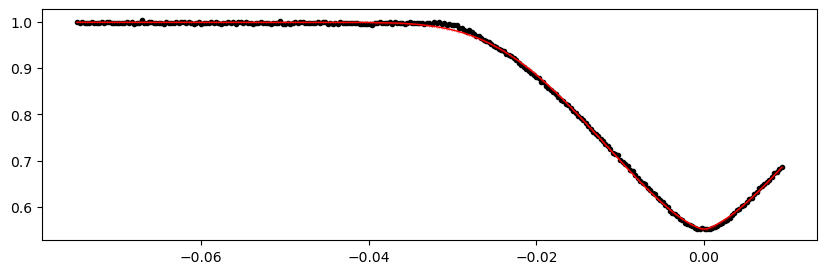

1507.682343 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:44<00:00, 225.80it/s]


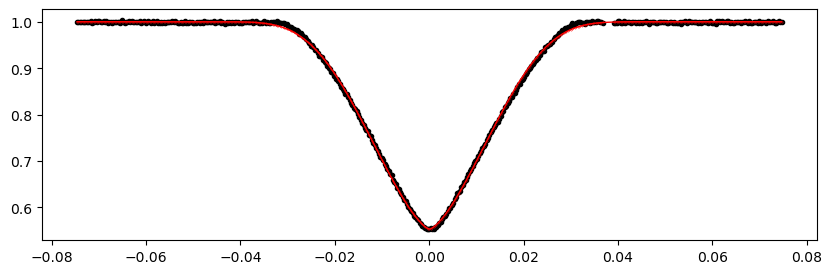

1512.3715889999999 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:43<00:00, 231.64it/s]


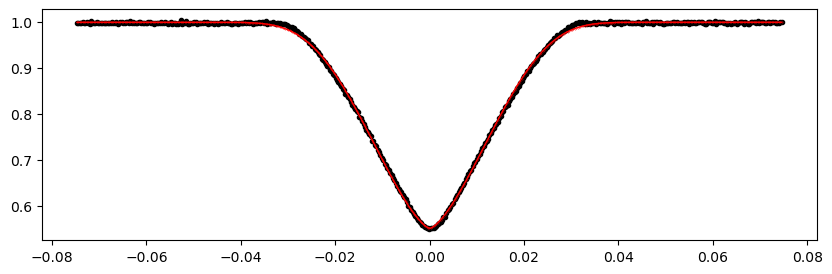

1521.750081 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:43<00:00, 229.49it/s]


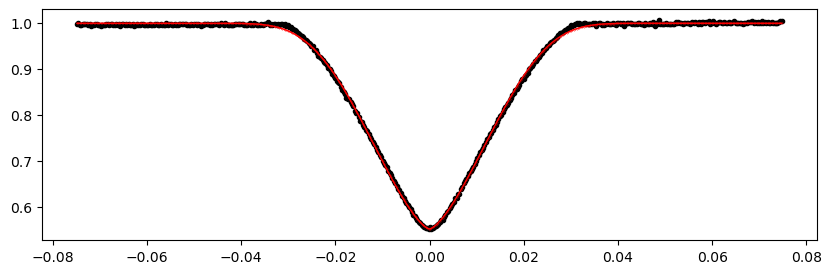

1526.4393269999998 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:42<00:00, 237.87it/s]


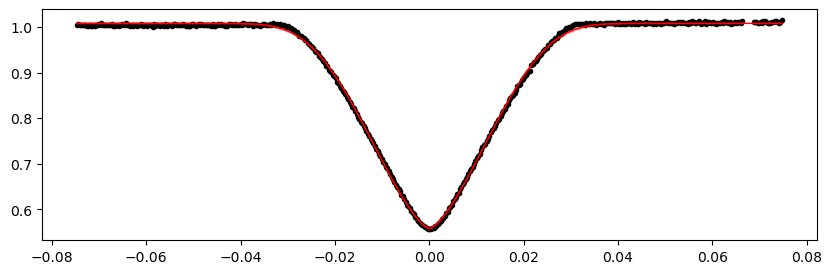

1535.8178189999999 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:42<00:00, 233.21it/s]


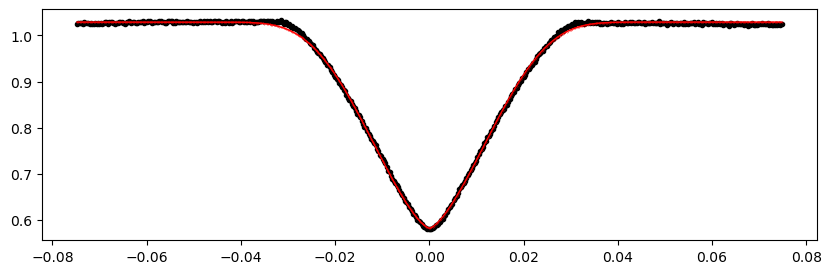

1540.5070649999998 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:42<00:00, 234.97it/s]


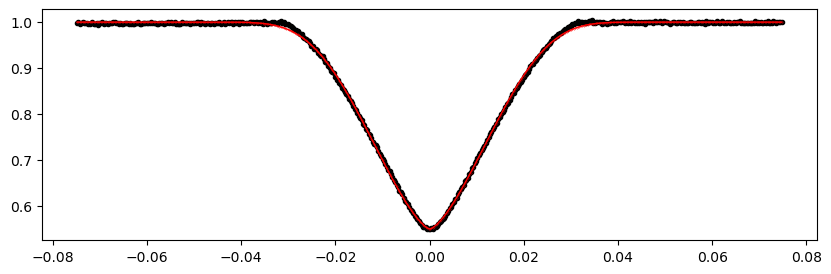

1545.196311 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:42<00:00, 233.04it/s]


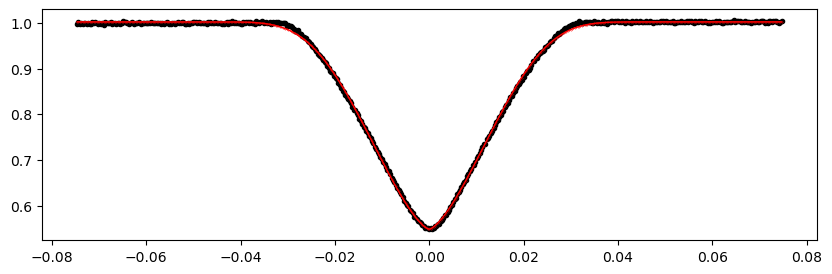

1549.8855569999998 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:42<00:00, 235.57it/s]


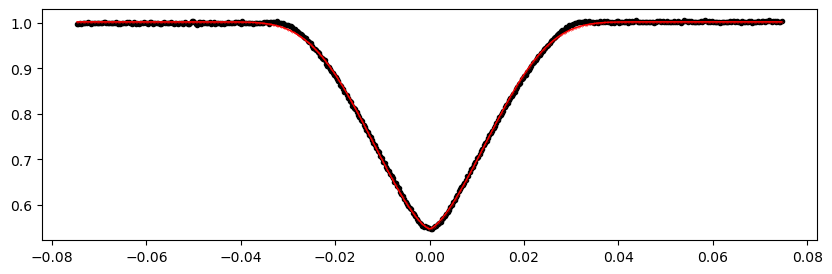

1554.574803 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:42<00:00, 237.50it/s]


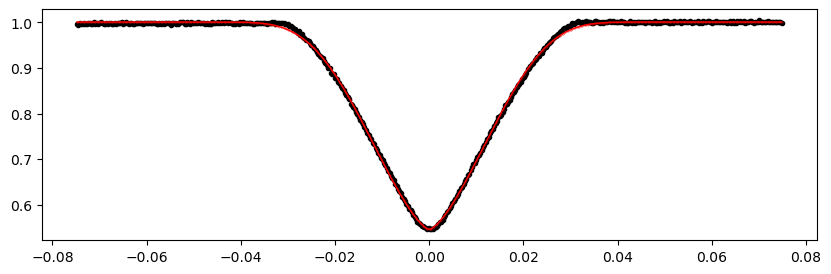

1559.2640489999999 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:41<00:00, 238.33it/s]


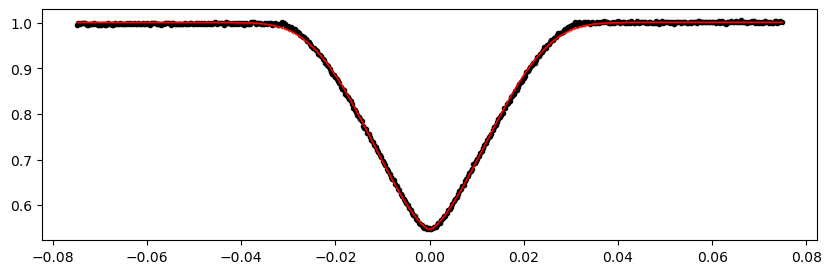

1563.9532949999998 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:42<00:00, 232.57it/s]


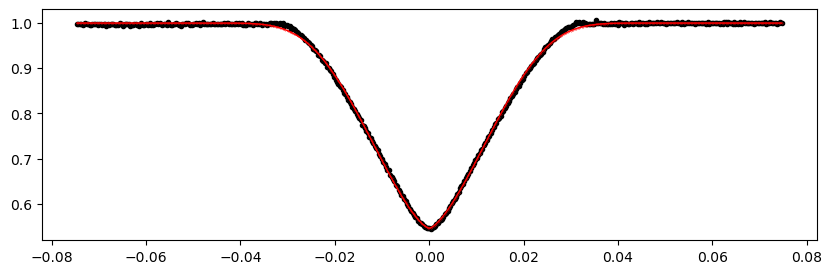

1568.642541 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 424.19it/s]


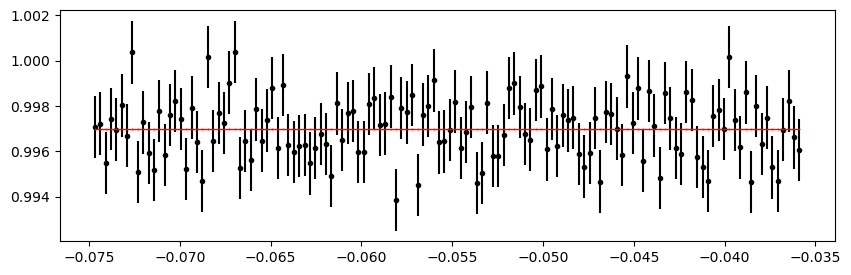

1573.3317869999998 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:42<00:00, 233.25it/s]


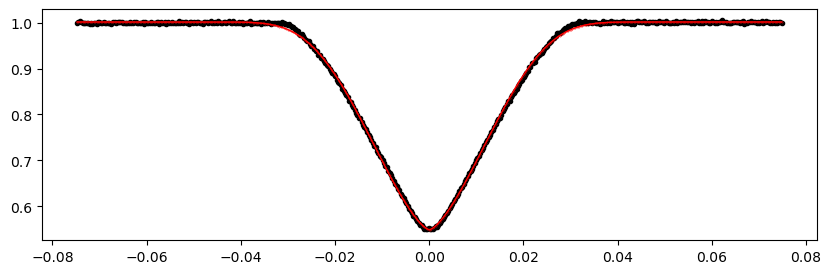

1578.021033 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:55<00:00, 181.79it/s]


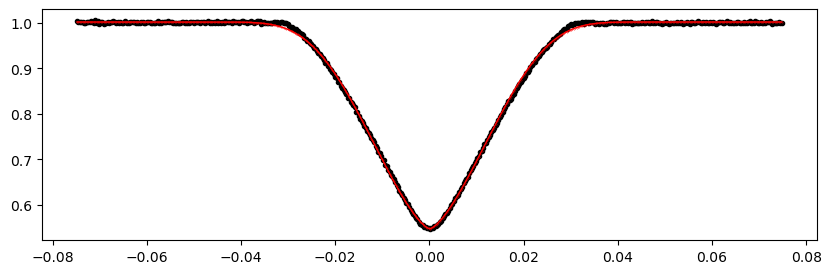

1587.3995249999998 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:43<00:00, 230.59it/s]


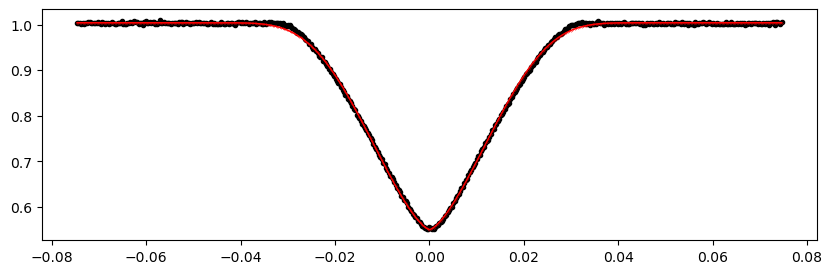

1592.088771 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:41<00:00, 241.45it/s]


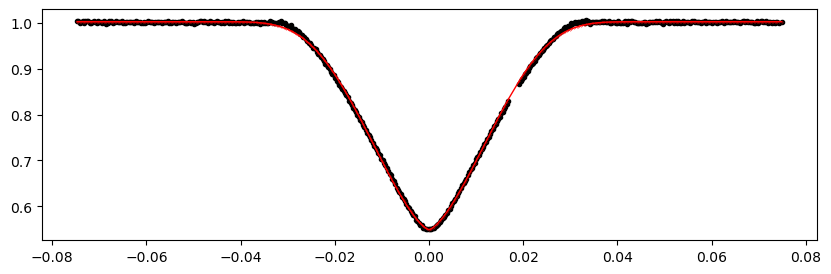

1629.602739 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:42<00:00, 236.50it/s]


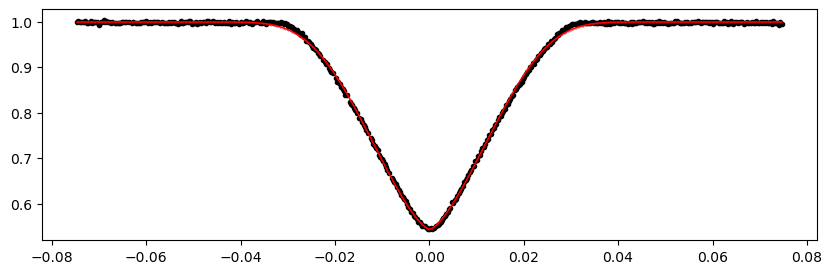

1634.2919849999998 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:41<00:00, 241.93it/s]


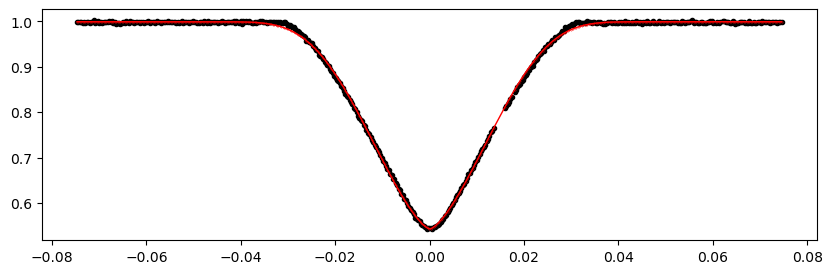

1638.9812309999998 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:33<00:00, 301.86it/s]


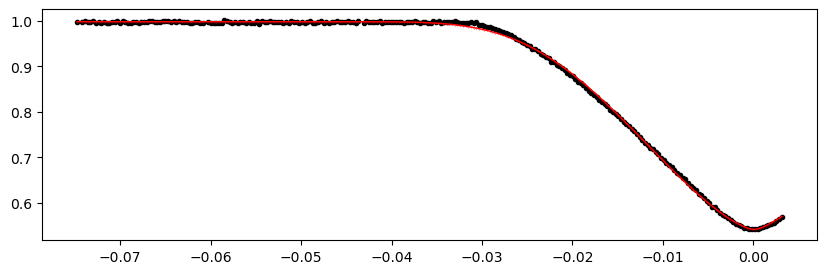

1643.670477 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:42<00:00, 234.18it/s]


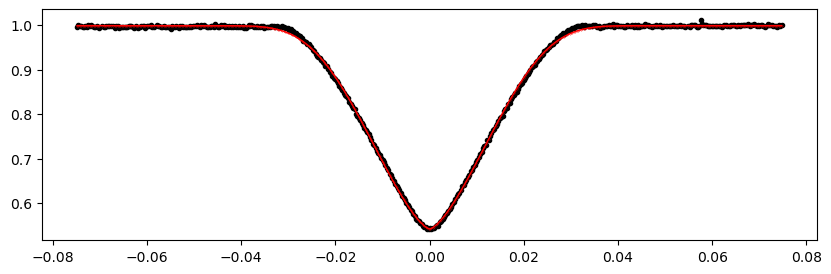

1648.3597229999998 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:43<00:00, 230.70it/s]


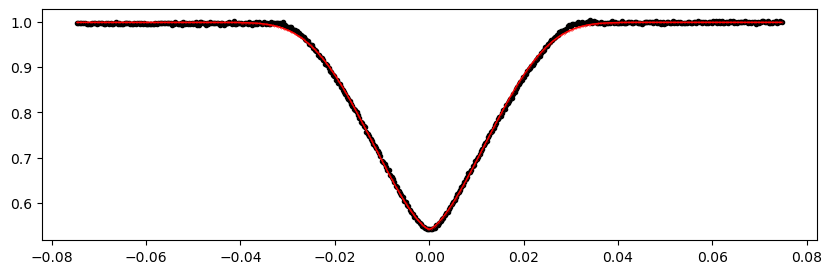

1653.048969 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 414.99it/s]


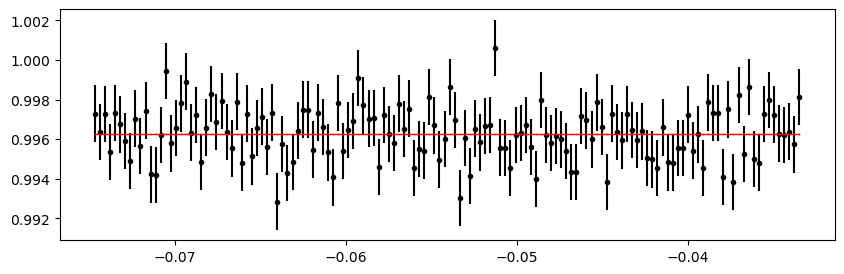

1657.7382149999999 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:42<00:00, 234.97it/s]


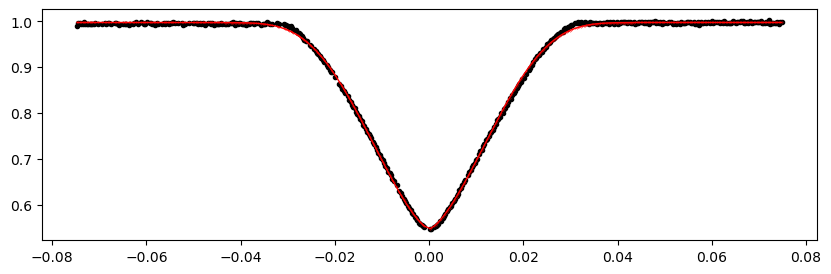

1662.4274609999998 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:42<00:00, 234.78it/s]


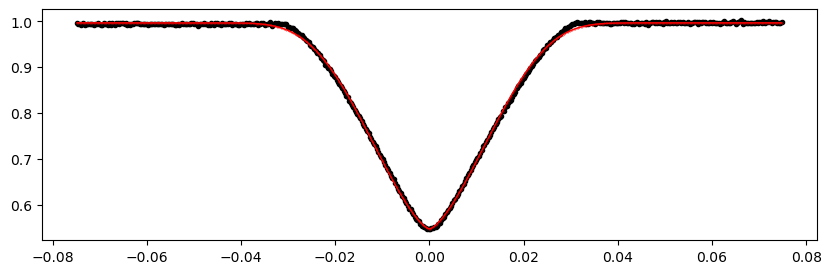

1667.116707 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:43<00:00, 229.73it/s]


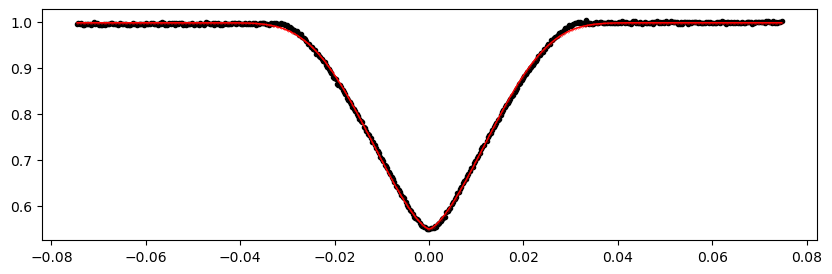

1671.8059529999998 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:44<00:00, 226.08it/s]


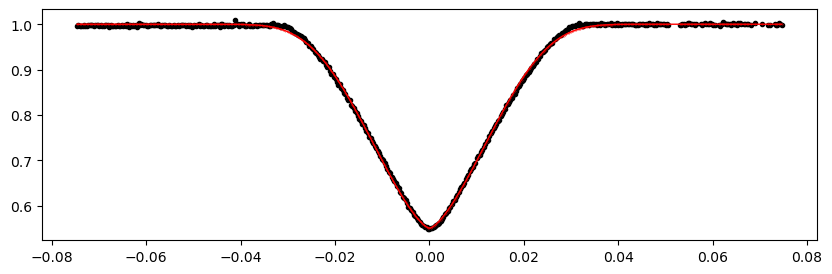

1676.495199 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:42<00:00, 234.37it/s]


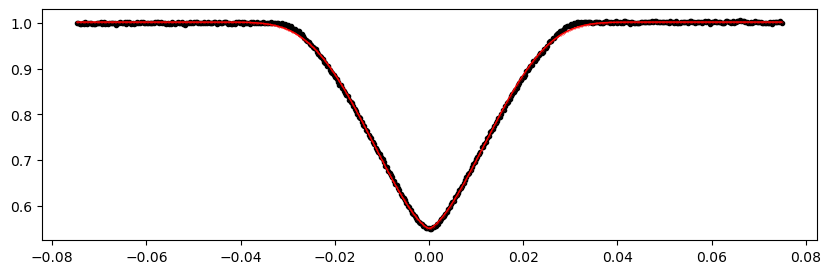

1681.1844449999999 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:43<00:00, 230.65it/s]


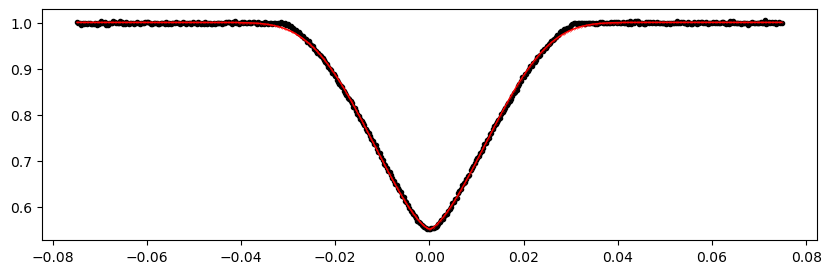

2037.567141 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:42<00:00, 232.69it/s]


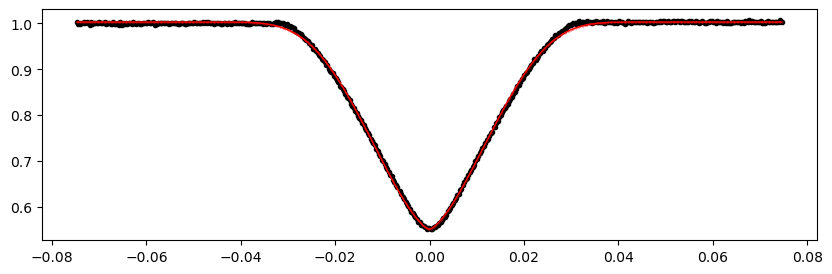

2042.256387 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:44<00:00, 226.46it/s]


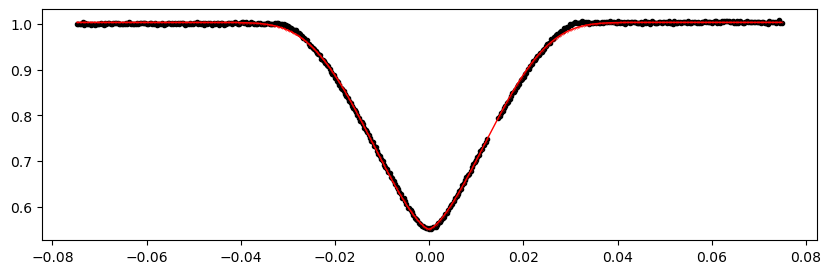

2046.9456329999998 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:52<00:00, 190.39it/s]


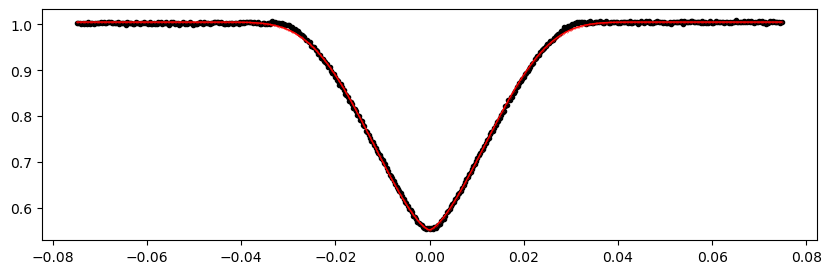

2051.6348789999997 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [01:03<00:00, 156.88it/s]


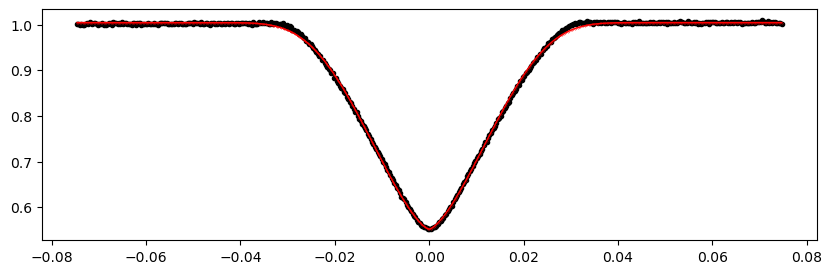

2056.324125 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [01:01<00:00, 161.95it/s]


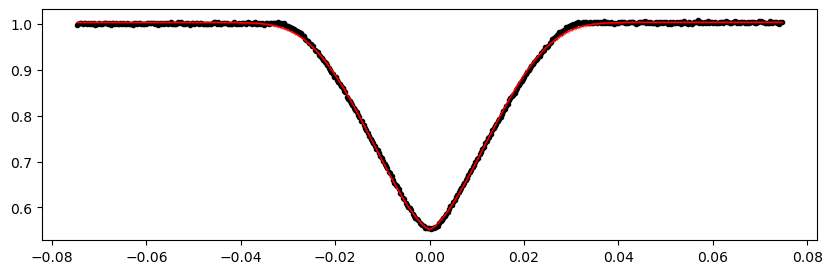

2089.148847 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [01:03<00:00, 157.24it/s]


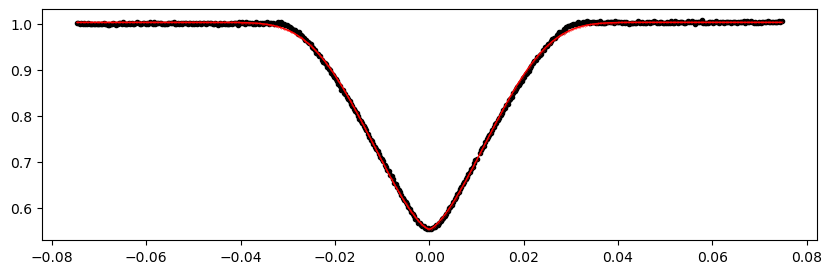

2093.838093 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [01:04<00:00, 153.89it/s]


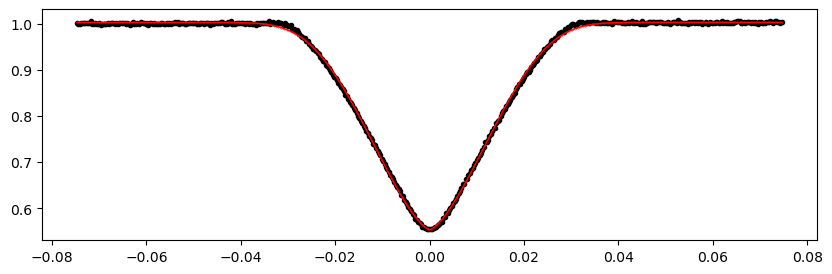

2098.5273389999998 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [01:07<00:00, 148.12it/s]


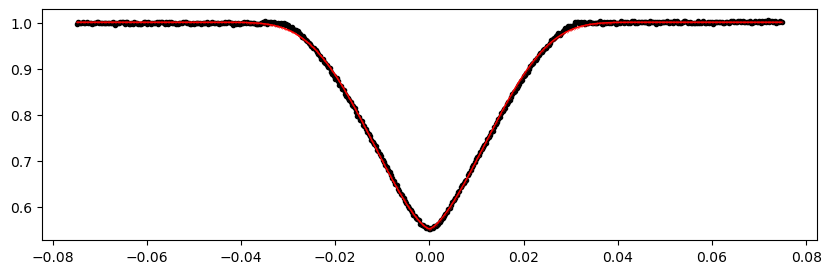

2103.216585 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [01:05<00:00, 153.47it/s]


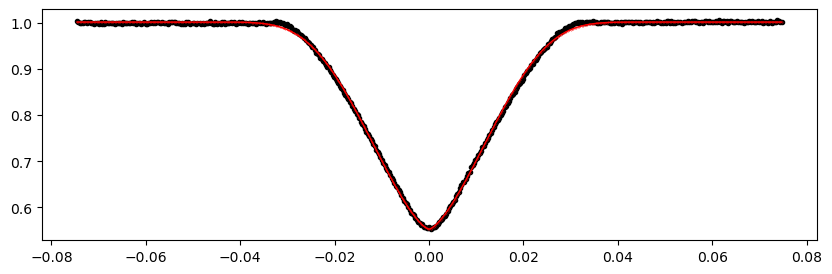

2107.905831 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [01:04<00:00, 154.59it/s]


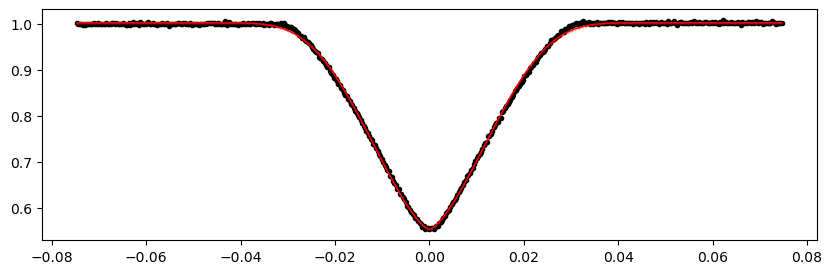

2112.595077 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 217.68it/s]


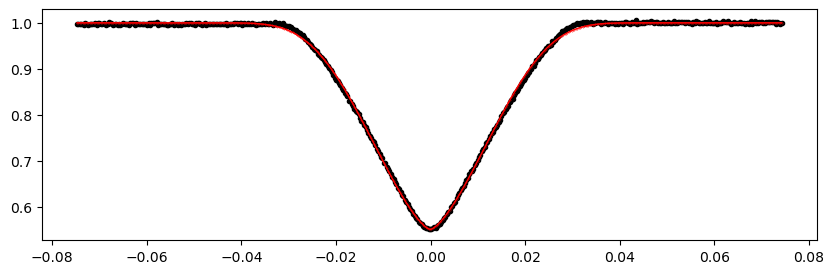

2117.284323 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:44<00:00, 227.10it/s]


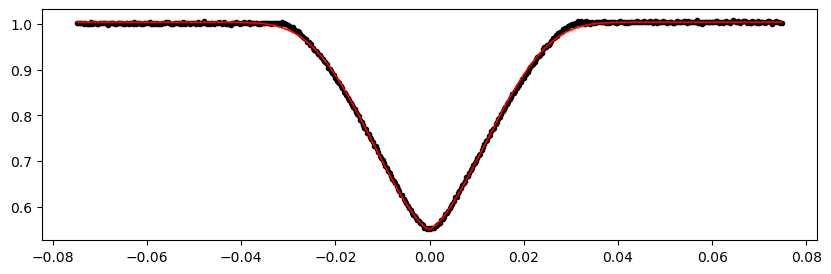

2121.9735689999998 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:47<00:00, 212.05it/s]


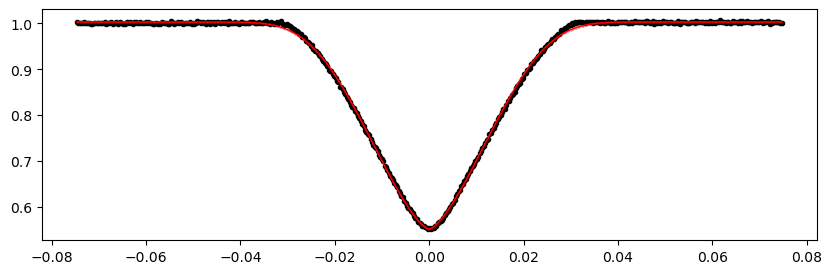

2126.6628149999997 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:43<00:00, 227.98it/s]


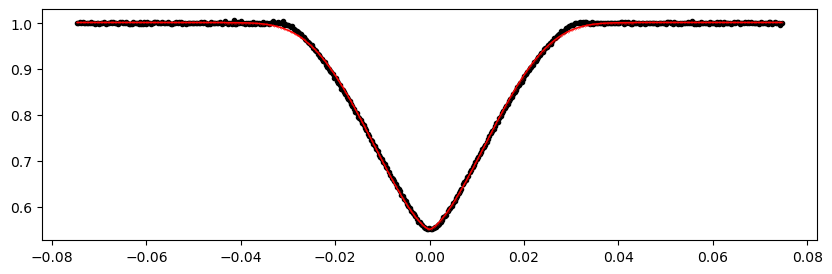

2131.3520609999996 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:43<00:00, 232.06it/s]


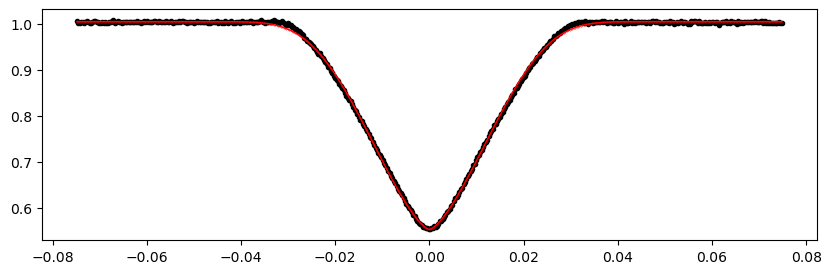

2136.041307 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:42<00:00, 234.71it/s]


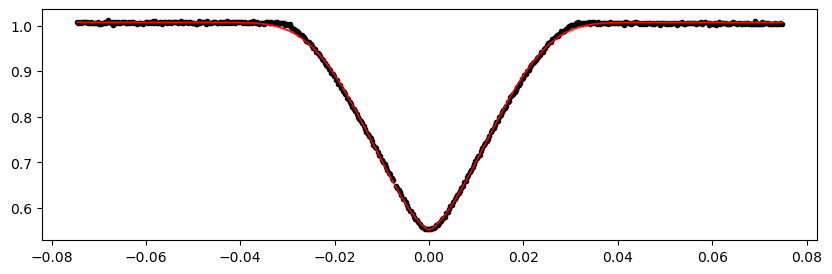

2140.730553 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:44<00:00, 225.68it/s]


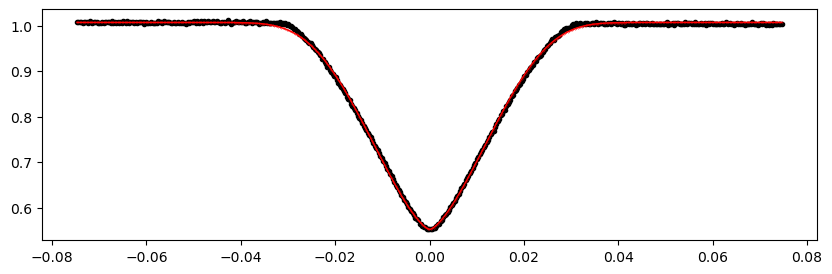

2145.419799 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:49<00:00, 203.83it/s]


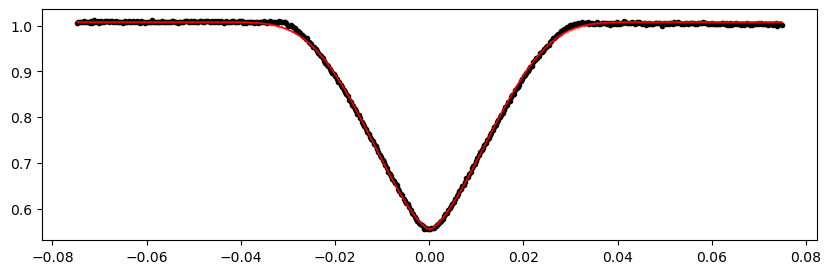

2150.1090449999997 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:49<00:00, 200.05it/s]


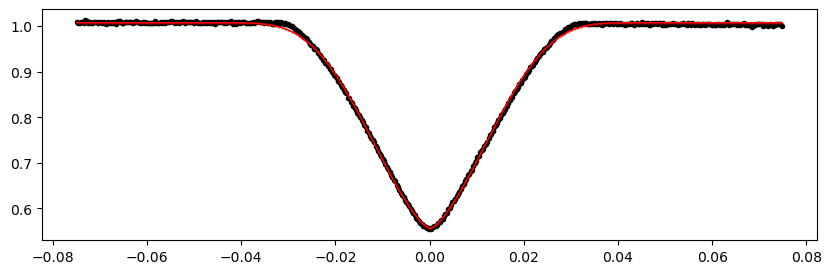

2154.798291 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:41<00:00, 241.31it/s]


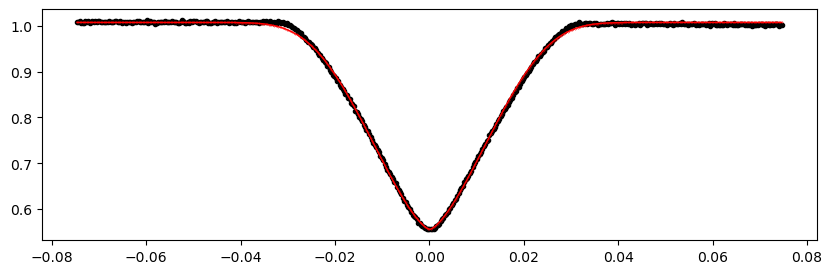

2159.487537 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:41<00:00, 241.67it/s]


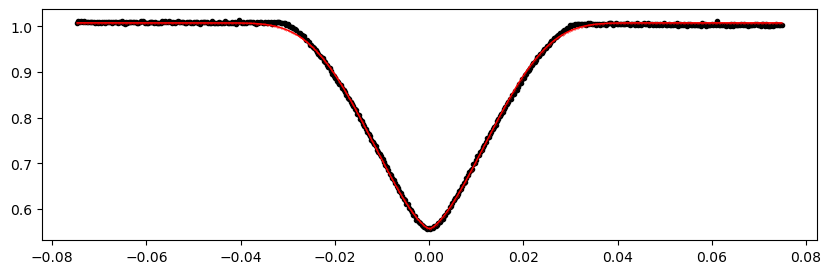

2164.176783 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:41<00:00, 240.85it/s]


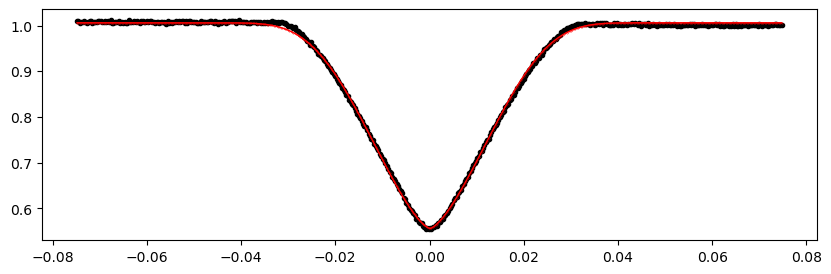

2168.866029 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:42<00:00, 237.17it/s]


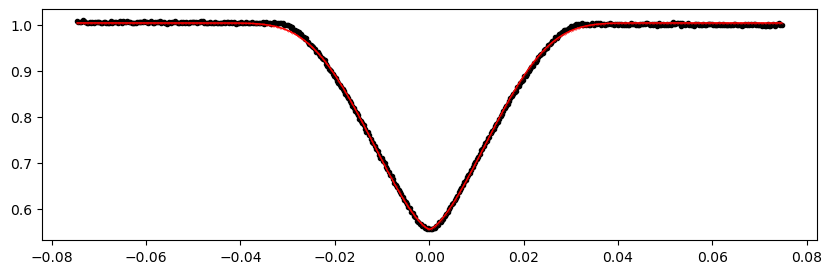

2178.2445209999996 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:42<00:00, 234.90it/s]


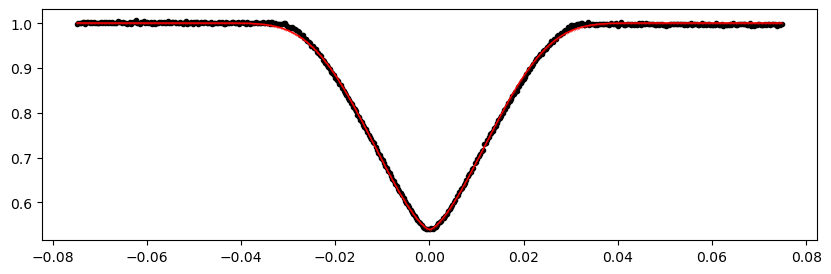

2182.933767 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:42<00:00, 236.94it/s]


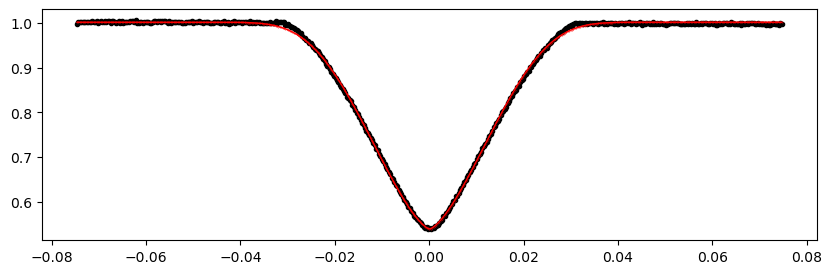

2187.623013 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:42<00:00, 234.41it/s]


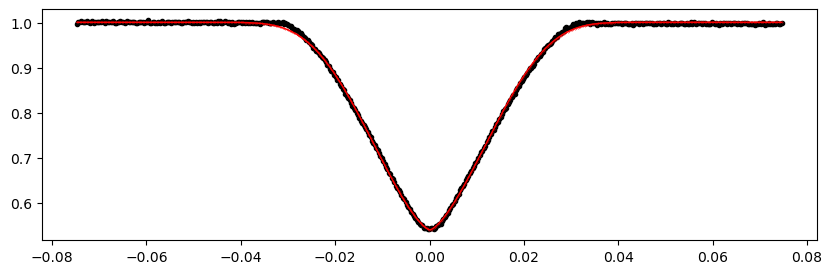

2192.312259 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:42<00:00, 237.90it/s]


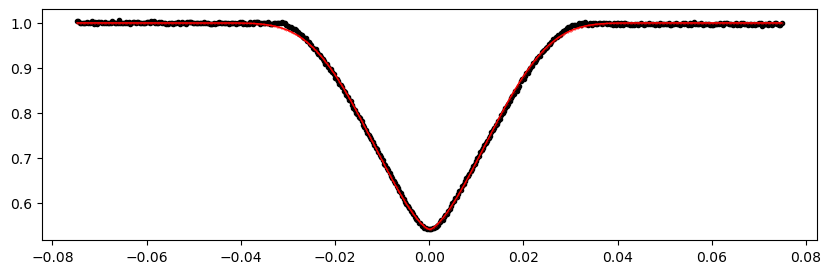

2197.0015049999997 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:42<00:00, 237.07it/s]


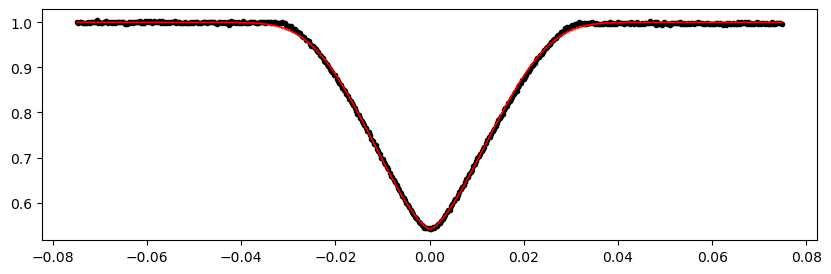

2201.690751 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 318.38it/s]


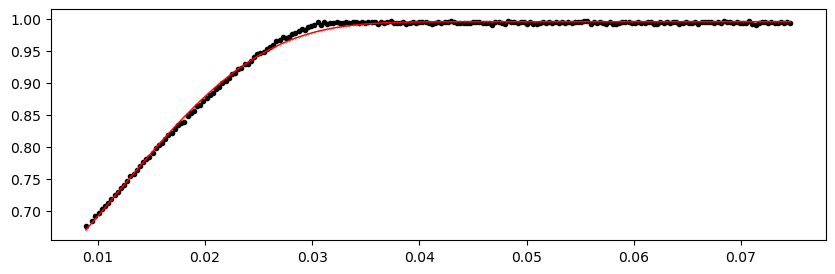

2206.379997 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:42<00:00, 235.61it/s]


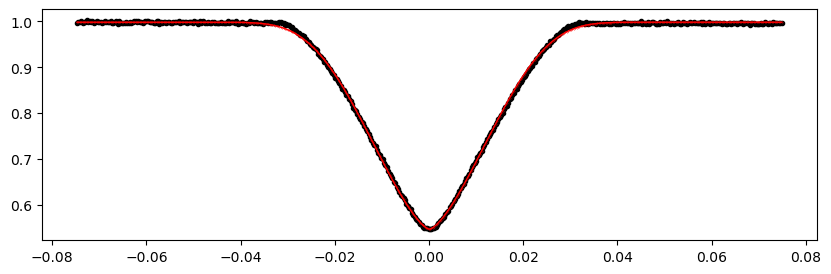

2211.069243 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:43<00:00, 228.06it/s]


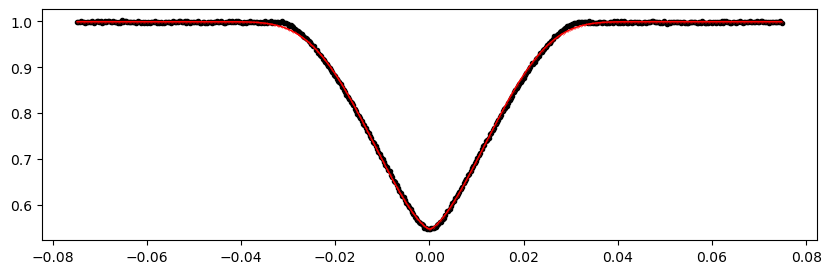

2215.758489 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:44<00:00, 224.95it/s]


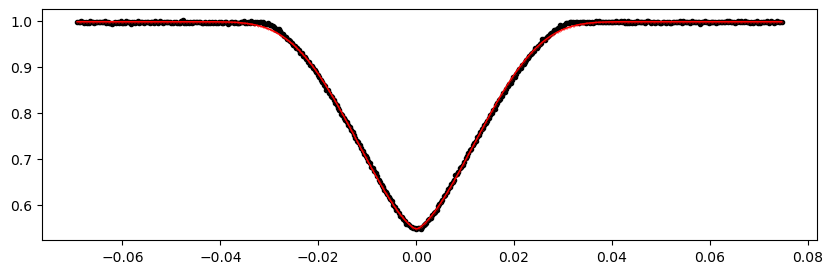

2220.4477349999997 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 213.78it/s]


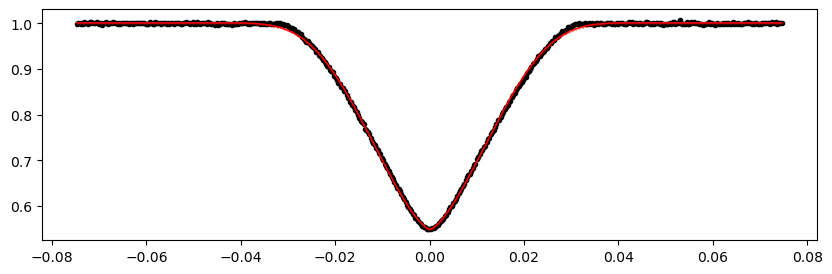

2225.1369809999997 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 217.38it/s]


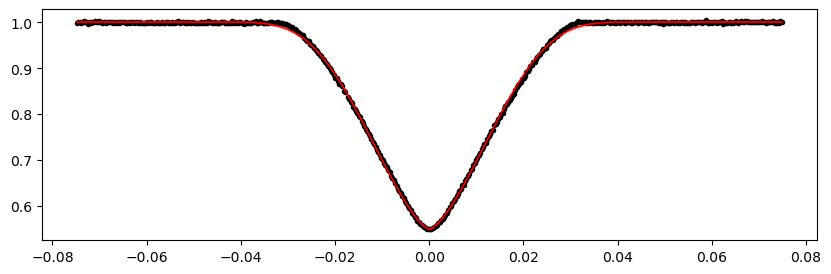

2229.826227 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 221.85it/s]


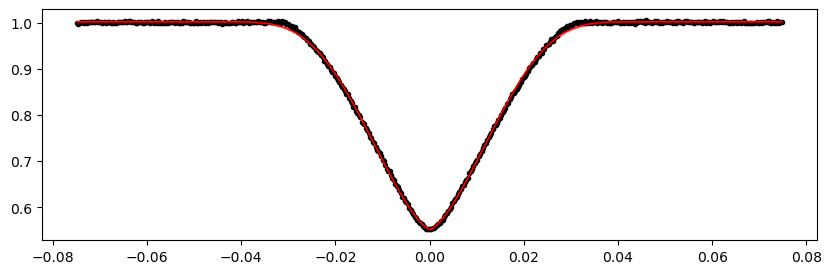

2234.515473 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 218.35it/s]


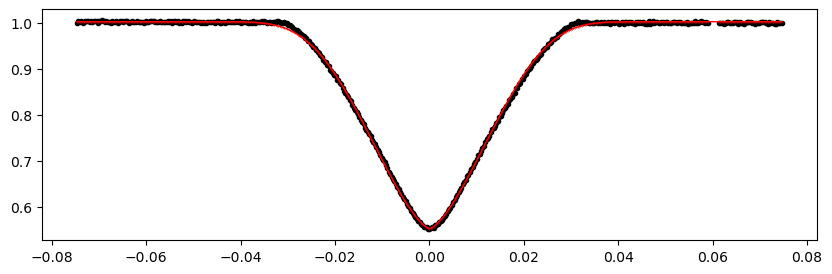

2239.204719 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:44<00:00, 224.23it/s]


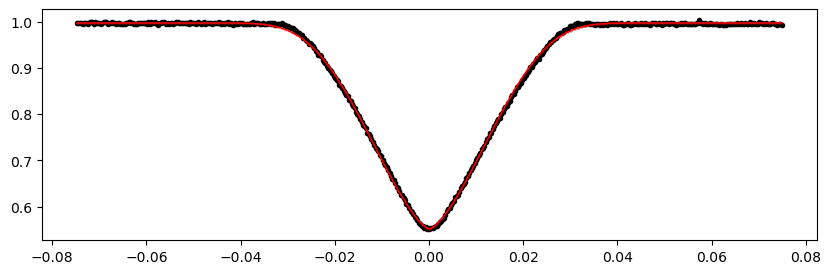

2243.8939649999998 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:44<00:00, 222.53it/s]


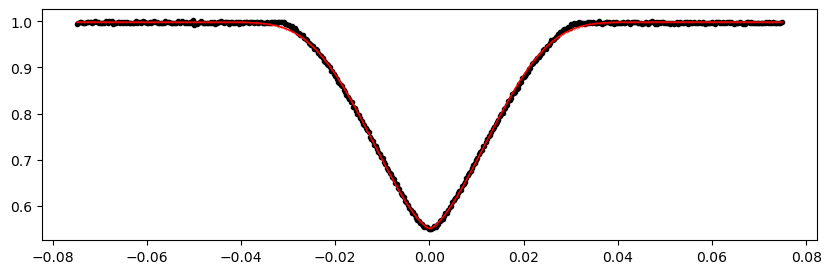

2248.583211 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 220.66it/s]


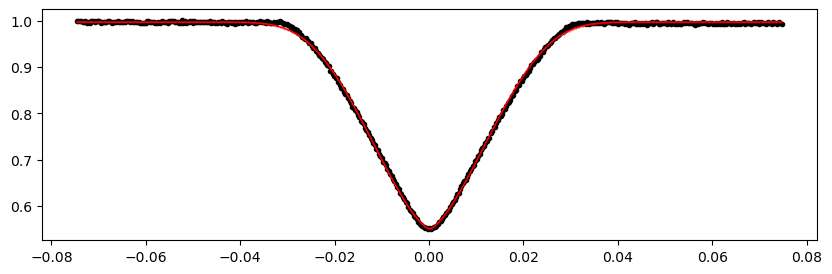

2253.272457 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:47<00:00, 212.61it/s]


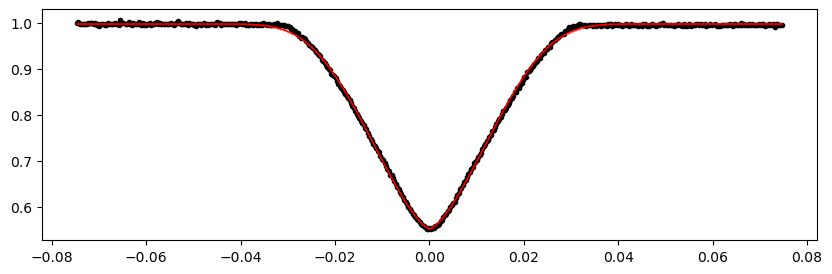

2257.961703 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 217.05it/s]


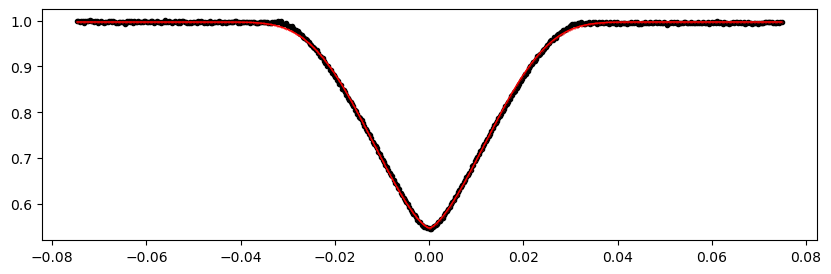

2262.650949 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 218.05it/s]


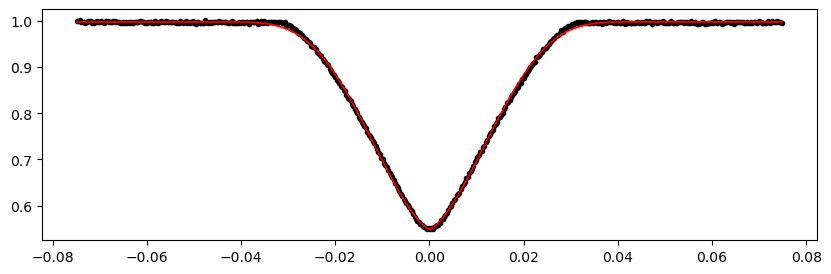

2267.3401949999998 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 418.30it/s]


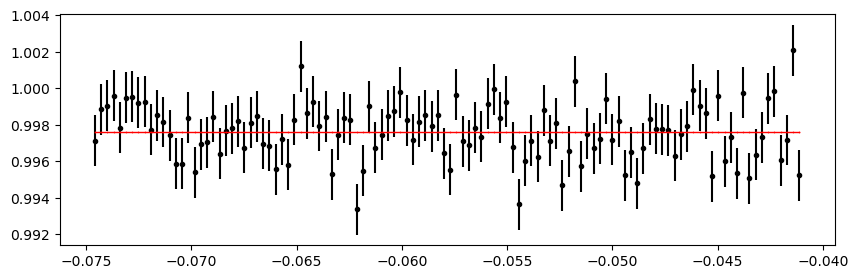

2272.0294409999997 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:36<00:00, 274.48it/s]


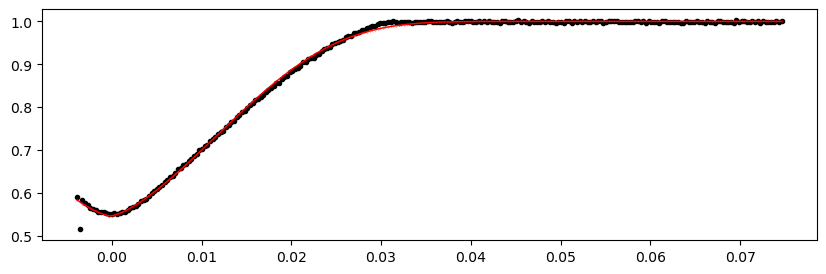

2276.7186869999996 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:47<00:00, 211.14it/s]


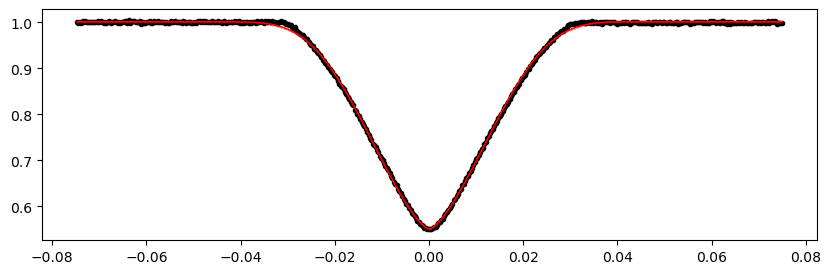

2286.097179 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 218.10it/s]


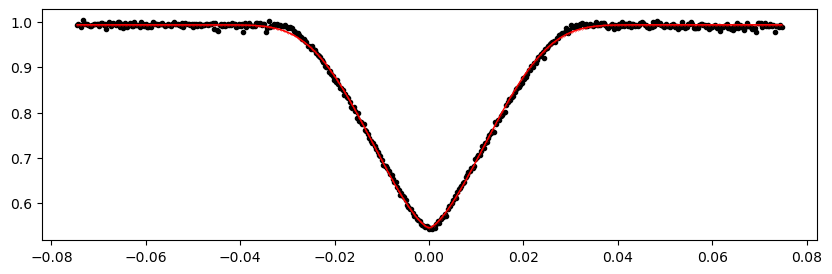

2290.786425 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 219.11it/s]


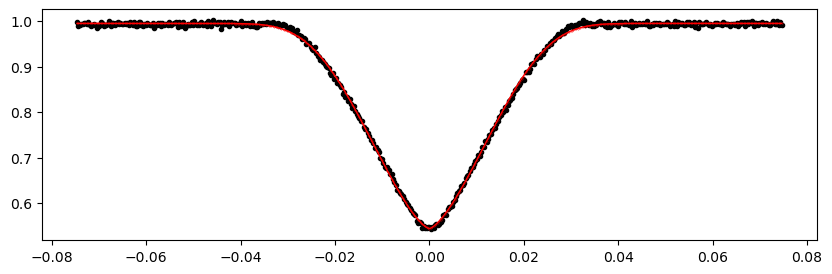

2295.4756709999997 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:40<00:00, 244.71it/s]


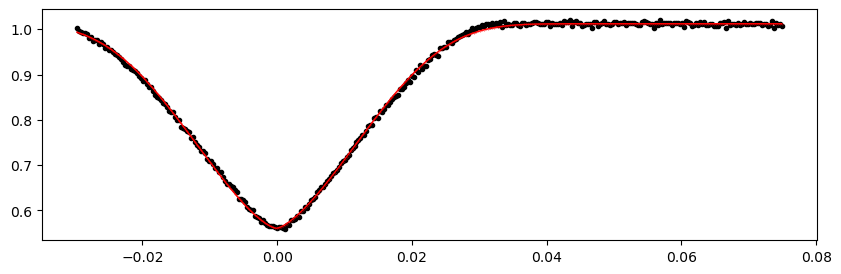

2300.164917 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:51<00:00, 193.57it/s]


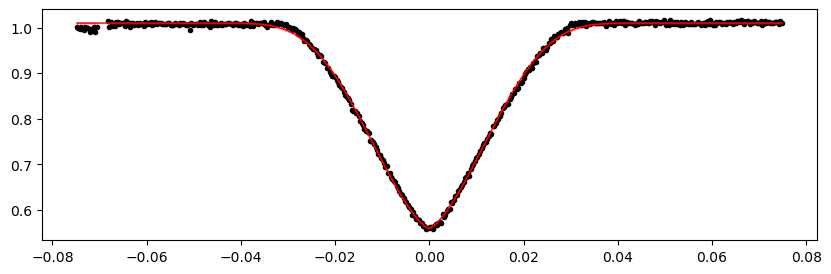

2304.854163 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:47<00:00, 212.12it/s]


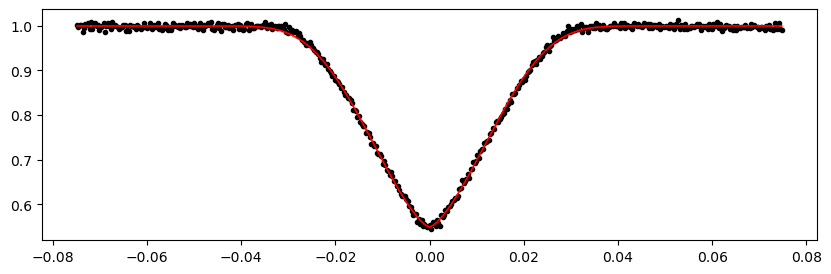

2309.543409 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 215.14it/s]


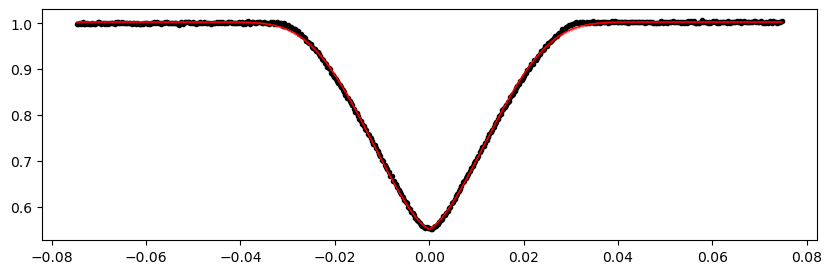

2314.232655 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 214.48it/s]


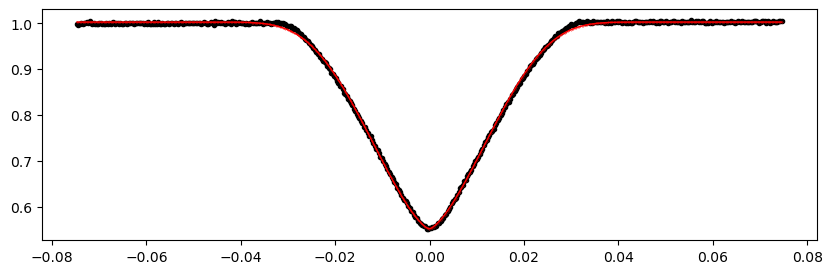

2318.9219009999997 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:42<00:00, 233.88it/s]


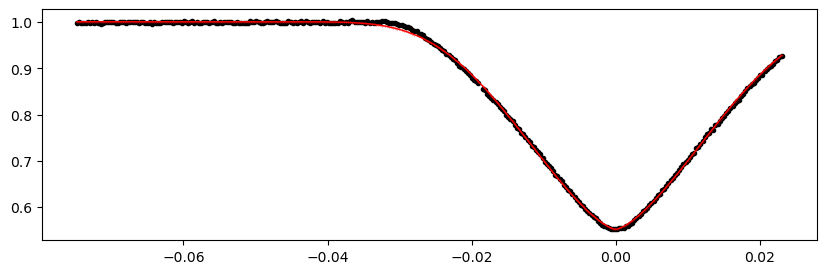

2323.6111469999996 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:47<00:00, 212.61it/s]


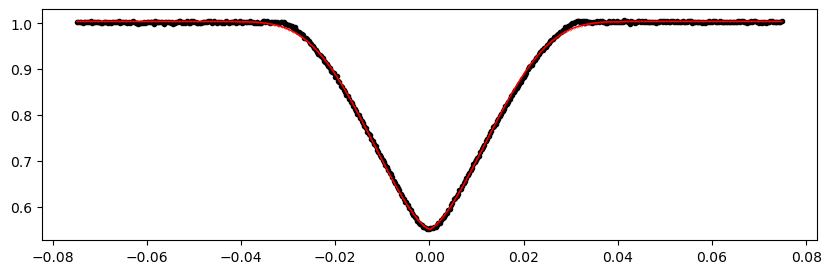

2328.300393 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:48<00:00, 205.68it/s]


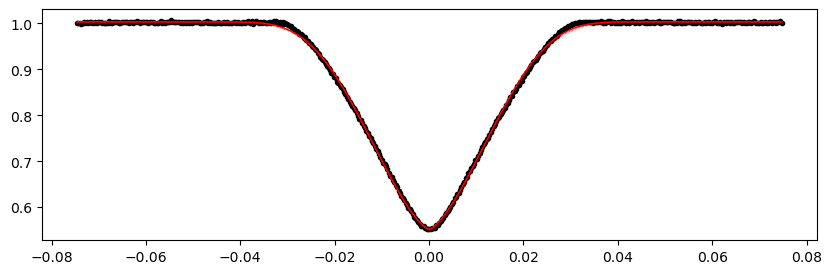

2337.678885 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:47<00:00, 209.88it/s]


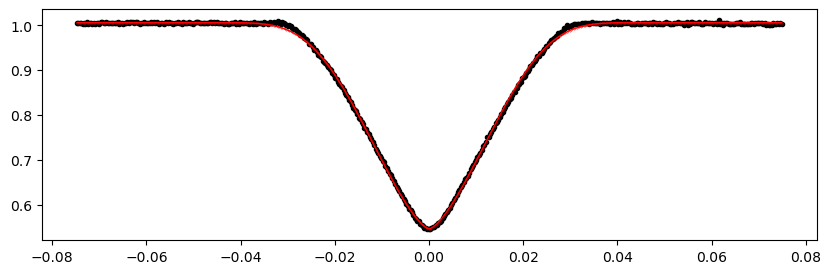

2342.3681309999997 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:49<00:00, 203.84it/s]


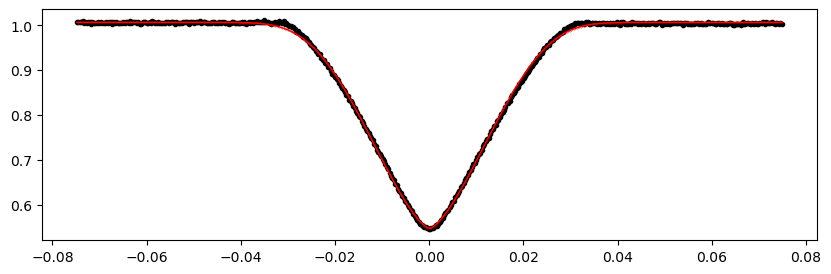

2351.746623 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:49<00:00, 203.02it/s]


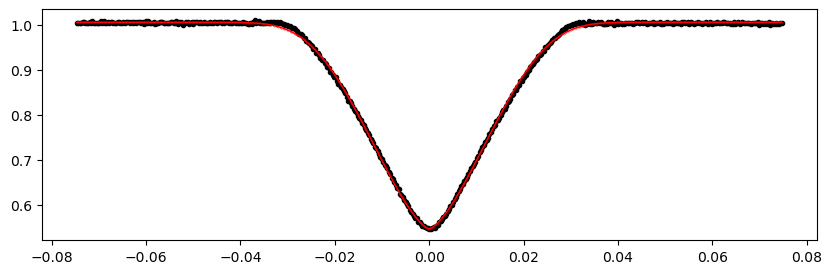

2356.435869 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:47<00:00, 209.59it/s]


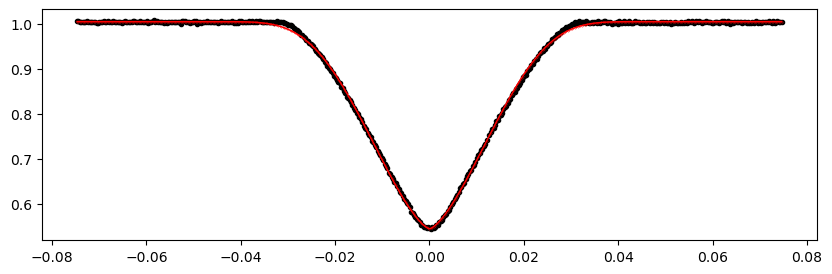

2365.8143609999997 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:48<00:00, 204.51it/s]


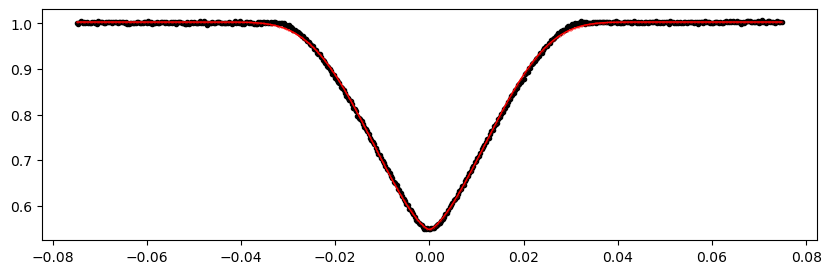

2370.5036069999996 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:48<00:00, 204.31it/s]


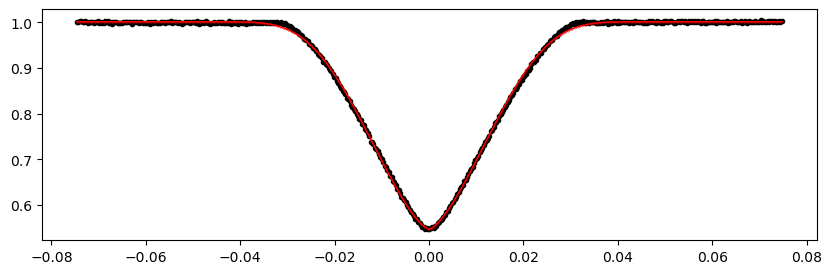

Time 2375.192853 does not have enough data points: 11
2379.882099 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:48<00:00, 204.82it/s]


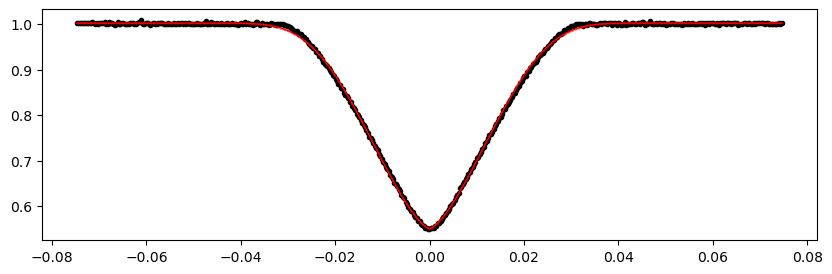

2384.571345 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:47<00:00, 208.78it/s]


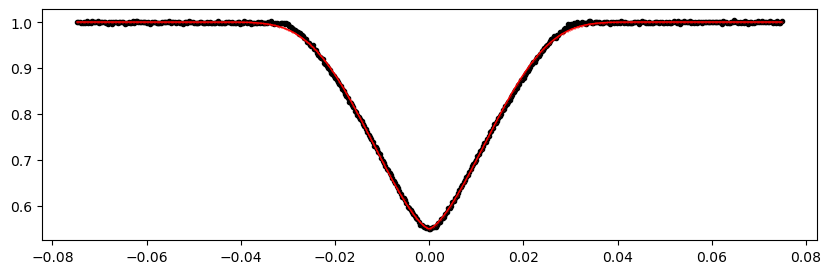

2389.2605909999997 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 222.16it/s]


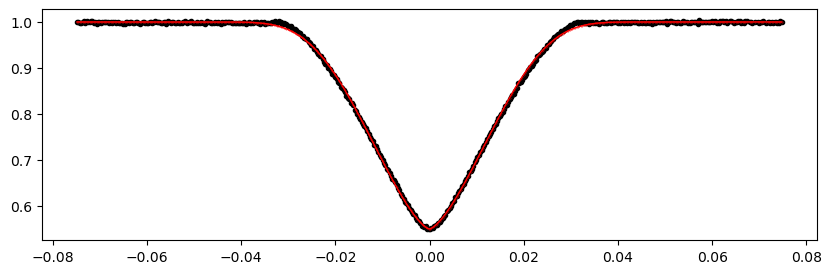

2966.037849 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 218.75it/s]


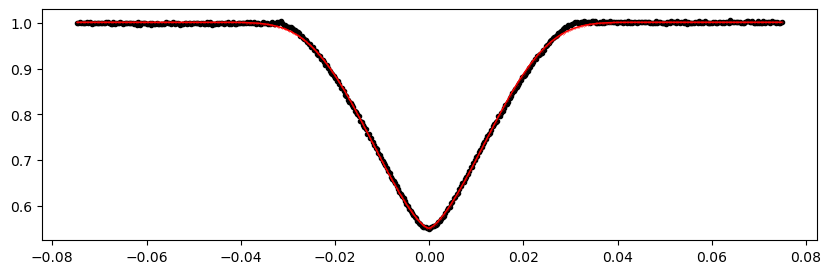

2970.7270949999997 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 221.99it/s]


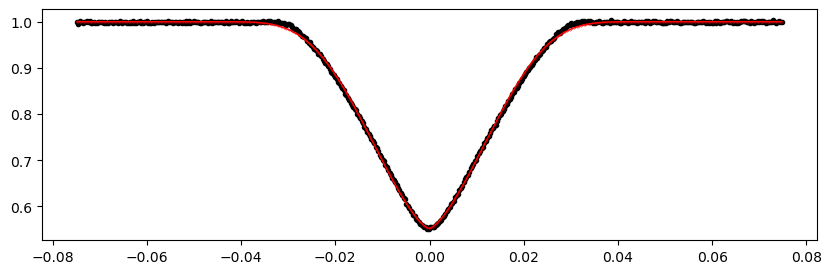

2980.105587 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 219.45it/s]


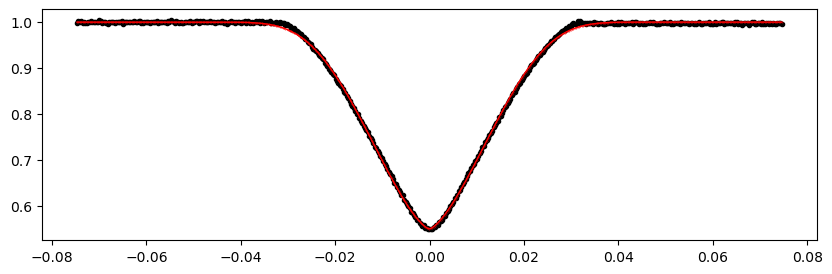

2984.794833 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 220.52it/s]


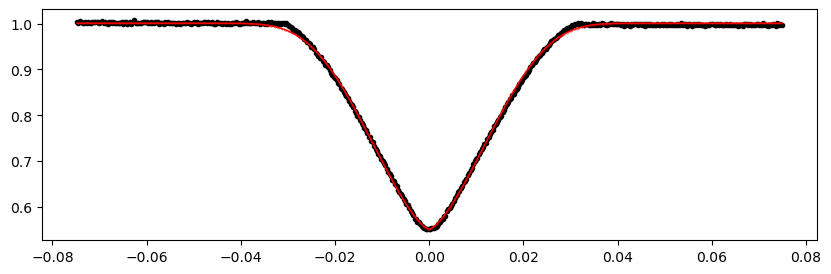

2994.1733249999997 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 221.65it/s]


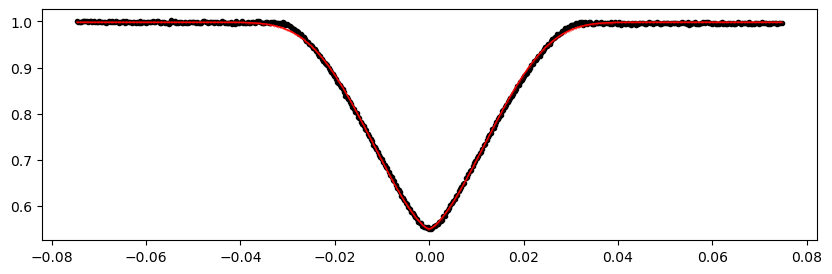

2998.8625709999997 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:48<00:00, 205.55it/s]


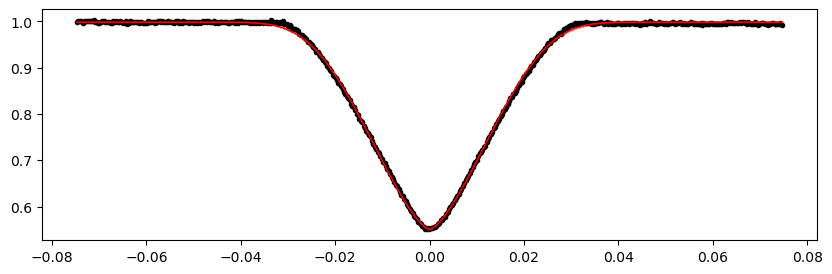

3003.5518169999996 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 218.75it/s]


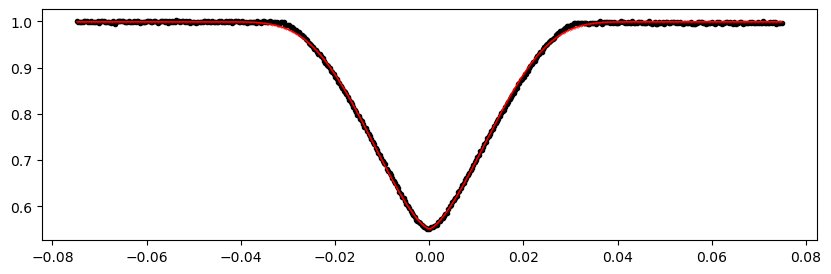

3008.2410629999995 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 219.36it/s]


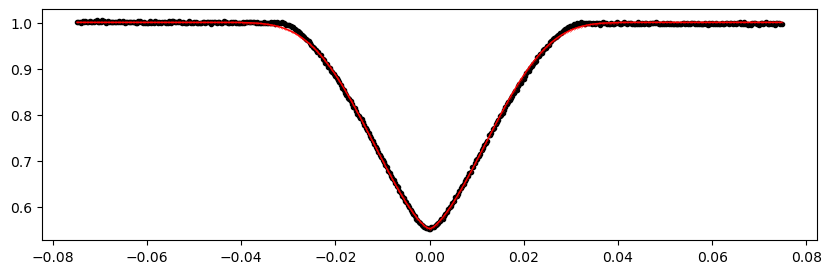

3012.930309 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 217.56it/s]


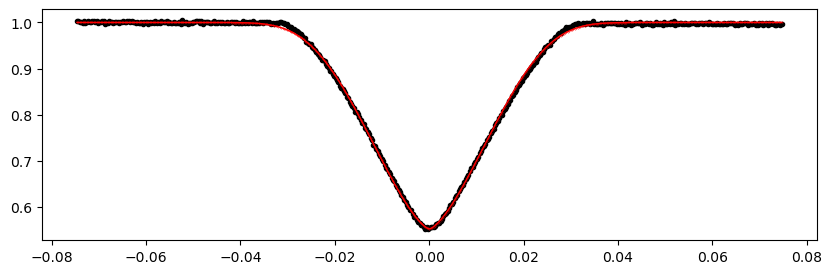

3017.6195549999998 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 216.57it/s]


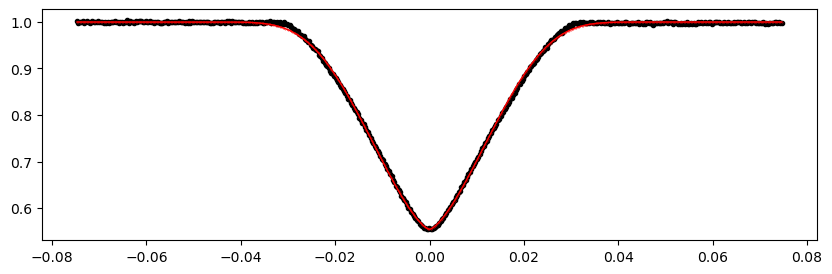

3022.308801 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:49<00:00, 203.32it/s]


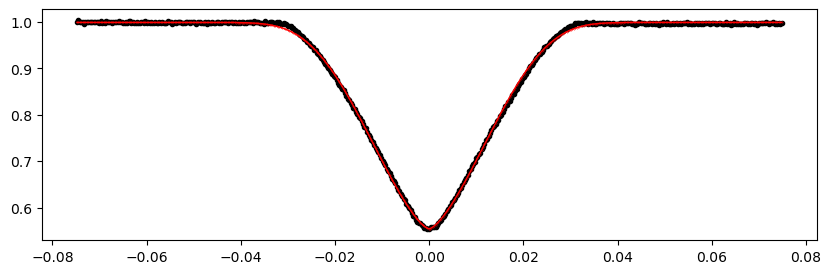

3026.998047 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:49<00:00, 202.21it/s]


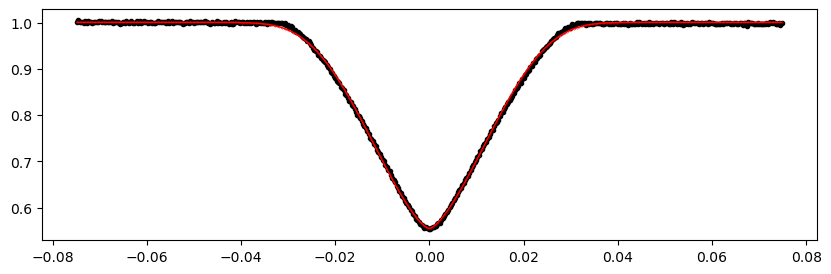

3031.687293 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:51<00:00, 194.75it/s]


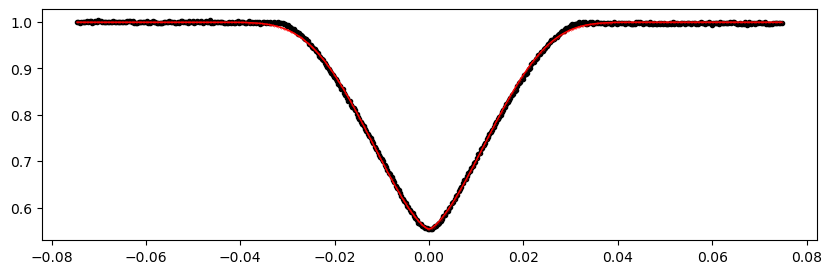

3036.376539 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:53<00:00, 186.09it/s]


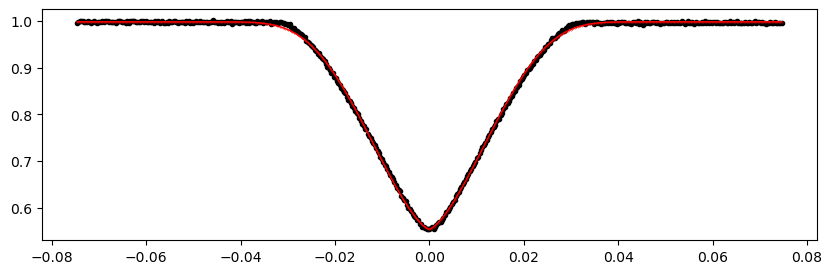

3041.065785 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 216.12it/s]


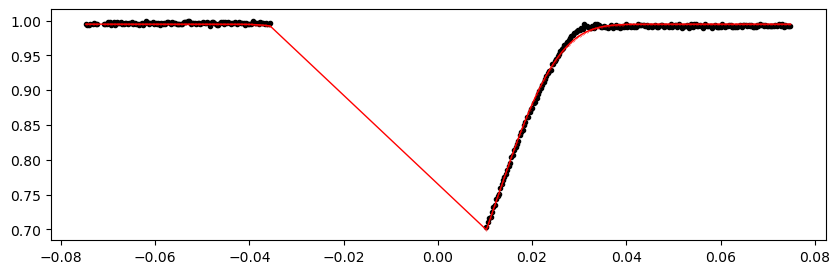

3045.7550309999997 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:47<00:00, 212.75it/s]


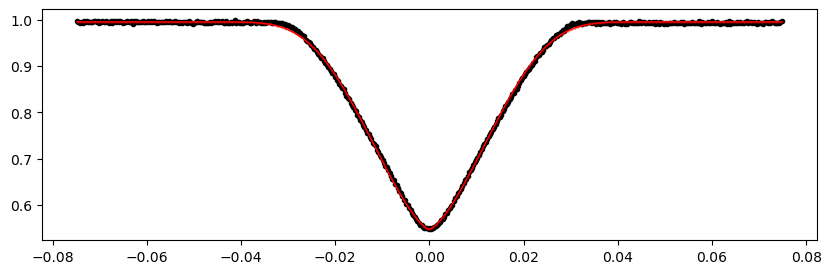

3050.4442769999996 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:49<00:00, 202.68it/s]


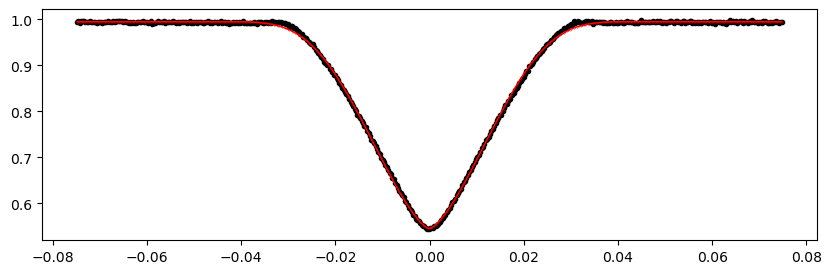

3055.1335229999995 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:40<00:00, 245.33it/s]


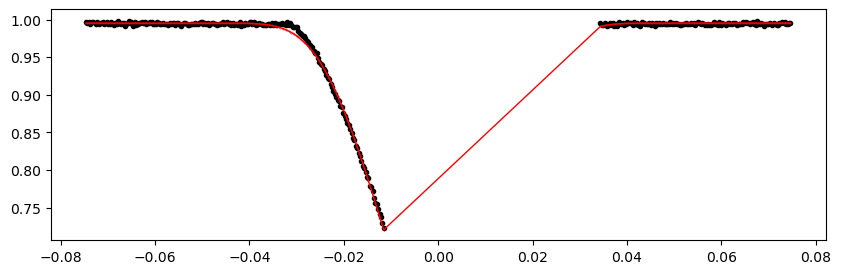

3059.822769 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:51<00:00, 193.70it/s]


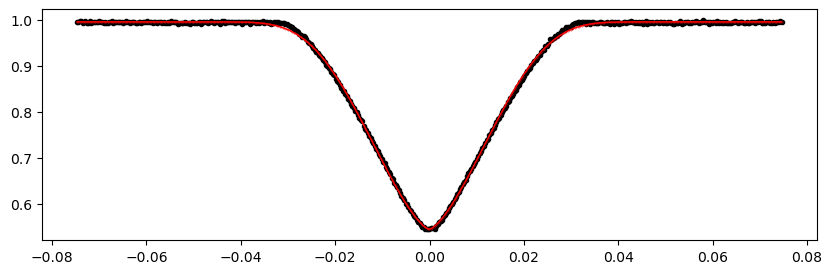

3064.512015 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 215.11it/s]


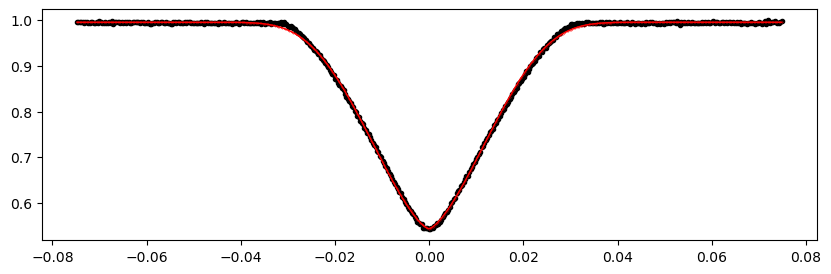

3069.201261 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:54<00:00, 184.08it/s]


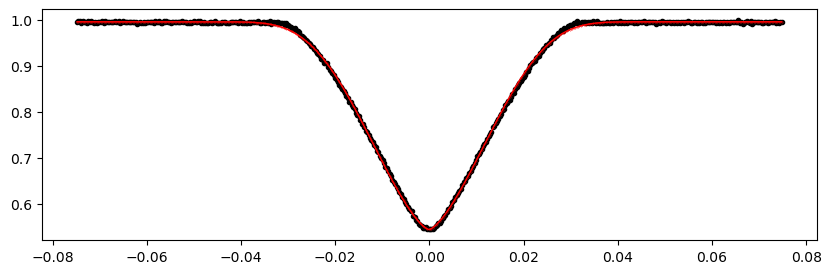

3073.890507 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:53<00:00, 188.52it/s]


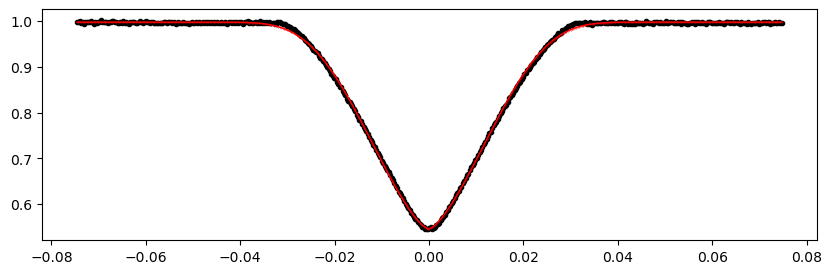

3078.579753 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 218.27it/s]


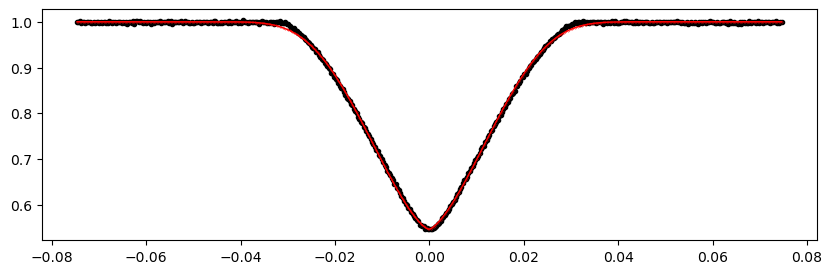

3083.268999 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:41<00:00, 238.78it/s]


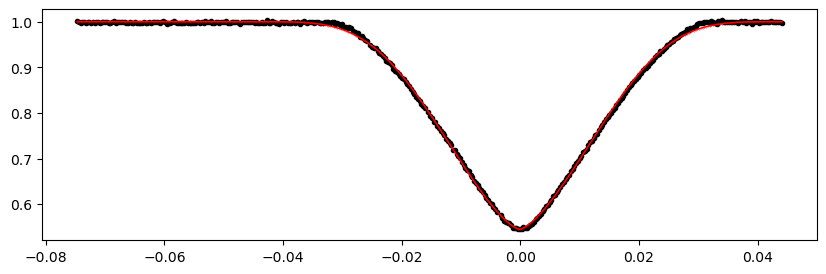

3087.958245 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:51<00:00, 195.16it/s]


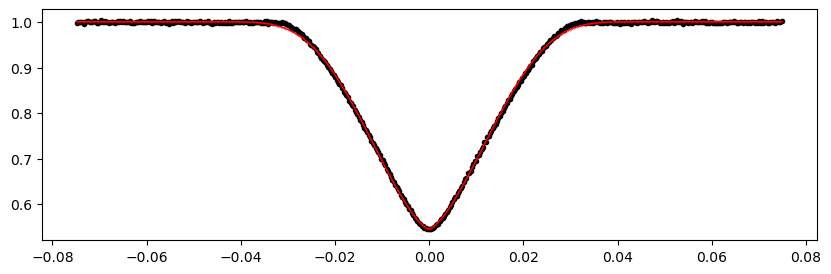

3092.6474909999997 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:52<00:00, 189.78it/s]


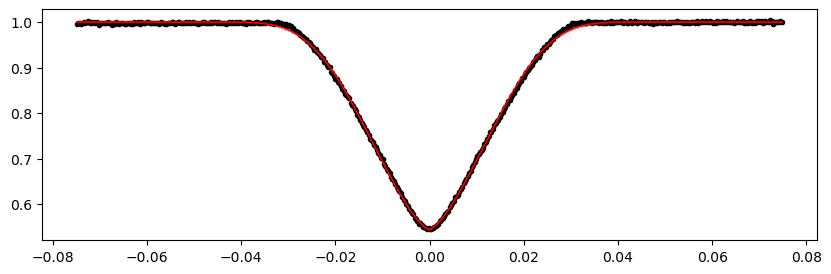

Time 3097.3367369999996 does not have enough data points: 10
3102.0259829999995 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:51<00:00, 193.74it/s]


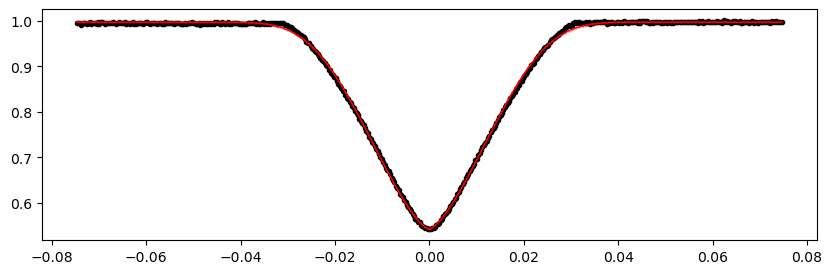

3106.715229 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:53<00:00, 185.42it/s]


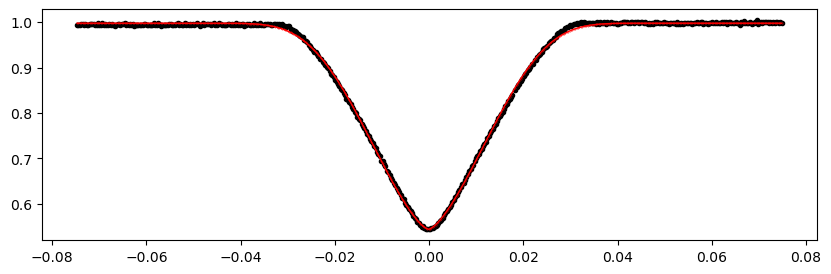

3111.404475 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:38<00:00, 256.46it/s]


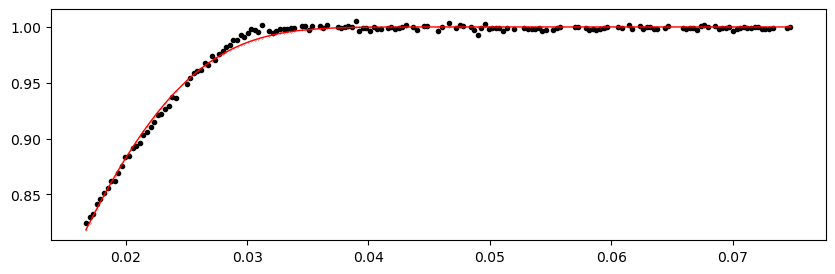

3116.0937209999997 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:55<00:00, 180.13it/s]


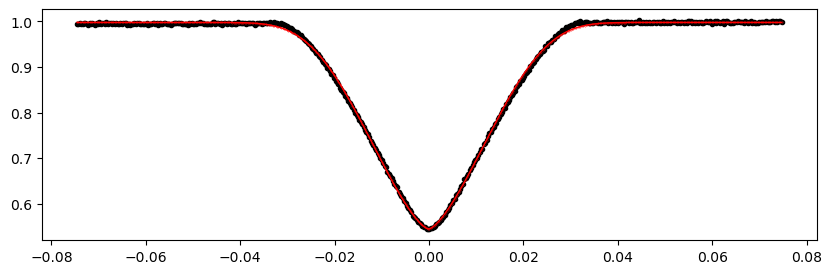

3120.782967 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:55<00:00, 179.75it/s]


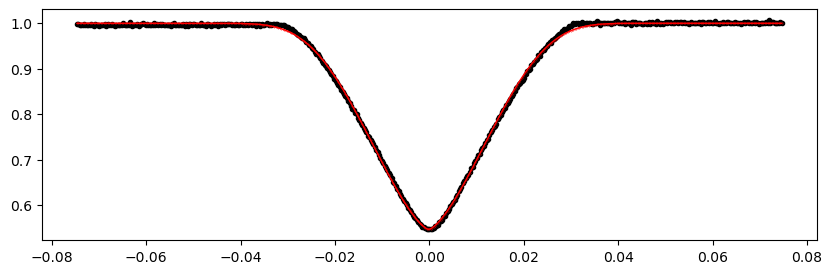

3130.161459 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:59<00:00, 168.29it/s]


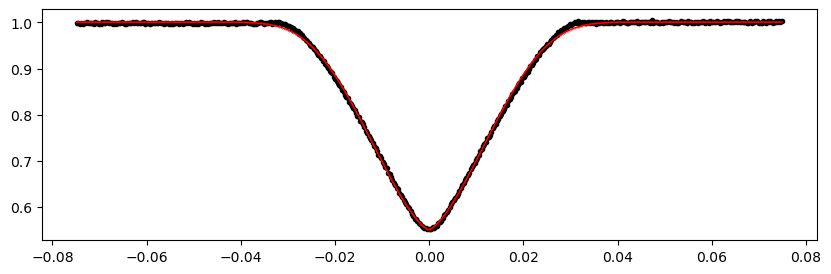

3134.850705 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:57<00:00, 175.07it/s]


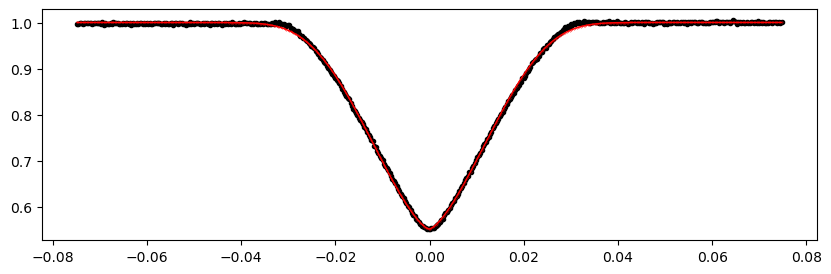

3144.2291969999997 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:55<00:00, 178.69it/s]


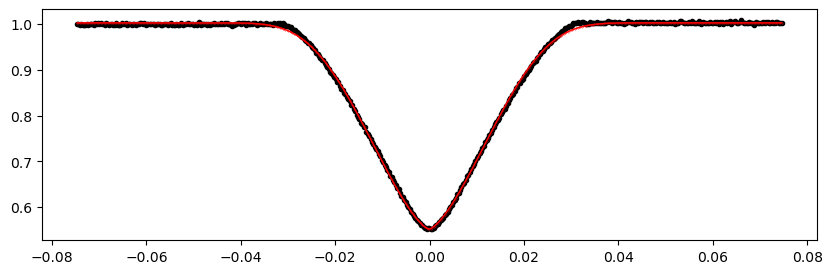

3148.9184429999996 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:50<00:00, 197.96it/s]


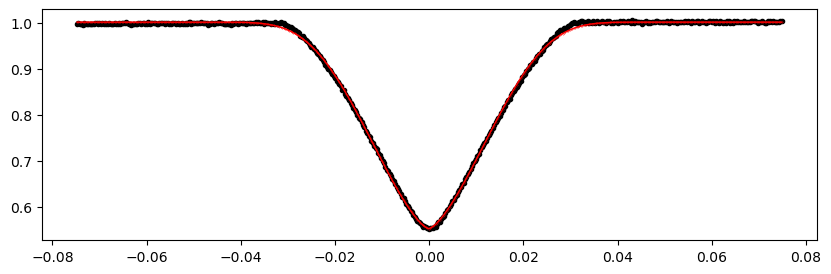

3158.296935 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:47<00:00, 211.18it/s]


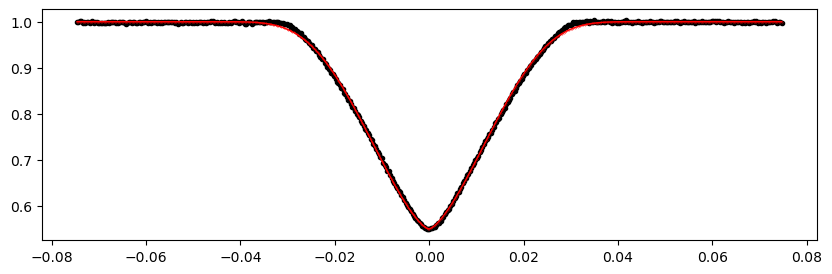

3162.9861809999998 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:44<00:00, 227.25it/s]


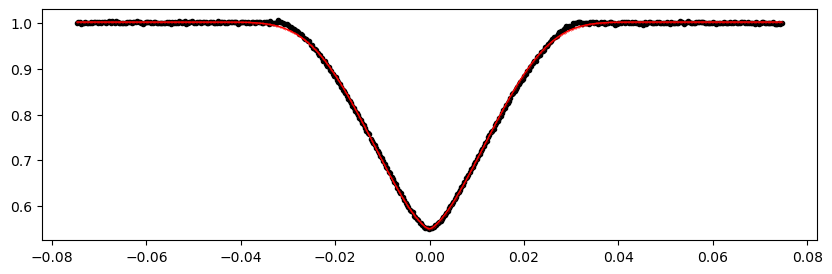

3172.364673 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:44<00:00, 225.62it/s]


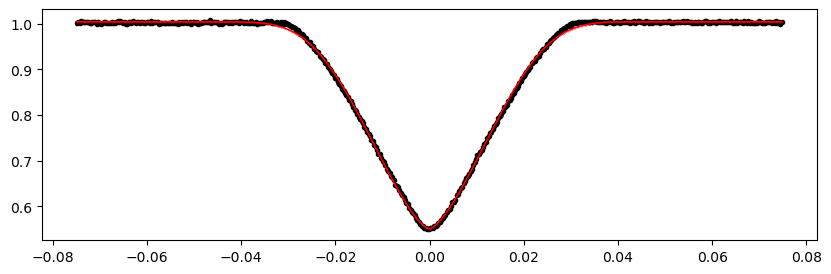

3177.053919 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 220.46it/s]


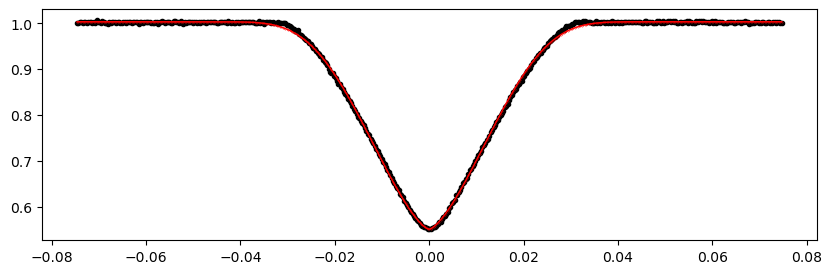

3186.432411 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:47<00:00, 210.44it/s]


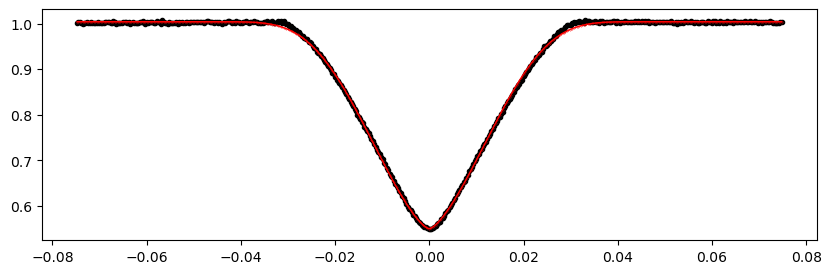

3191.1216569999997 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 213.86it/s]


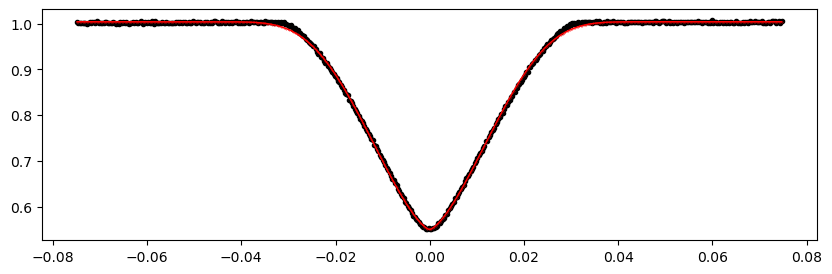

3195.8109029999996 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 213.31it/s]


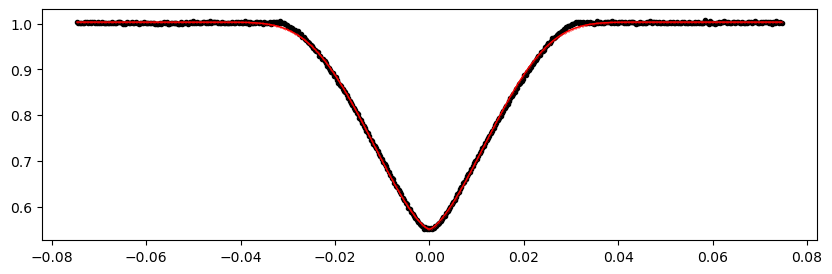

3200.5001489999995 1.0011142495421985 -0.4510105175356701 0.12499719178254205


100%|███████████████████████████████████████████████████████| 10000/10000 [00:54<00:00, 182.83it/s]


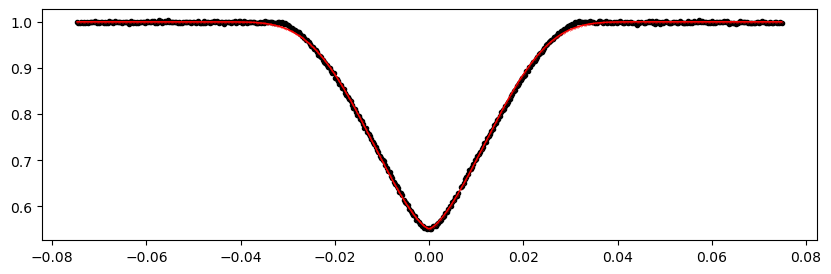

Fitting individual secondary eclipses...
Creating new manifest file
1411.5528 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:52<00:00, 189.79it/s]


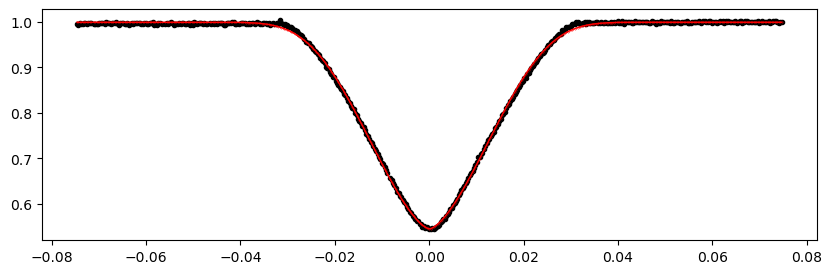

1416.2420459999998 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 216.72it/s]


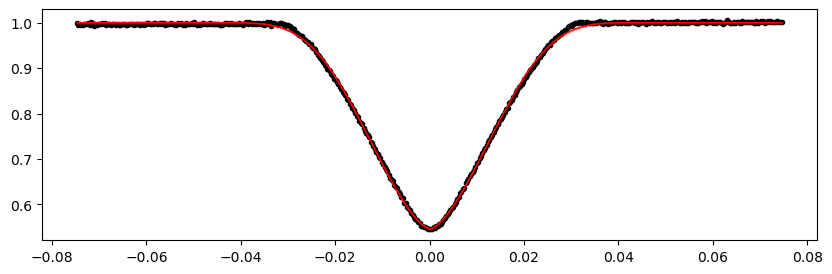

1420.931292 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:21<00:00, 465.59it/s]


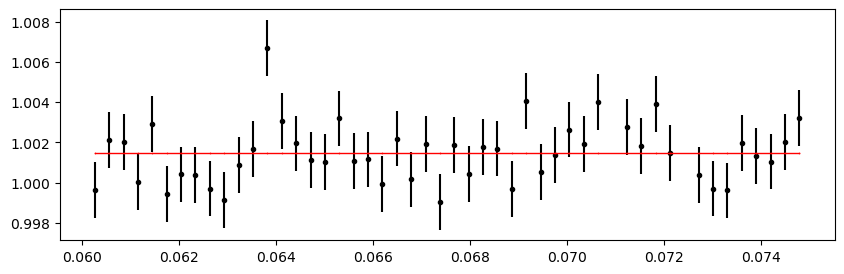

1425.620538 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 218.11it/s]


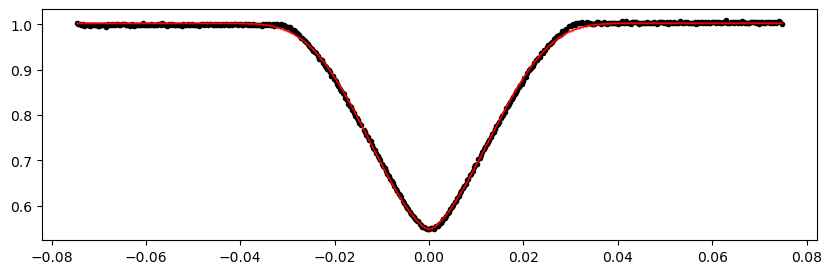

1430.309784 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:44<00:00, 224.23it/s]


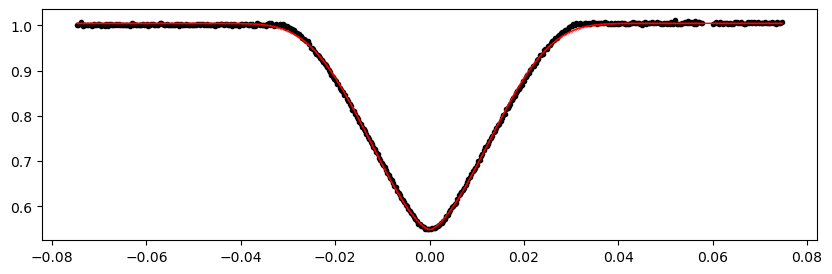

1434.99903 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 219.86it/s]


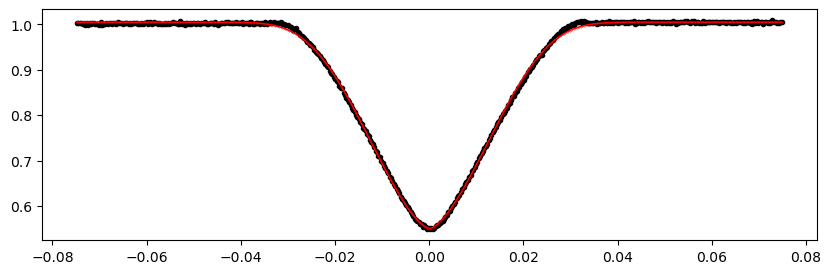

1439.6882759999999 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:47<00:00, 212.06it/s]


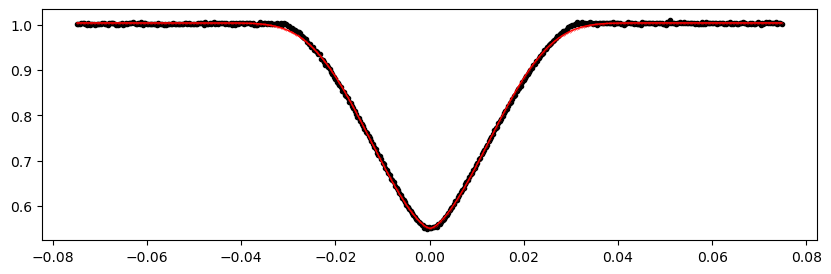

1444.377522 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:48<00:00, 204.72it/s]


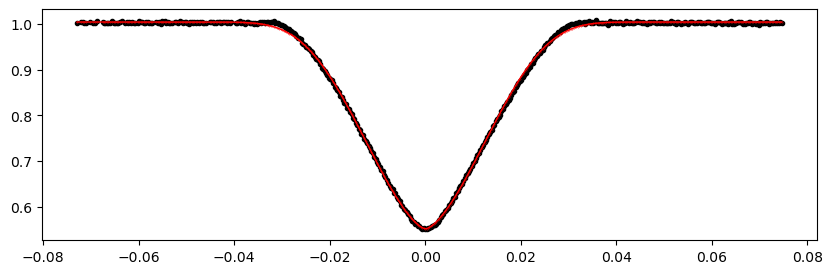

1449.066768 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 214.14it/s]


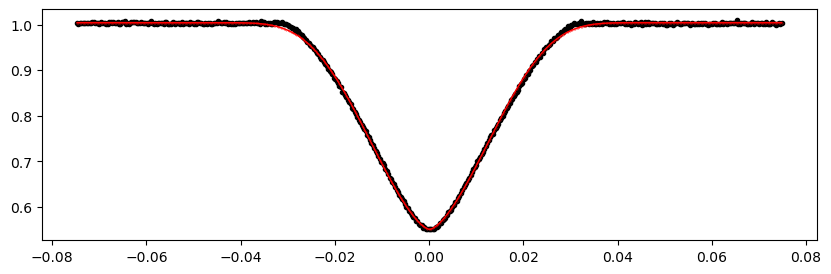

1453.7560139999998 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:54<00:00, 183.75it/s]


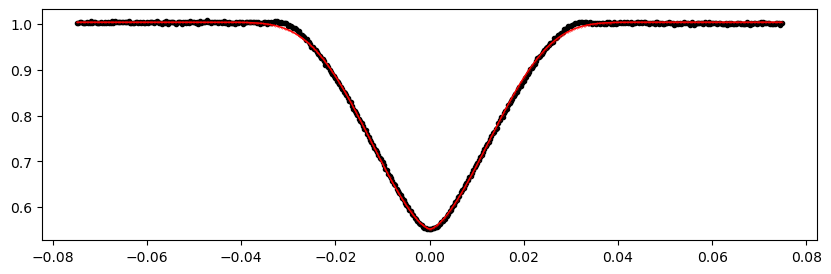

1458.44526 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:52<00:00, 190.63it/s]


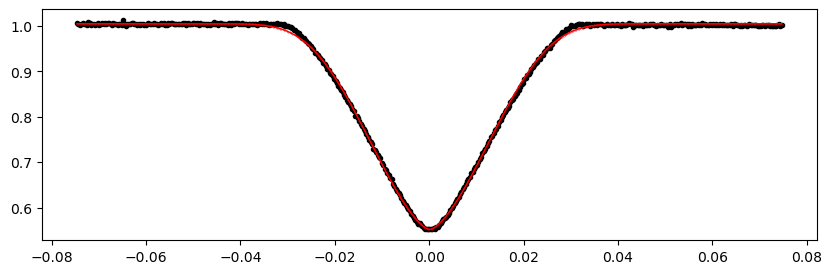

1463.1345059999999 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 213.00it/s]


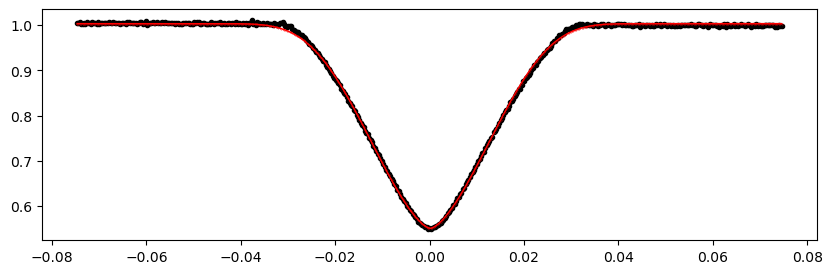

1472.512998 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:47<00:00, 210.68it/s]


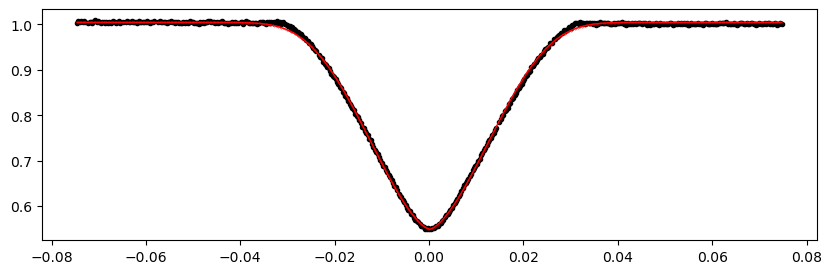

1477.2022439999998 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 402.87it/s]


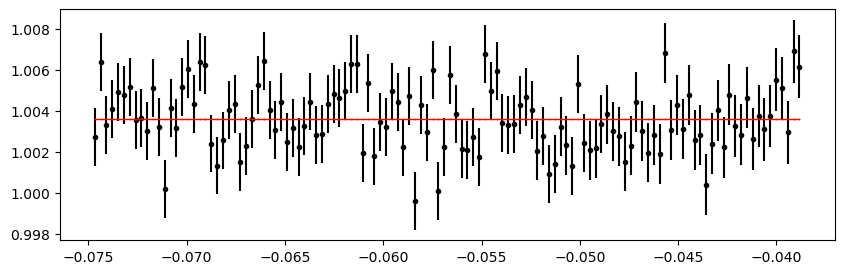

1481.89149 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 215.42it/s]


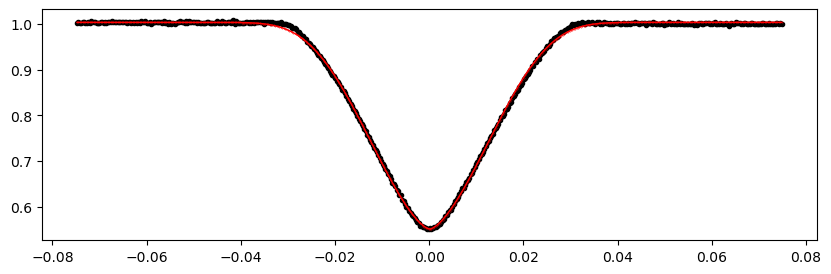

1486.580736 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 212.97it/s]


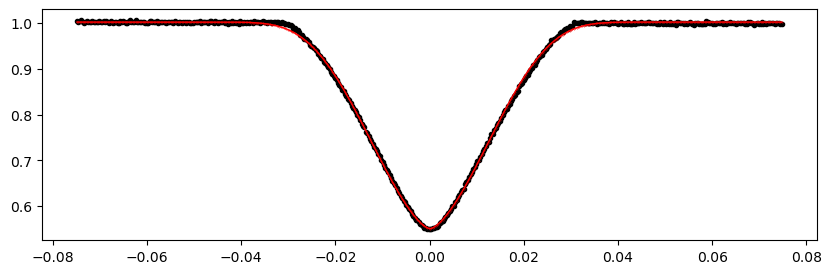

1495.959228 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 213.59it/s]


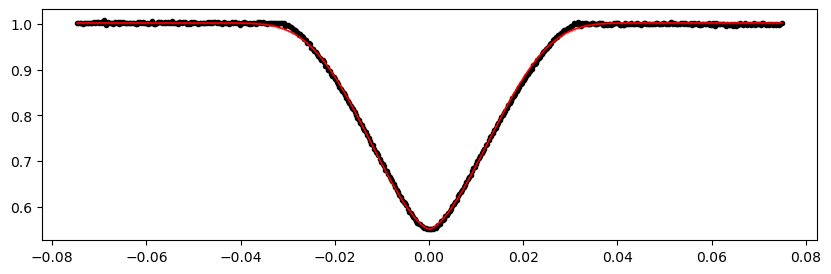

1500.6484739999999 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 214.81it/s]


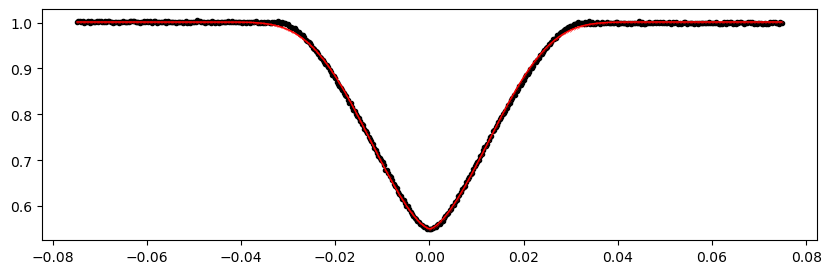

1505.33772 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 213.88it/s]


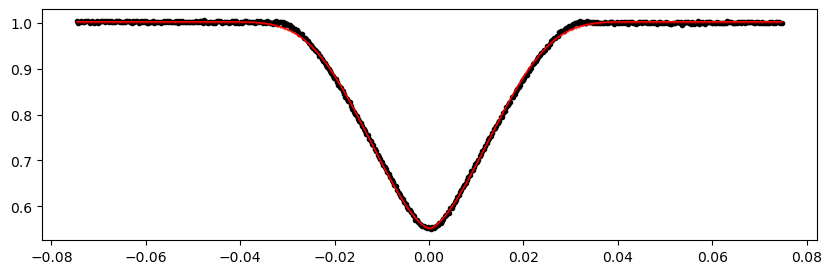

1510.026966 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 214.18it/s]


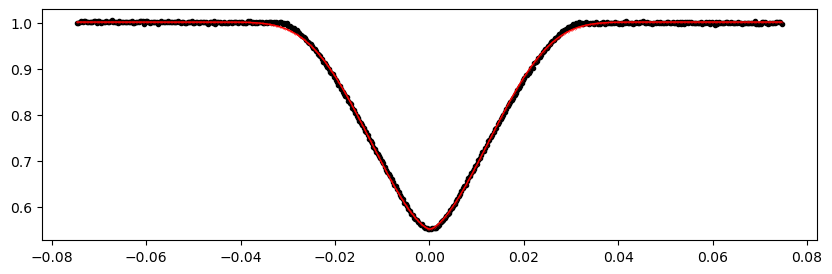

1514.7162119999998 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 212.85it/s]


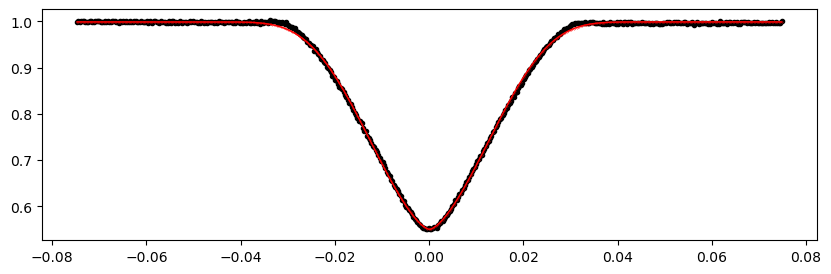

1519.405458 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 218.31it/s]


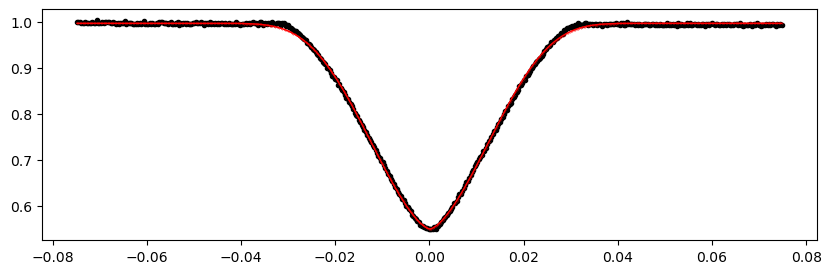

1524.0947039999999 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 219.80it/s]


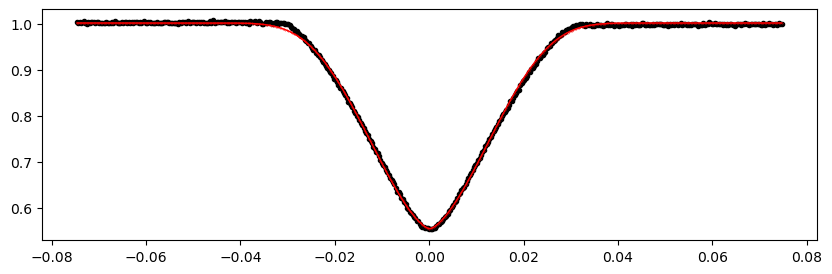

1528.78395 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 216.61it/s]


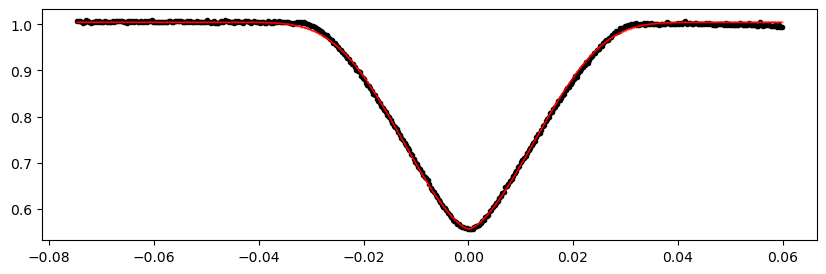

1538.1624419999998 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 213.87it/s]


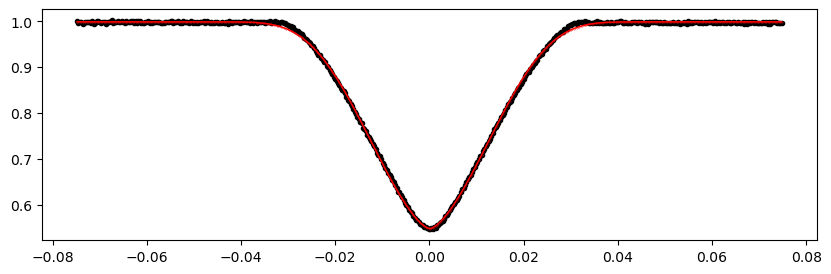

1547.5409339999999 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:50<00:00, 199.35it/s]


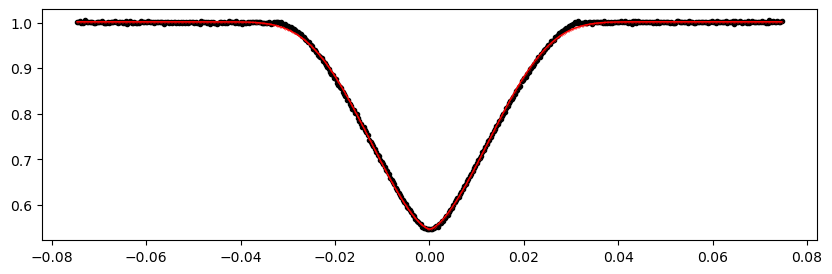

1552.23018 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:47<00:00, 212.63it/s]


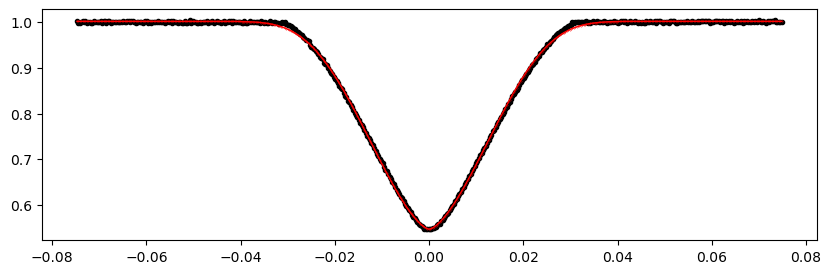

1561.6086719999998 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 215.26it/s]


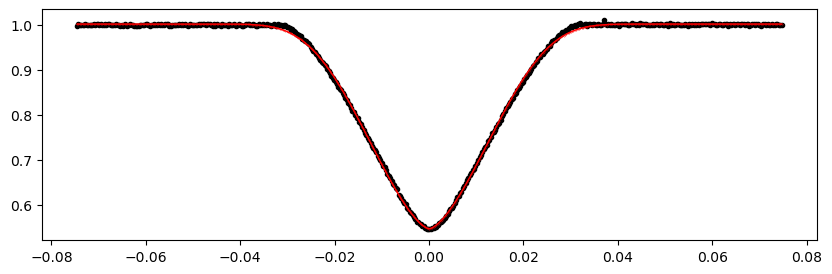

1566.297918 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 219.08it/s]


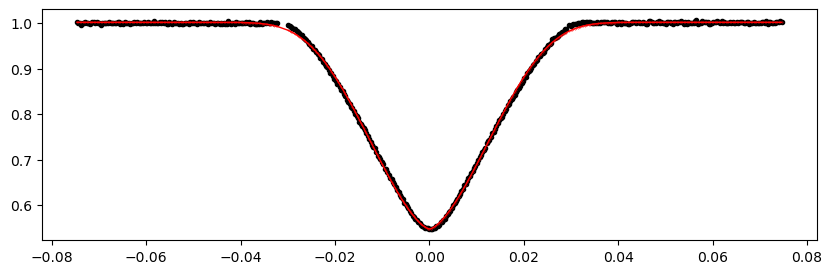

1575.67641 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 219.19it/s]


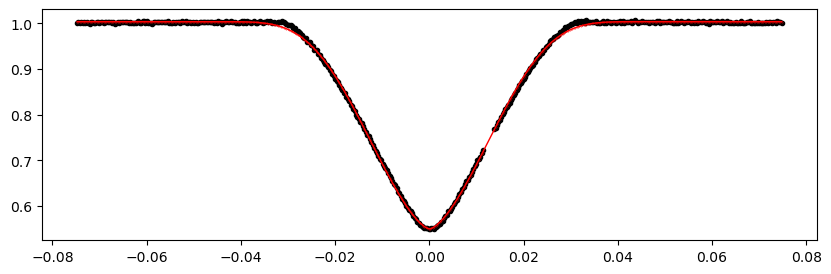

1580.365656 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 214.38it/s]


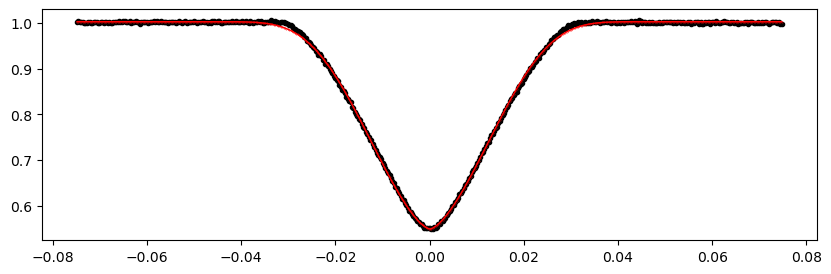

1589.744148 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:47<00:00, 211.18it/s]


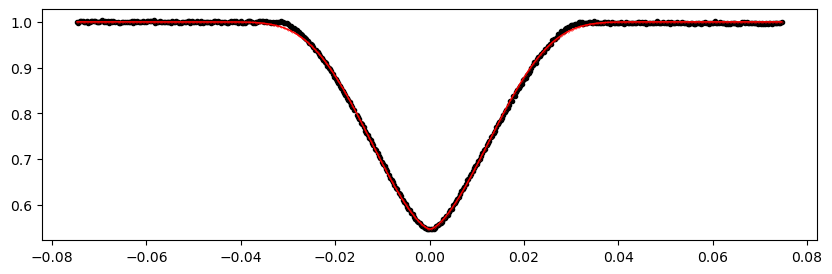

1594.433394 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:47<00:00, 211.16it/s]


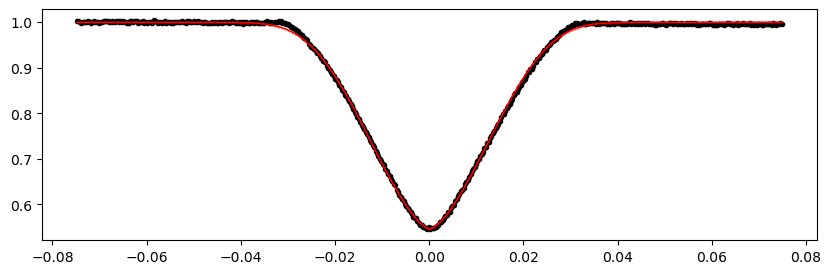

1631.9473619999999 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:47<00:00, 209.57it/s]


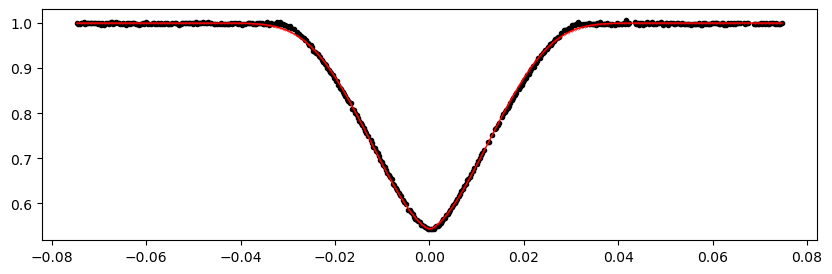

1636.6366079999998 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 213.56it/s]


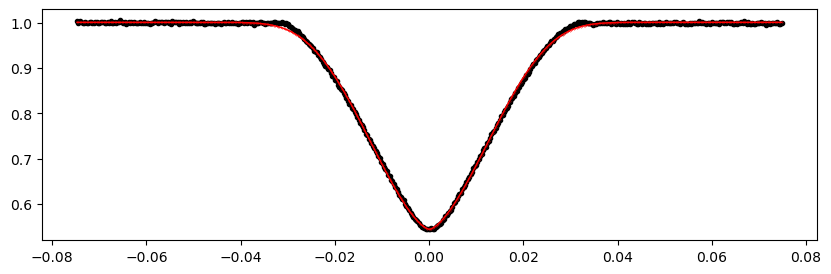

1646.0150999999998 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:44<00:00, 225.66it/s]


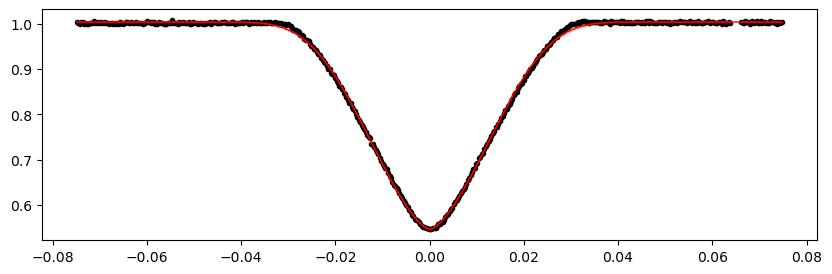

1650.704346 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 216.39it/s]


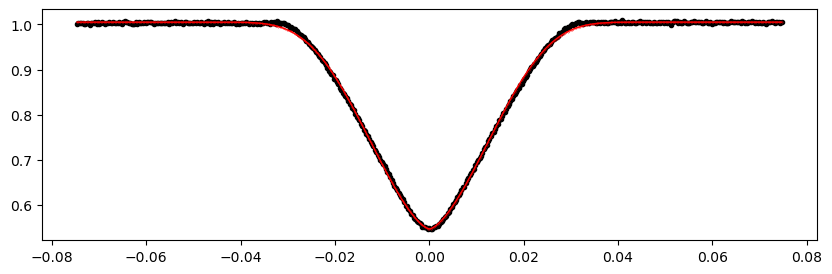

1655.393592 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:44<00:00, 227.08it/s]


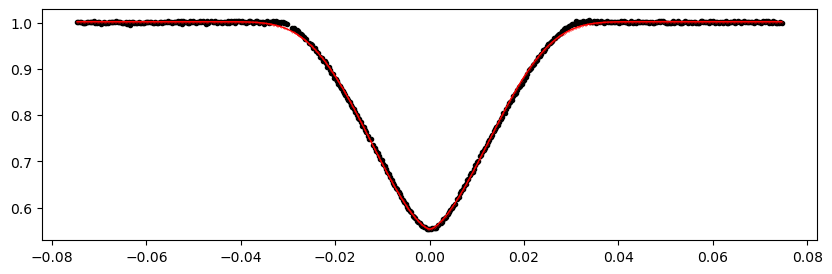

1660.0828379999998 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 217.75it/s]


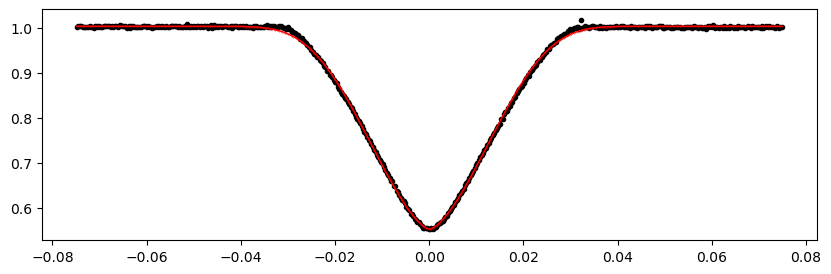

1664.772084 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:44<00:00, 224.83it/s]


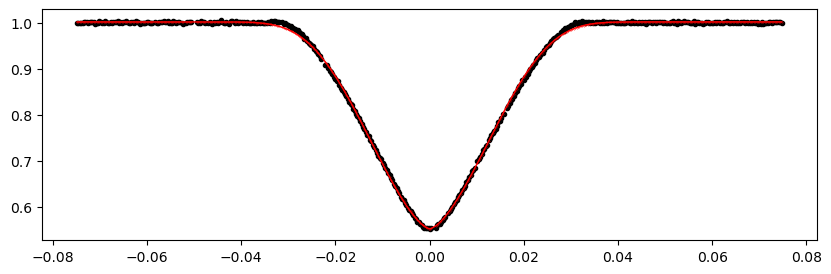

1669.4613299999999 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:43<00:00, 227.69it/s]


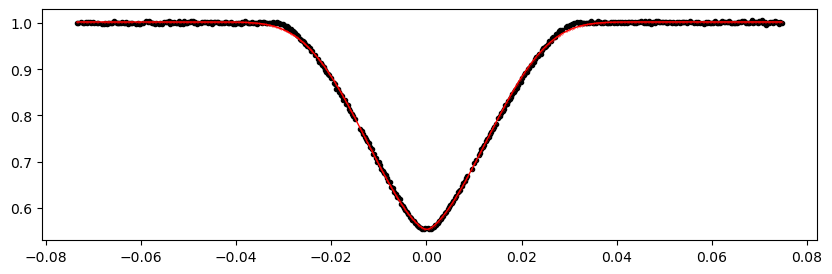

1674.150576 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:48<00:00, 207.84it/s]


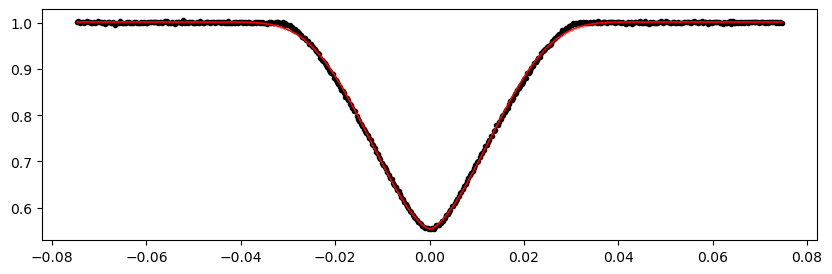

1678.839822 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:47<00:00, 209.83it/s]


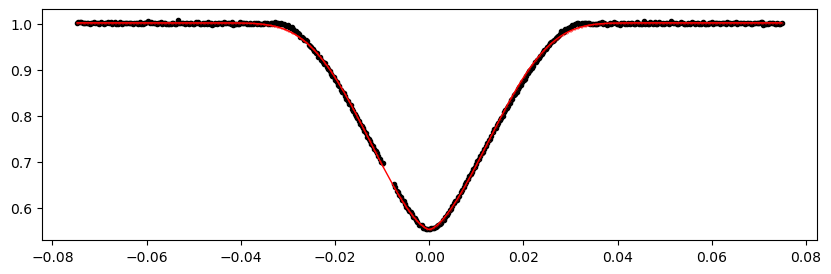

2039.911764 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:51<00:00, 195.11it/s]


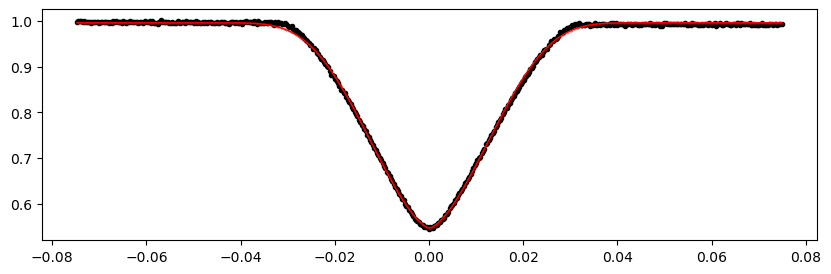

2044.6010099999999 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:49<00:00, 203.22it/s]


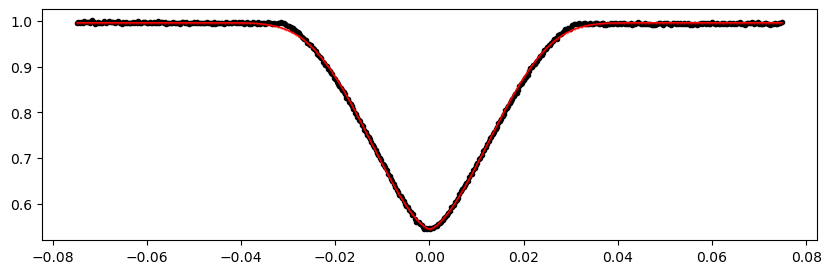

2049.2902559999998 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 221.72it/s]


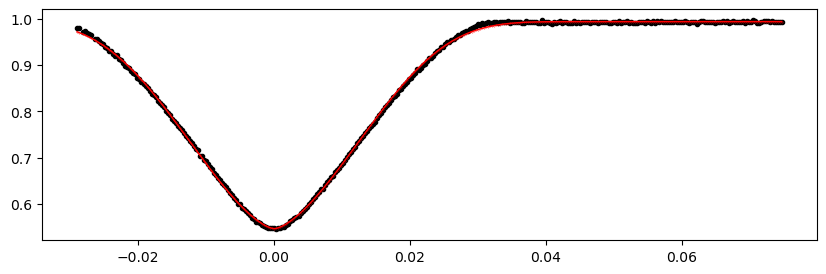

2053.979502 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:49<00:00, 201.93it/s]


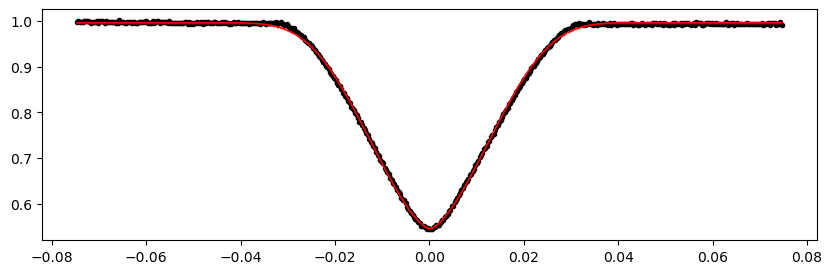

2058.668748 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:48<00:00, 206.44it/s]


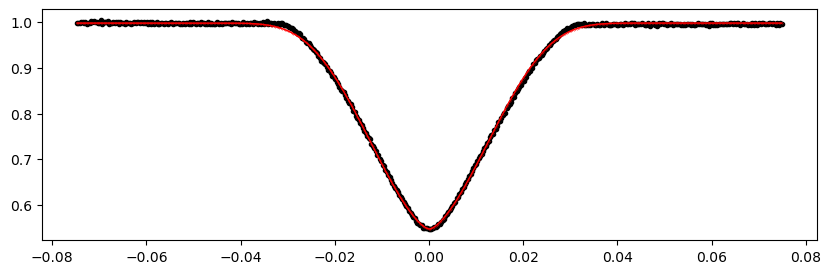

2091.49347 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:47<00:00, 211.60it/s]


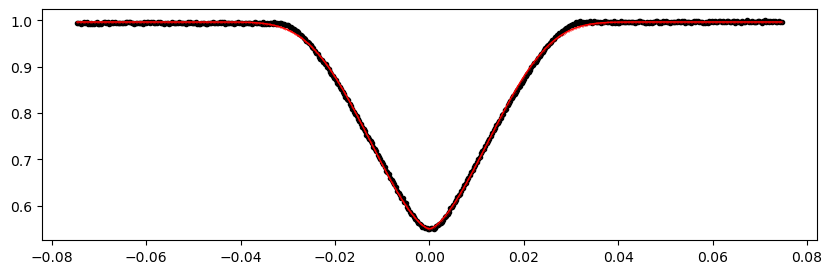

2096.182716 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:47<00:00, 210.59it/s]


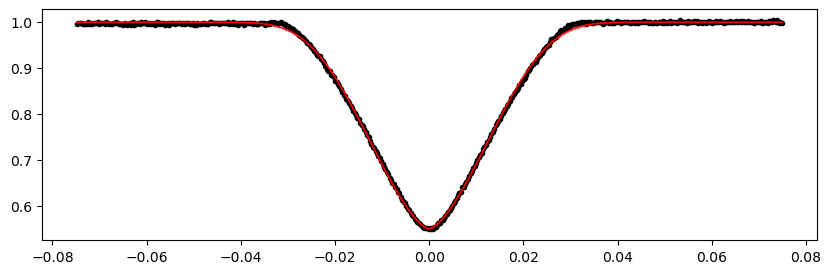

2105.561208 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:50<00:00, 197.84it/s]


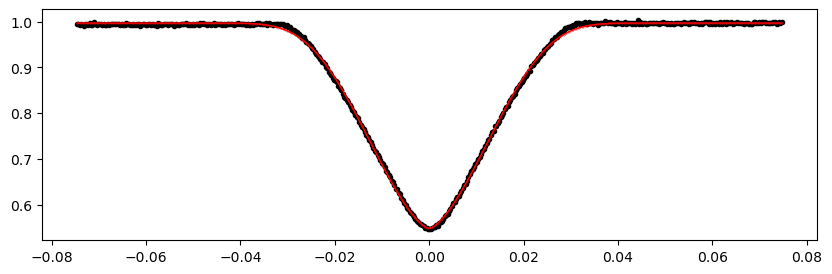

2110.250454 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:48<00:00, 204.96it/s]


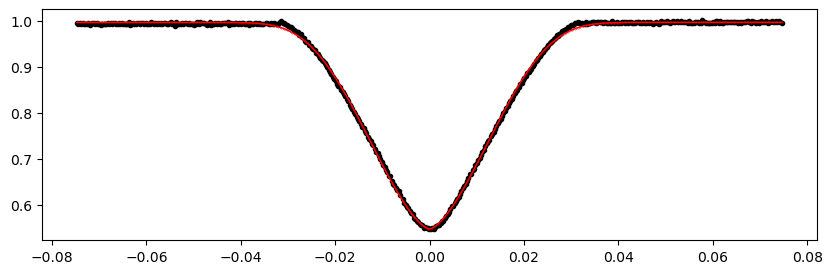

2119.628946 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:47<00:00, 210.22it/s]


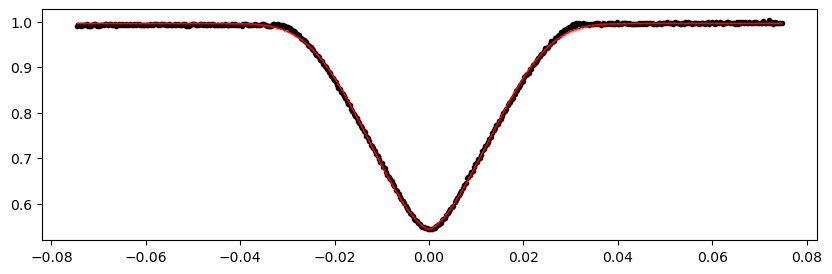

2124.3181919999997 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:47<00:00, 209.11it/s]


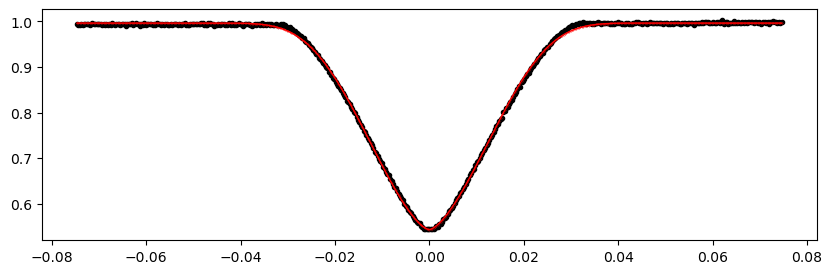

2133.696684 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:47<00:00, 209.40it/s]


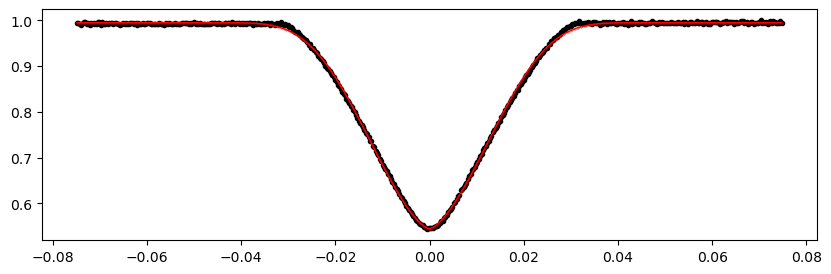

2138.38593 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:47<00:00, 212.36it/s]


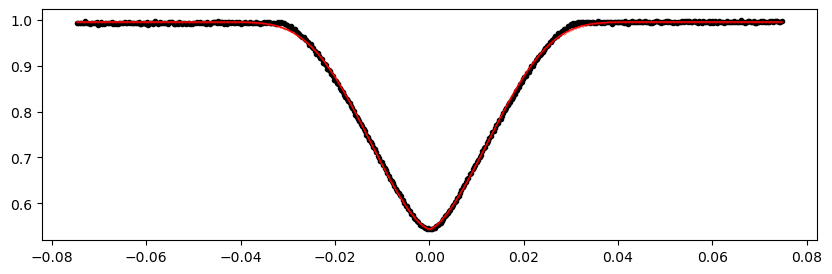

2147.7644219999997 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:47<00:00, 210.22it/s]


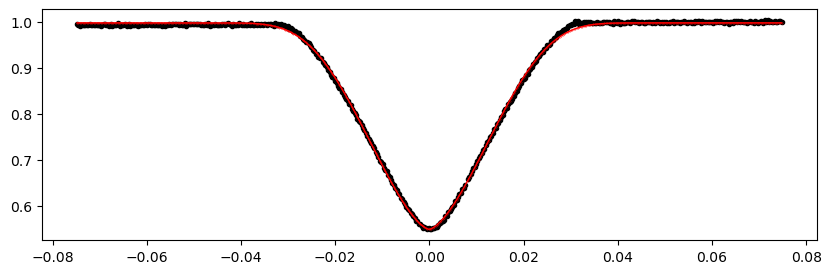

2152.453668 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:47<00:00, 210.47it/s]


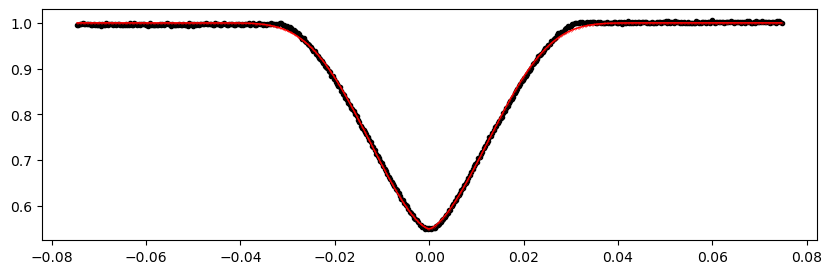

2161.83216 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:47<00:00, 208.75it/s]


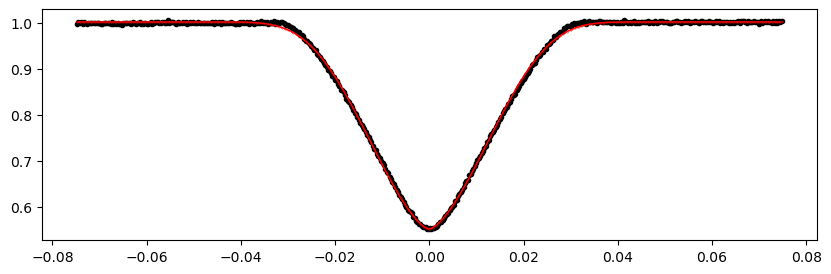

2166.521406 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:47<00:00, 208.38it/s]


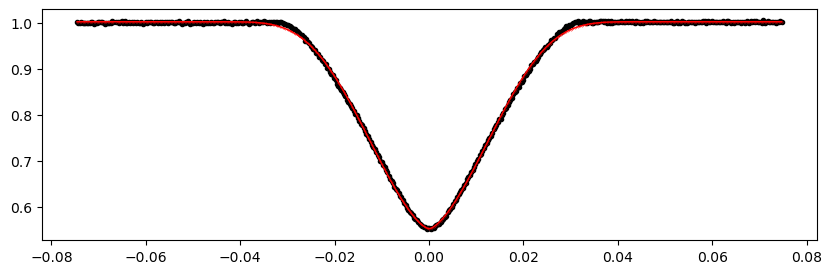

2175.8998979999997 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:48<00:00, 208.28it/s]


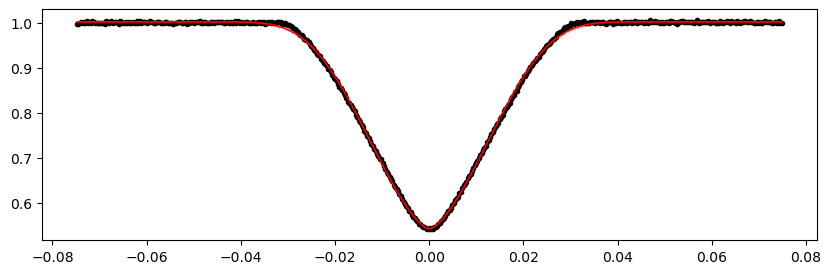

2180.589144 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:47<00:00, 210.05it/s]


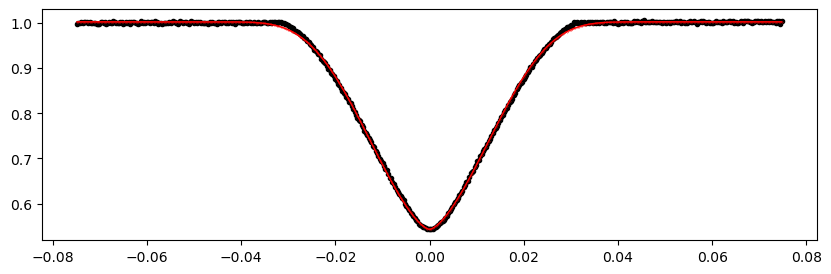

2185.27839 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:49<00:00, 202.31it/s]


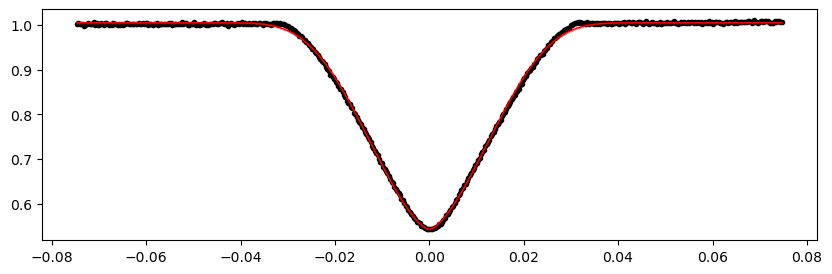

2189.967636 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:49<00:00, 200.83it/s]


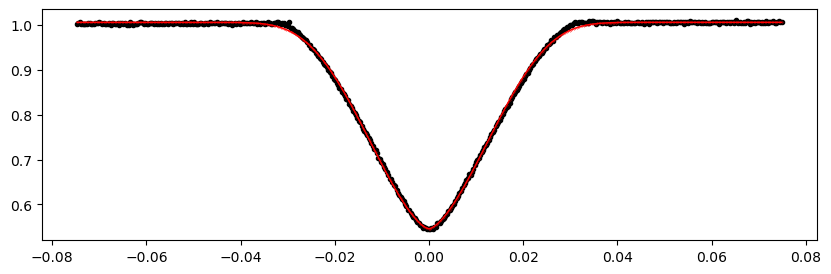

2194.6568819999998 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:48<00:00, 207.41it/s]


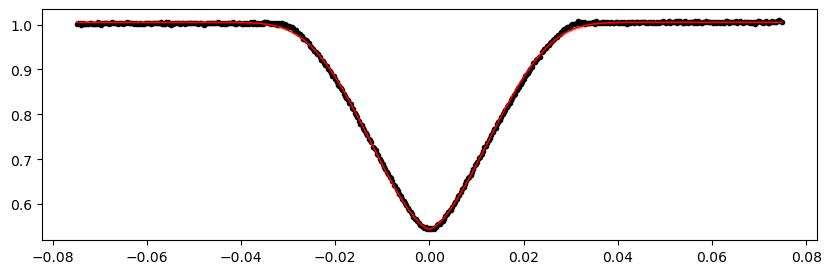

2199.346128 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:47<00:00, 212.28it/s]


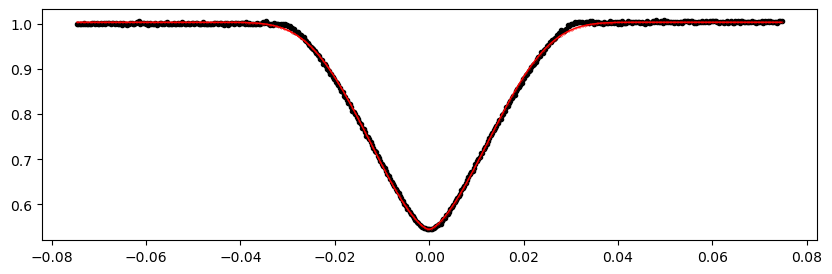

2204.035374 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 214.79it/s]


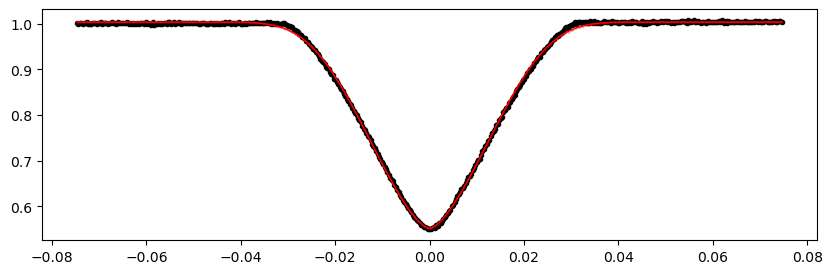

2208.72462 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 214.08it/s]


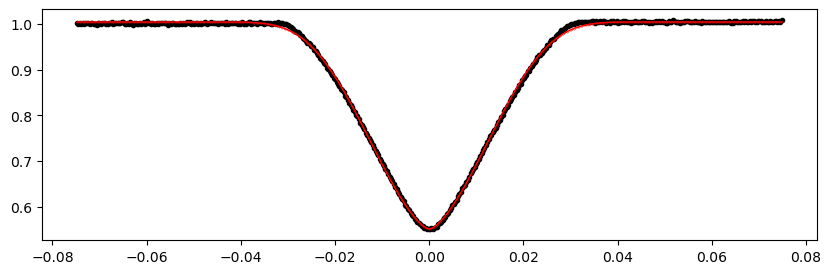

2213.413866 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 212.85it/s]


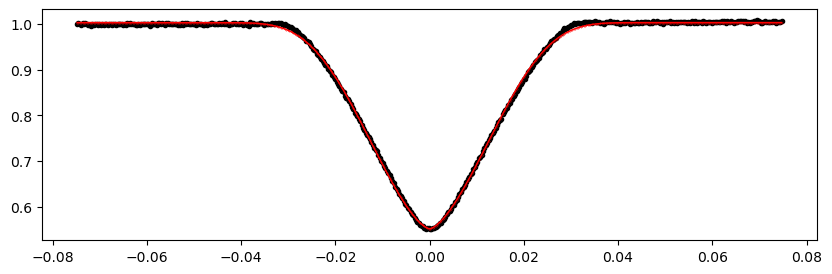

2218.103112 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 213.24it/s]


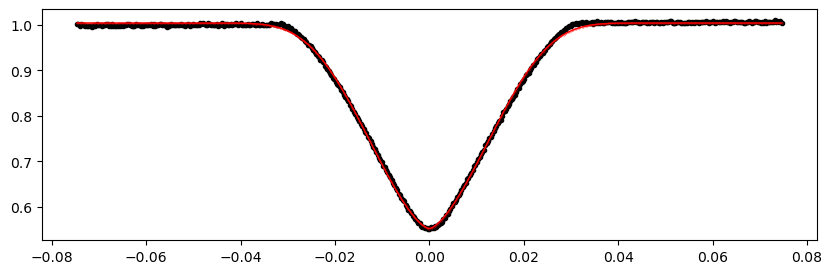

2222.7923579999997 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:47<00:00, 212.71it/s]


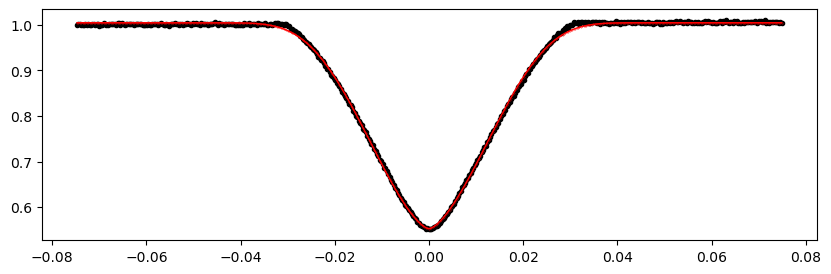

2227.481604 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:39<00:00, 253.22it/s]


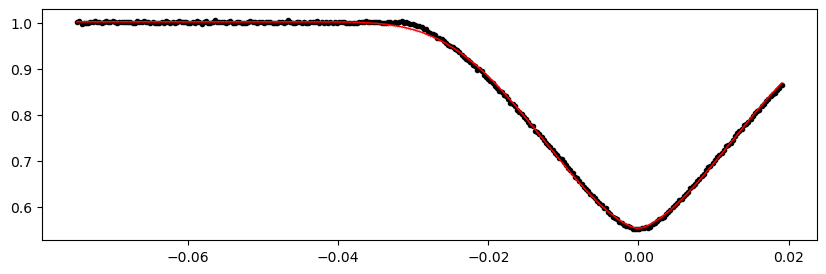

2232.17085 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 218.42it/s]


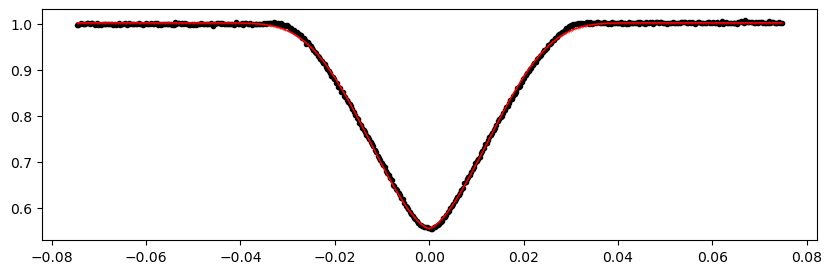

2236.860096 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 218.80it/s]


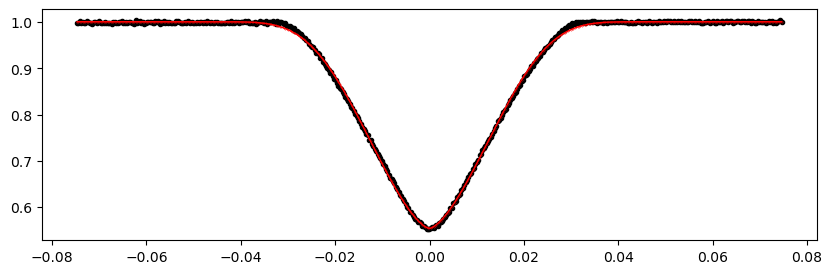

2246.238588 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 216.13it/s]


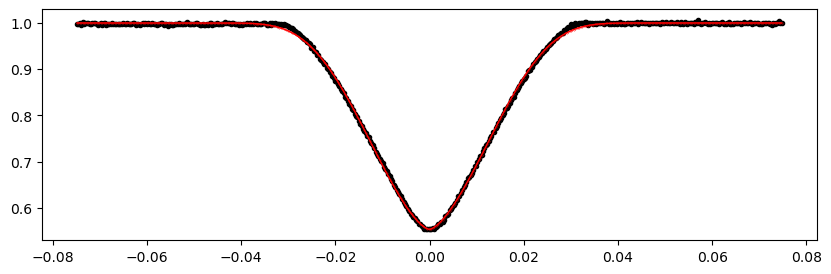

2250.927834 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 219.00it/s]


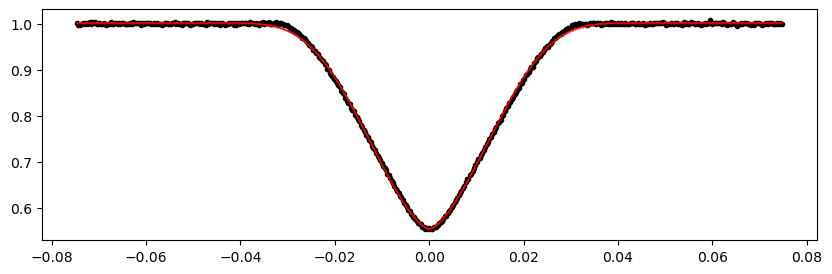

2255.61708 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:21<00:00, 473.28it/s]


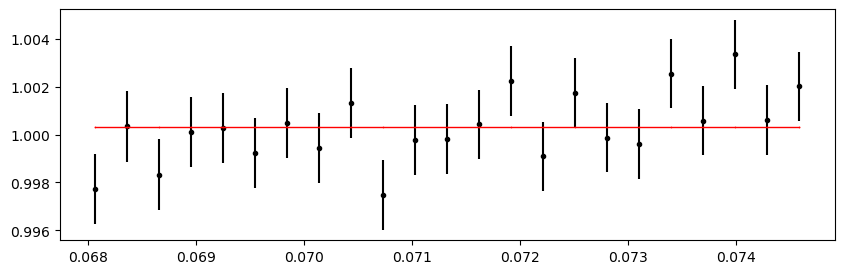

2260.306326 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 215.62it/s]


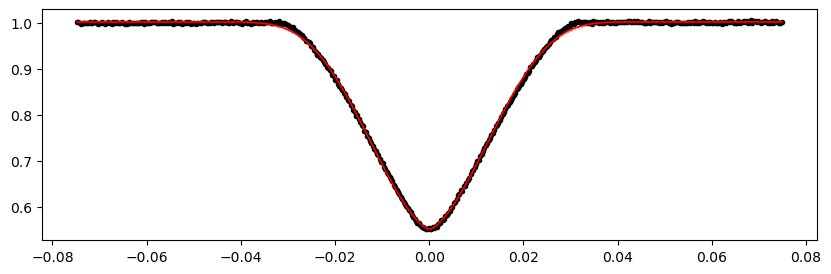

2264.995572 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 214.60it/s]


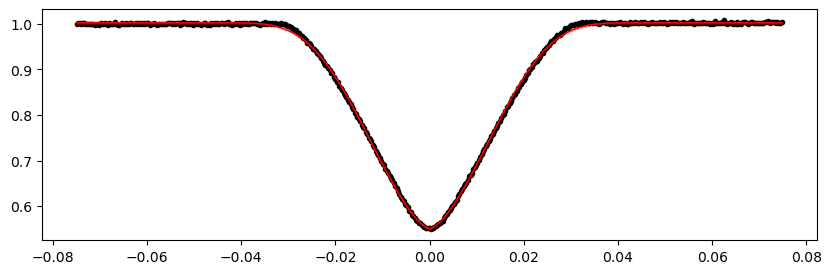

2274.3740639999996 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:43<00:00, 229.36it/s]


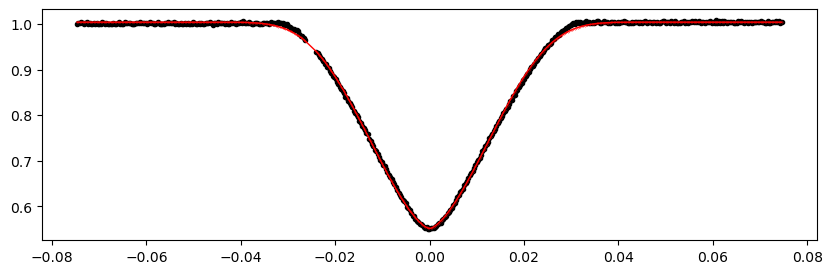

2279.06331 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 215.23it/s]


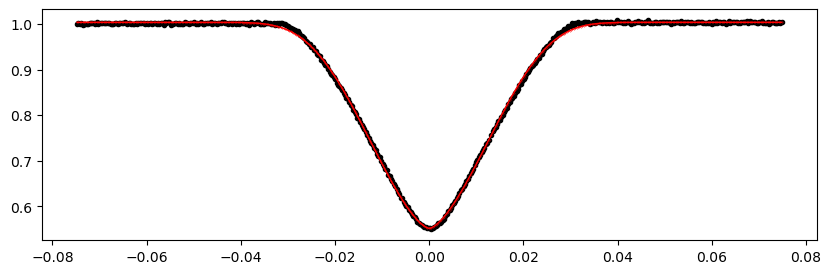

2283.752556 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 217.38it/s]


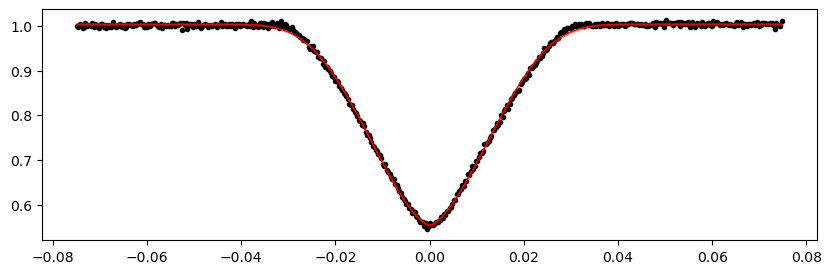

2288.441802 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 216.93it/s]


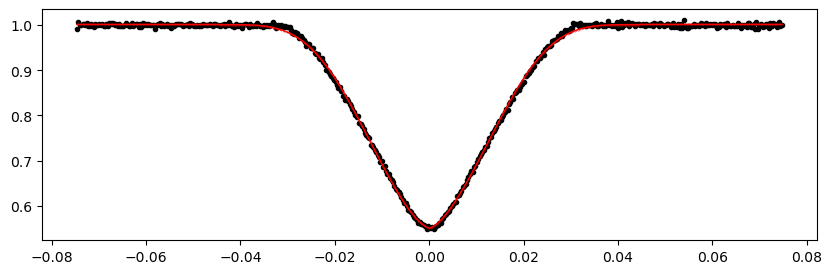

2293.1310479999997 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.61it/s]


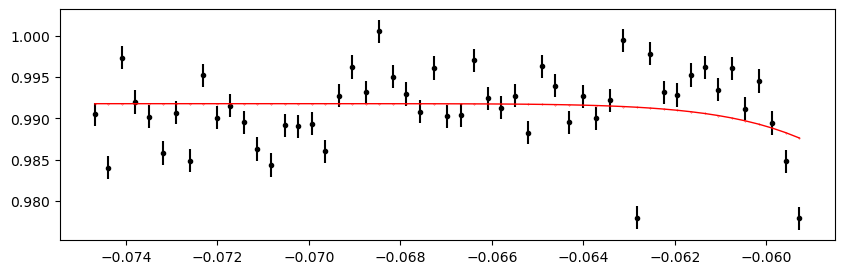

2297.820294 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 216.68it/s]


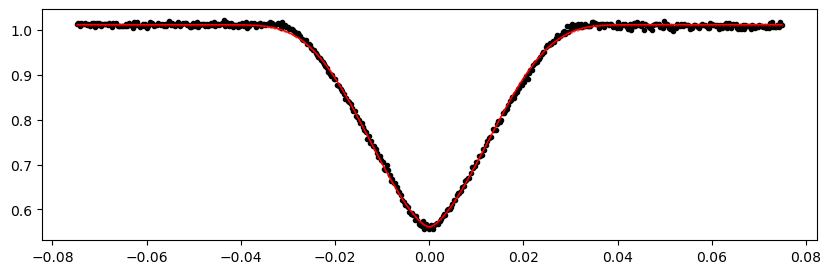

2302.50954 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 219.83it/s]


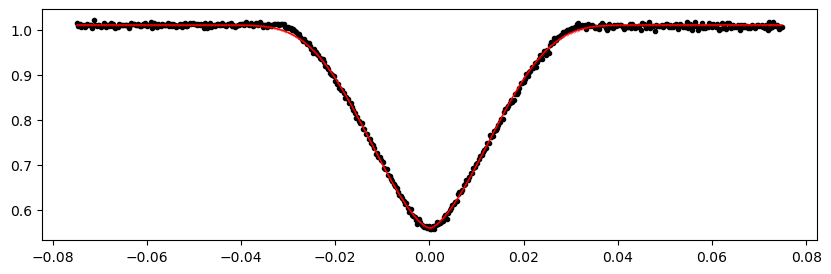

2311.888032 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 216.62it/s]


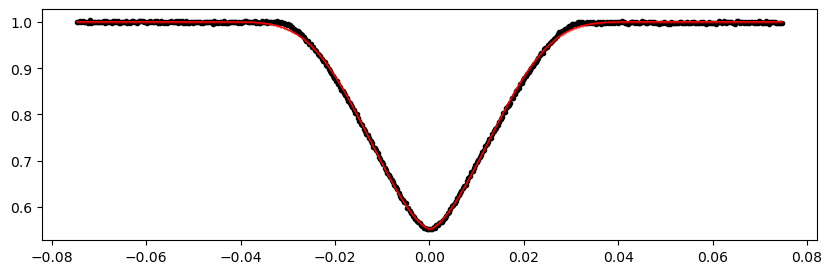

2316.5772779999998 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 217.22it/s]


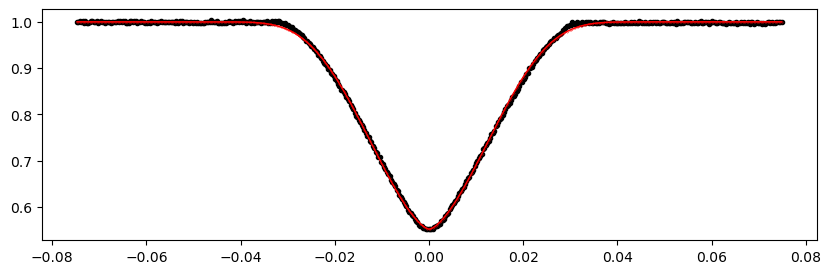

2325.95577 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:44<00:00, 223.24it/s]


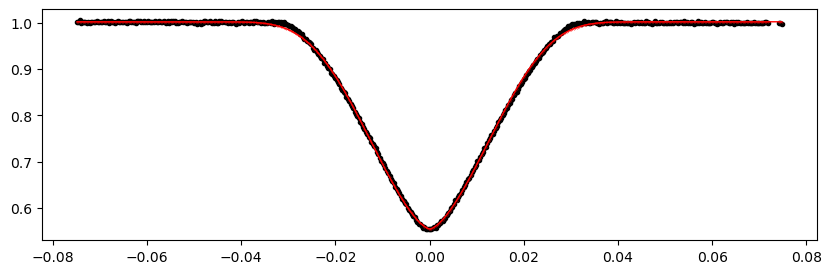

2330.645016 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 215.49it/s]


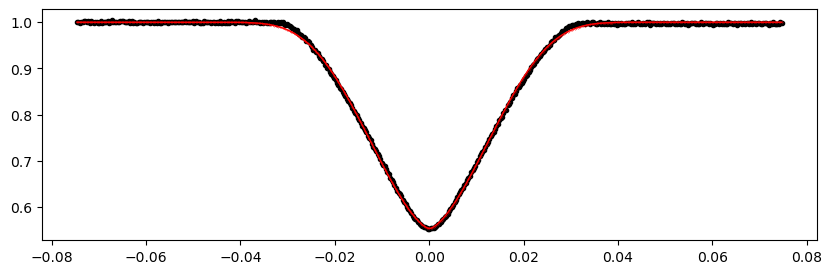

2335.334262 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:43<00:00, 232.36it/s]


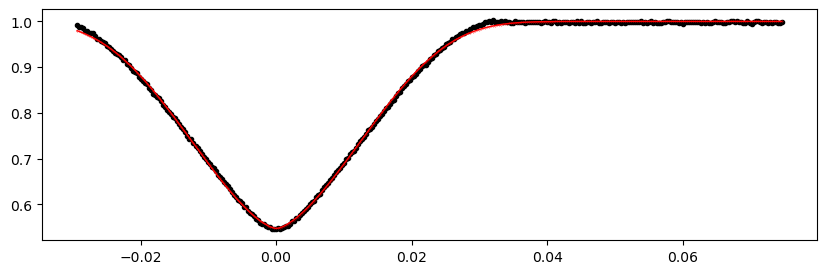

2340.0235079999998 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 222.18it/s]


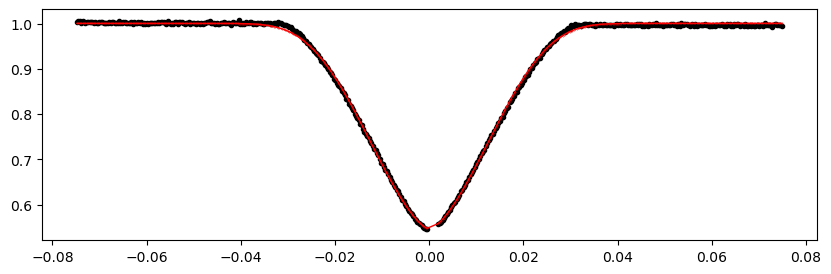

2344.712754 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 212.79it/s]


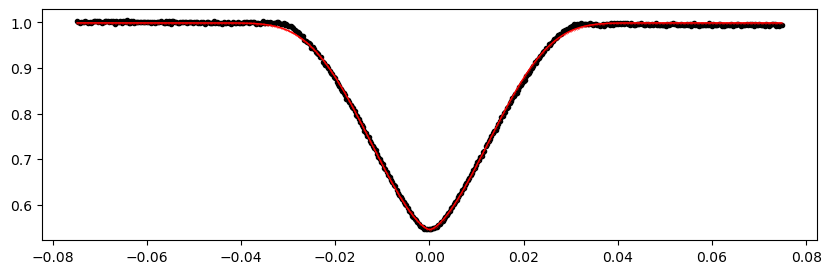

2349.402 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 216.87it/s]


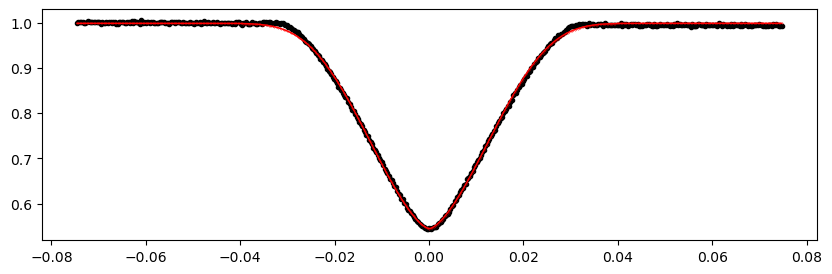

2354.091246 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:44<00:00, 226.41it/s]


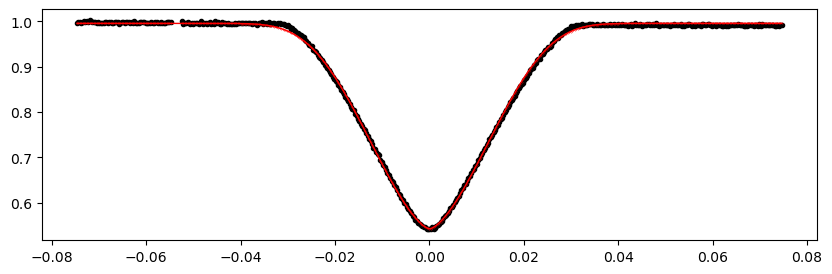

2358.780492 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 216.34it/s]


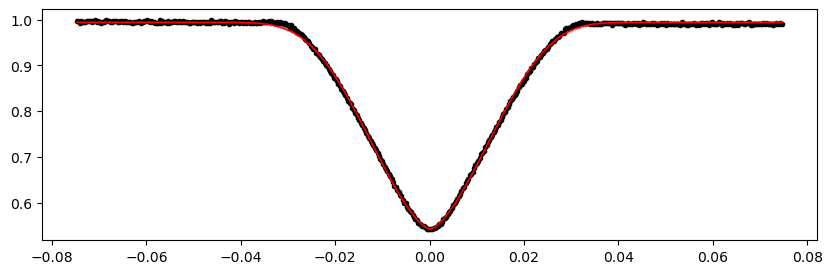

2363.469738 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 219.08it/s]


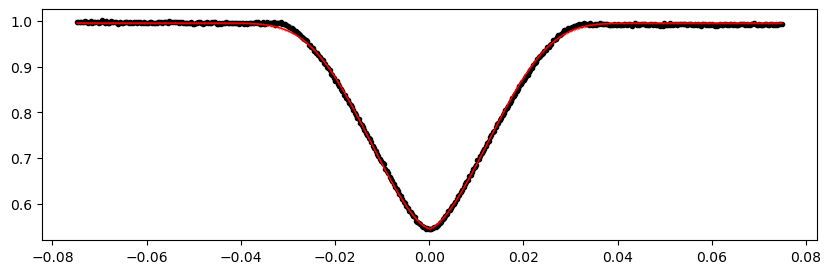

2368.1589839999997 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:44<00:00, 223.33it/s]


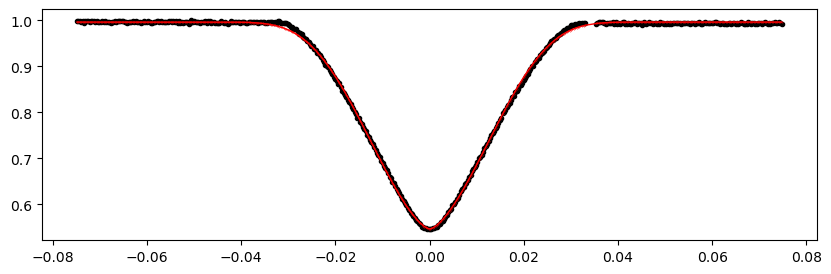

2372.84823 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 214.82it/s]


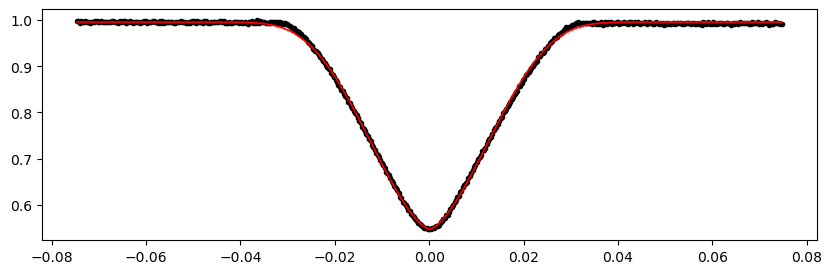

2377.537476 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 215.55it/s]


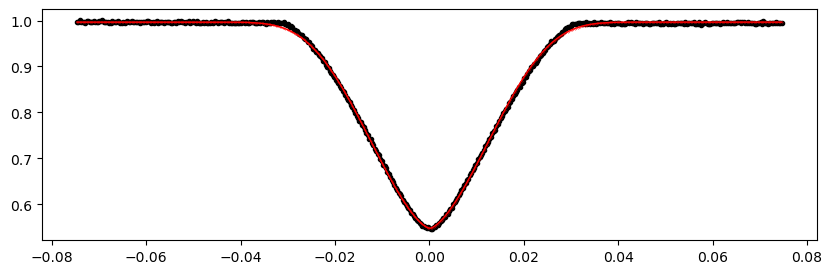

2382.226722 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:44<00:00, 224.84it/s]


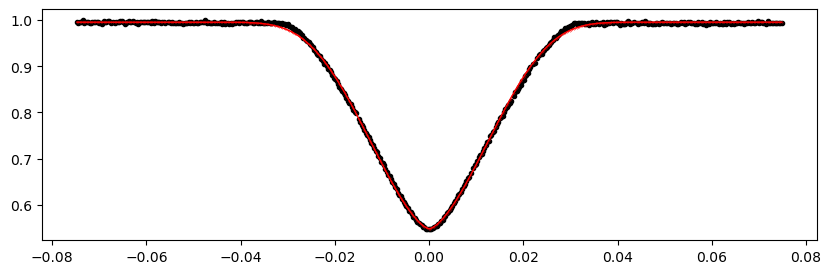

2386.915968 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 217.75it/s]


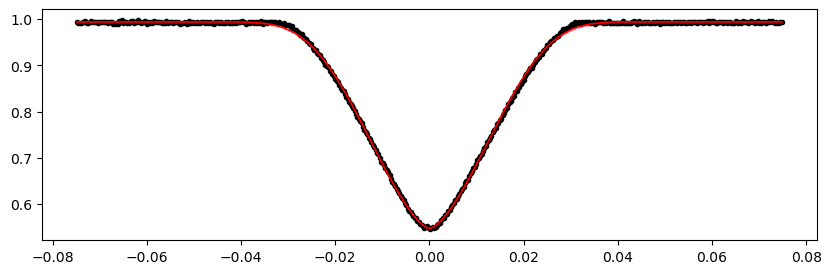

2968.382472 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 216.35it/s]


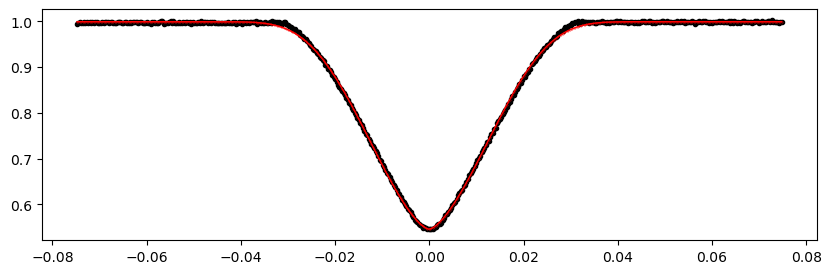

2973.071718 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 215.69it/s]


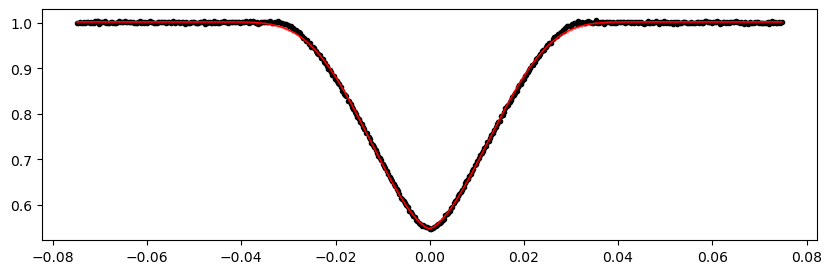

2977.760964 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 216.12it/s]


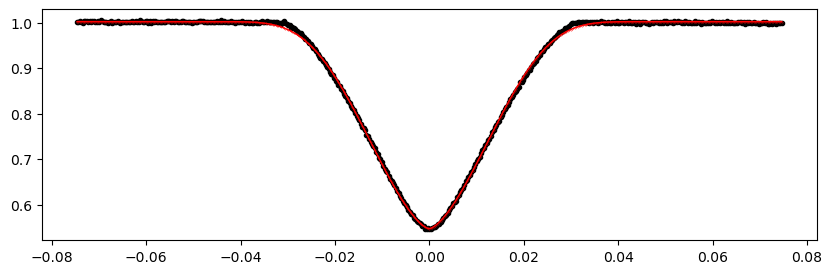

2982.45021 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:41<00:00, 239.98it/s]


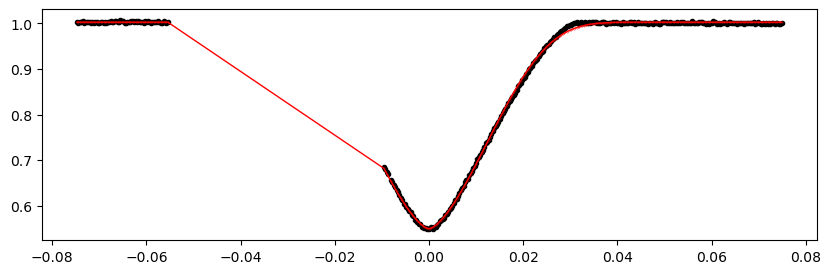

2987.139456 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 217.40it/s]


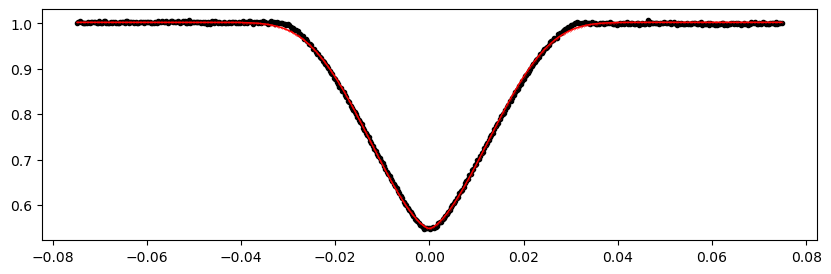

2991.828702 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 215.91it/s]


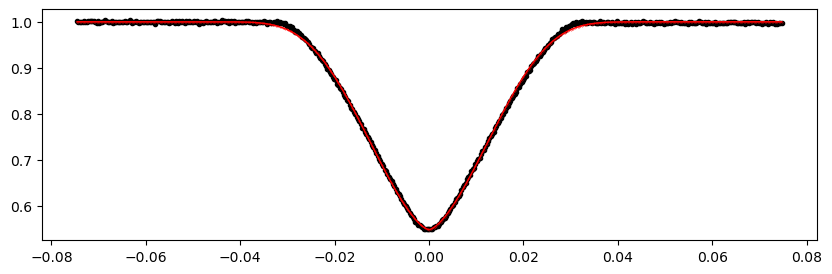

2996.5179479999997 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 215.77it/s]


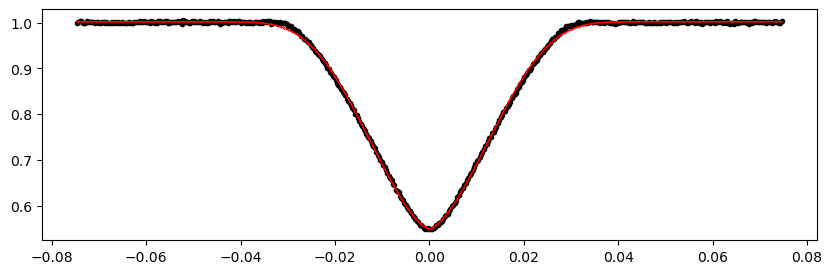

3001.2071939999996 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 454.31it/s]


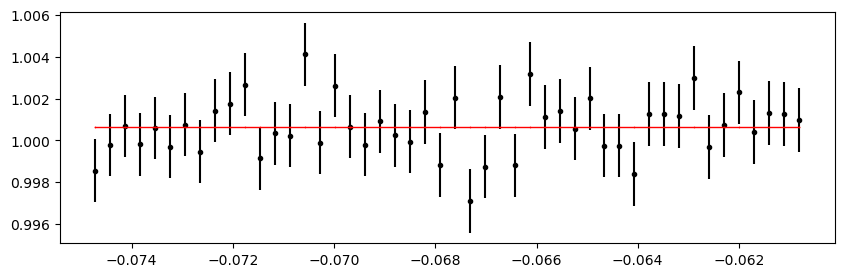

3005.8964399999995 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 215.18it/s]


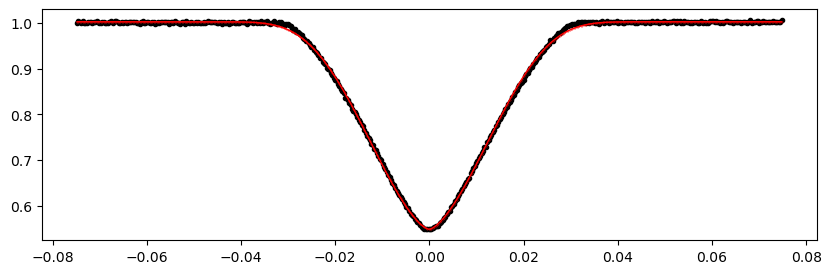

3010.585686 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 214.99it/s]


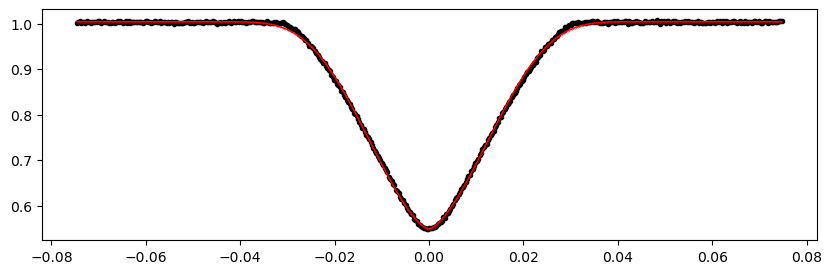

3019.964178 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 217.15it/s]


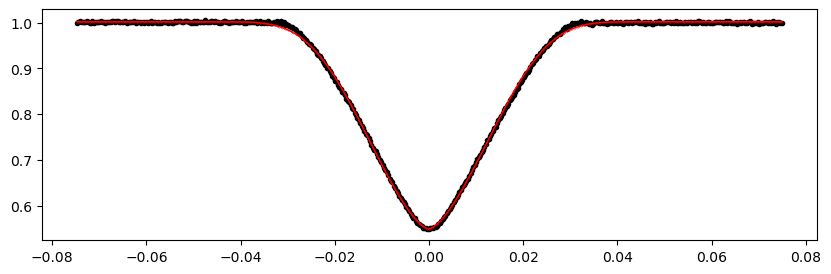

3024.653424 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 214.14it/s]


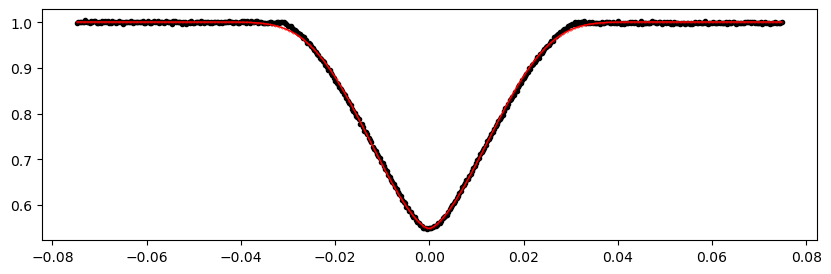

3029.34267 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:41<00:00, 243.00it/s]


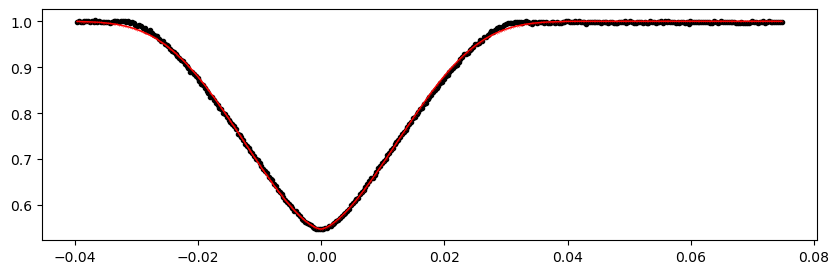

3034.031916 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:38<00:00, 258.53it/s]


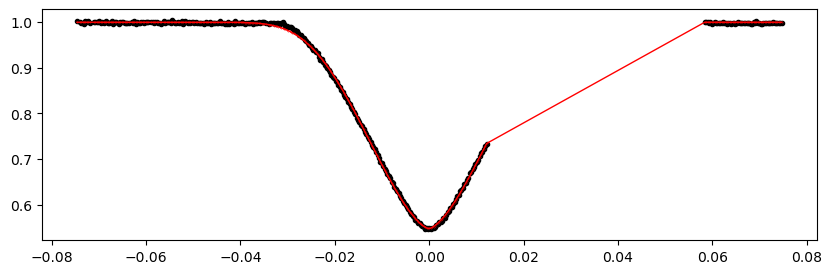

3038.721162 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 215.98it/s]


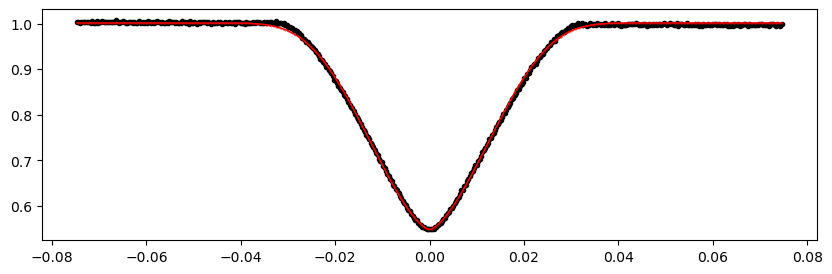

3043.4104079999997 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 218.35it/s]


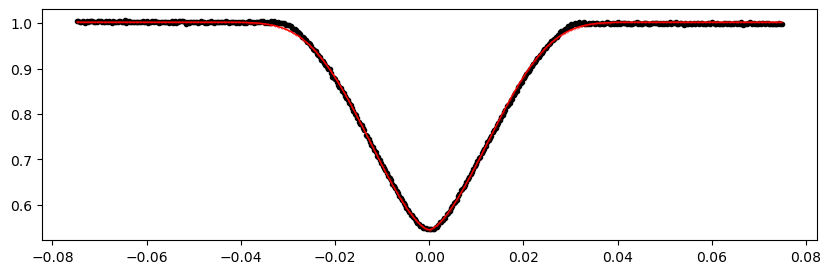

3048.0996539999996 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:42<00:00, 237.02it/s]


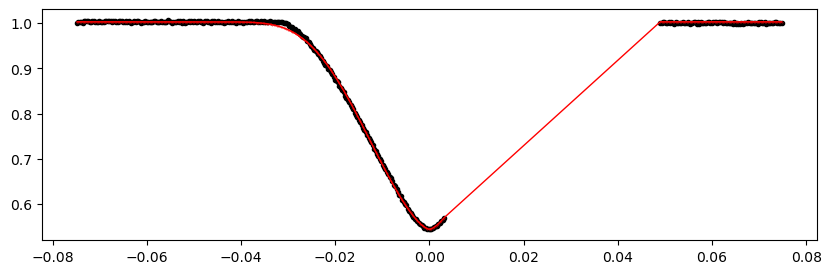

3052.7888999999996 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 215.98it/s]


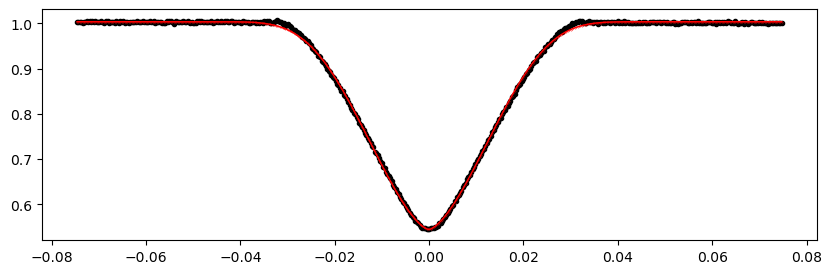

3057.478146 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 217.68it/s]


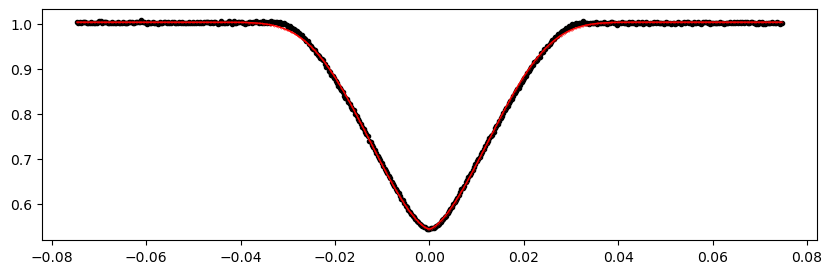

3062.167392 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:39<00:00, 252.53it/s]


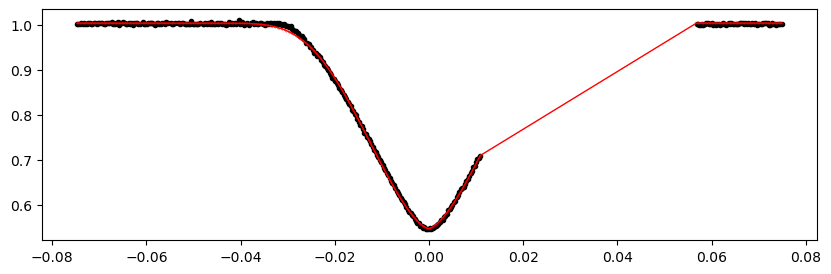

3066.856638 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 215.61it/s]


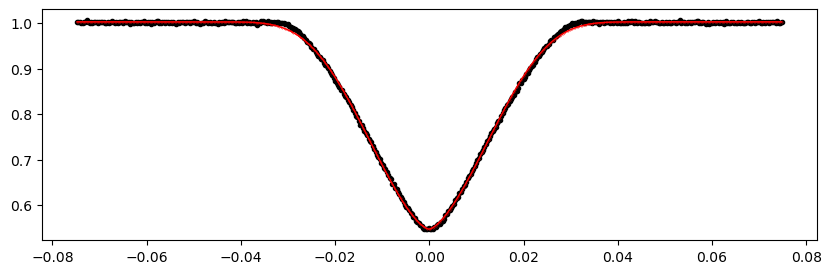

3071.545884 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 214.37it/s]


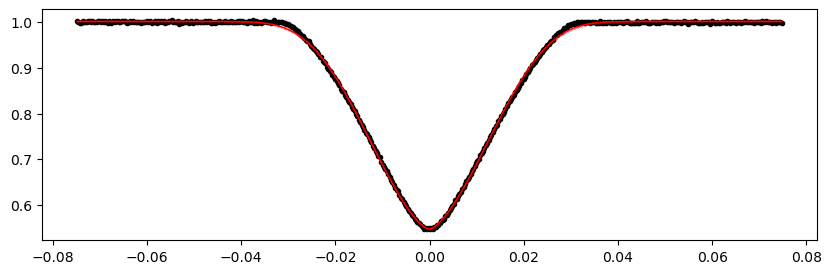

3076.23513 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:39<00:00, 256.07it/s]


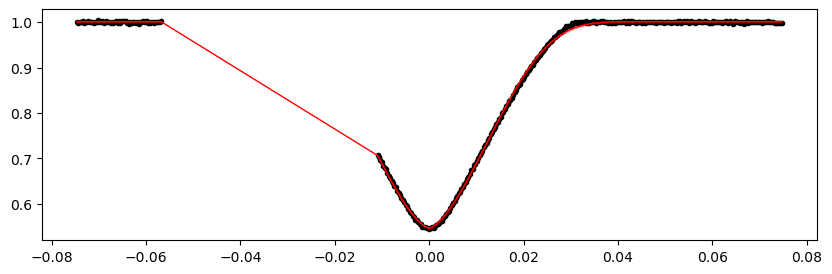

3080.924376 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:37<00:00, 267.22it/s]


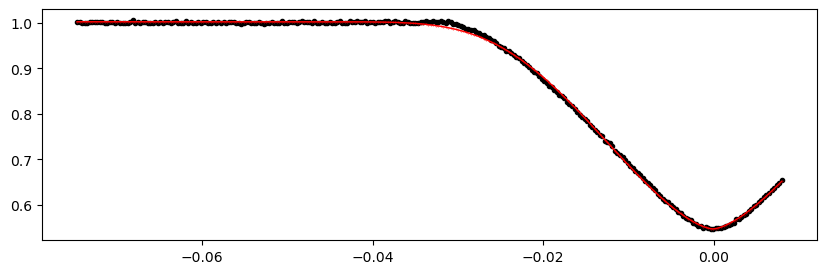

3085.613622 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:47<00:00, 212.15it/s]


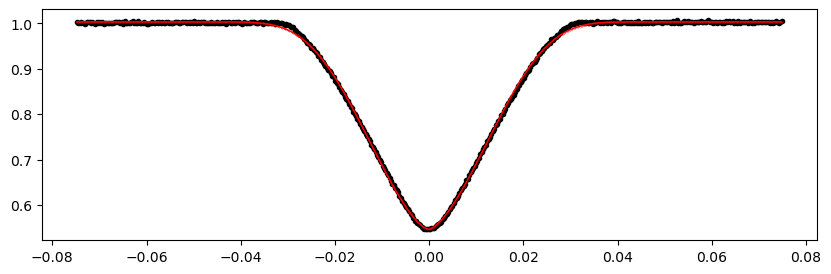

3090.3028679999998 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:38<00:00, 257.74it/s]


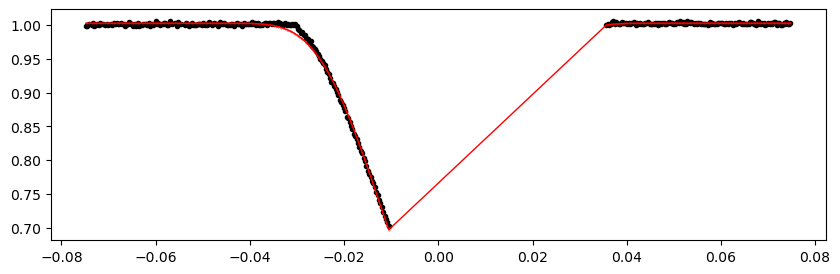

3094.9921139999997 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 421.87it/s]


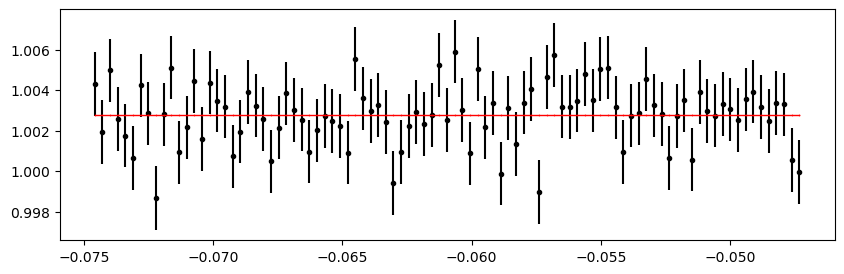

3099.6813599999996 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 217.39it/s]


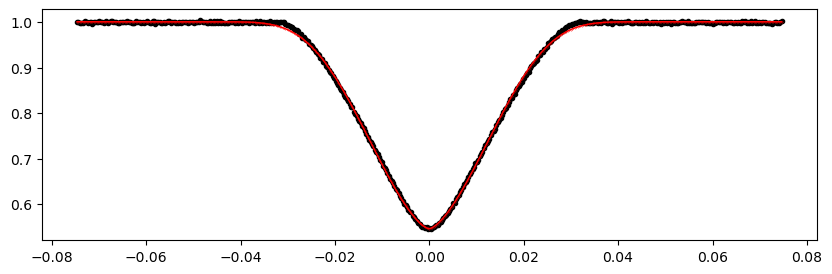

3104.370606 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:49<00:00, 201.71it/s]


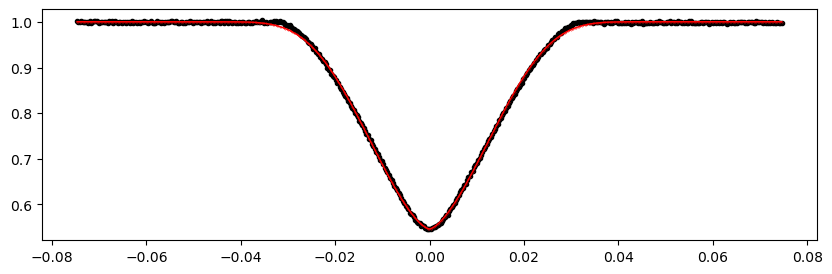

3113.749098 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 214.90it/s]


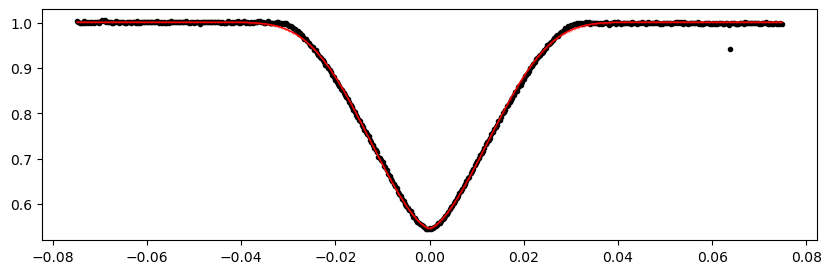

3118.438344 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 222.10it/s]


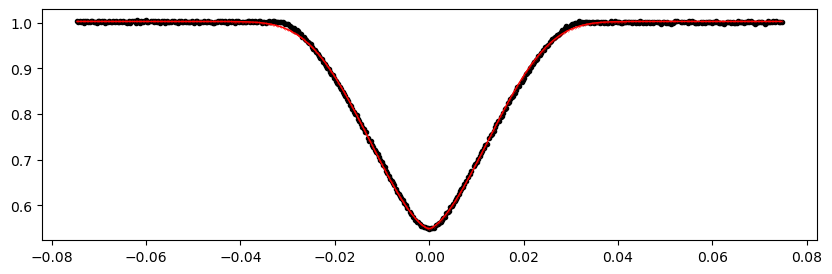

3127.816836 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 213.52it/s]


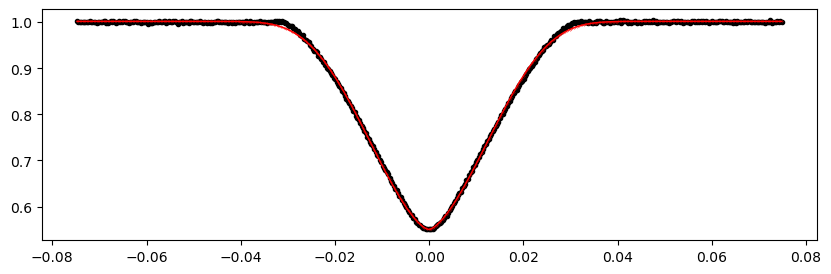

3132.506082 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 216.57it/s]


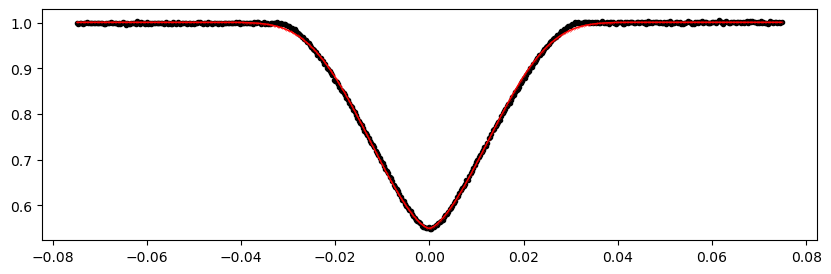

3141.8845739999997 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:47<00:00, 212.75it/s]


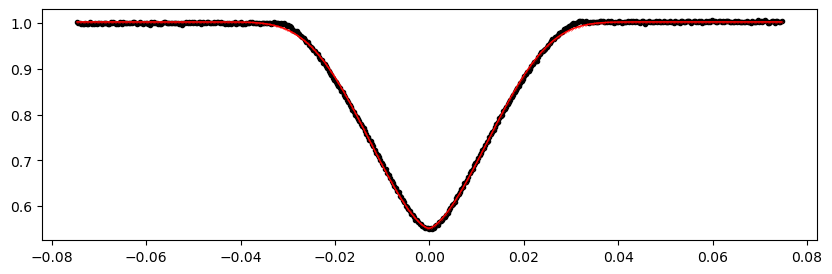

3146.5738199999996 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:42<00:00, 233.38it/s]


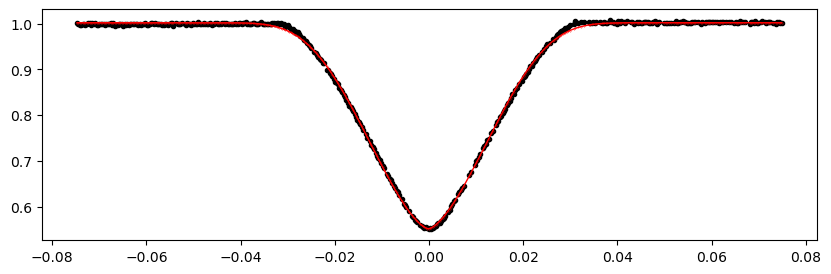

3151.2630659999995 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 415.19it/s]


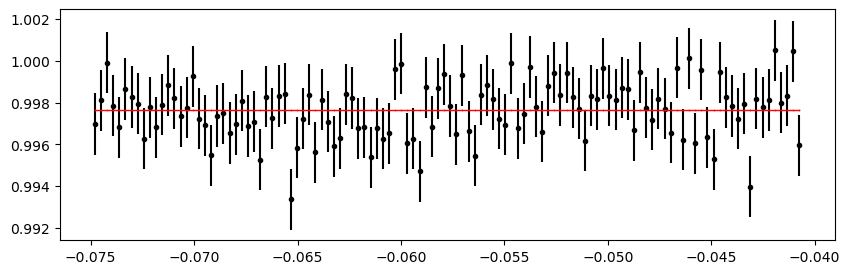

3155.952312 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:47<00:00, 212.02it/s]


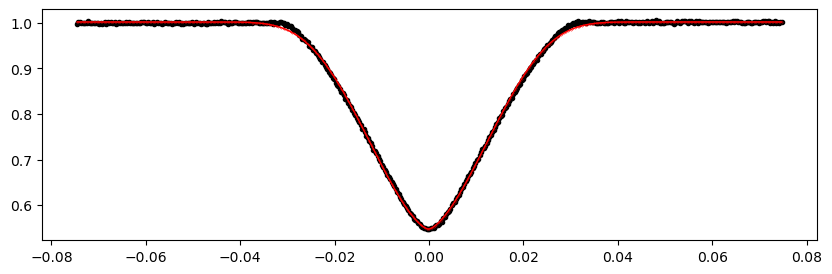

3160.641558 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:47<00:00, 211.73it/s]


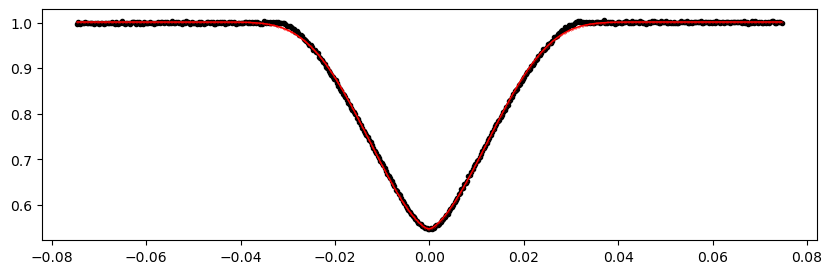

3165.330804 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:42<00:00, 237.03it/s]


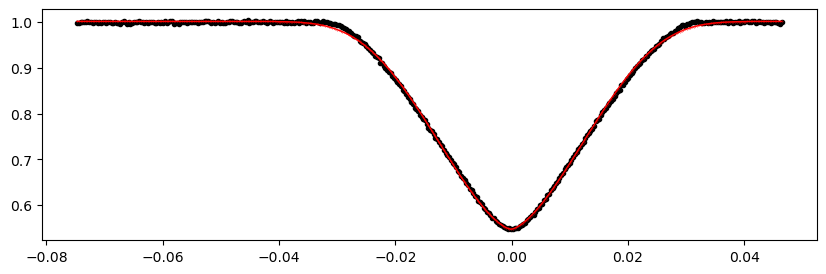

3170.02005 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 213.08it/s]


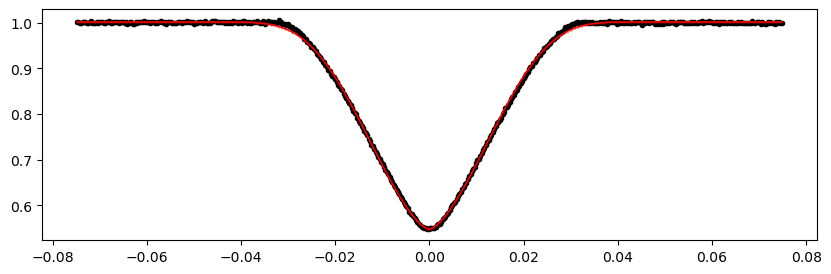

3174.709296 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:47<00:00, 211.13it/s]


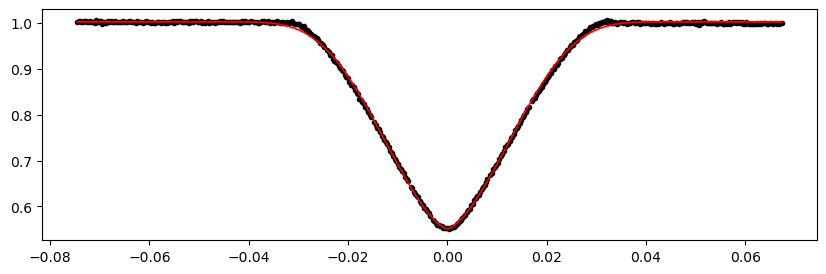

3179.398542 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:41<00:00, 243.38it/s]


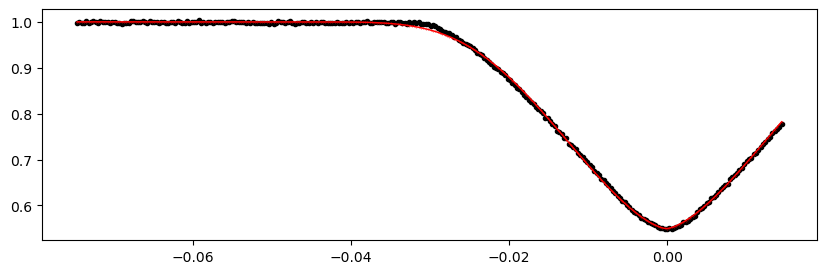

3184.087788 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 220.85it/s]


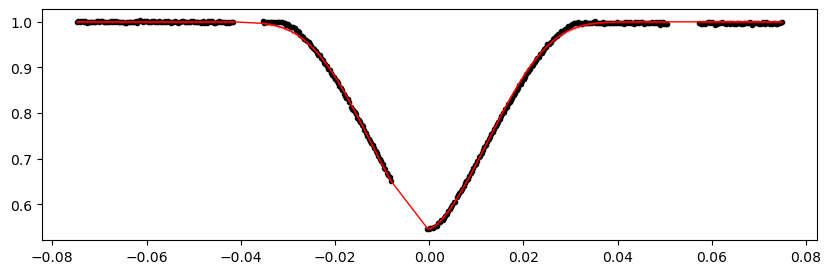

3188.7770339999997 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 215.82it/s]


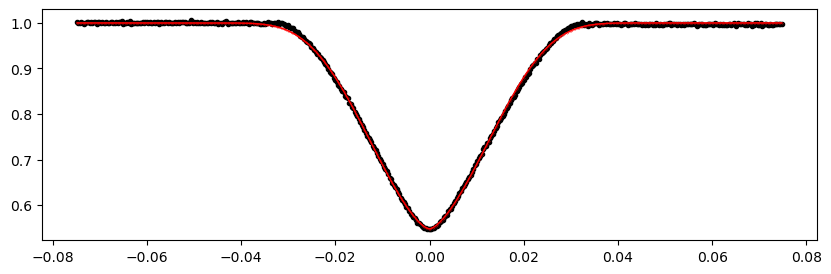

3198.1555259999996 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [3:28:18<00:00,  1.25s/it]


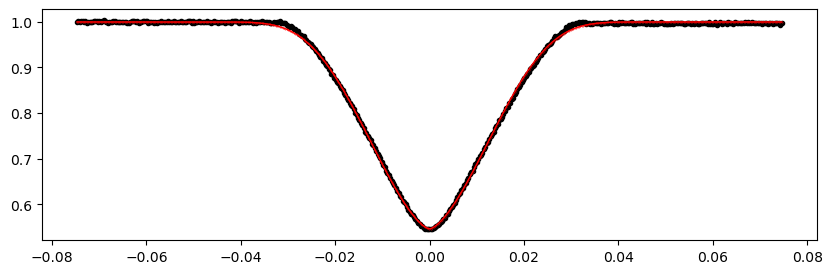

In [17]:
%matplotlib inline

print("Fitting individual primary eclipses...")
etv_functions.fit_each_eclipse(data_primary, n_transits, t0_primary, period, mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, outfile_path)
!$NOTIFY_CMD "Individual primary eclipses fit done"

# ---

%matplotlib inline

print("Fitting individual secondary eclipses...")
etv_functions.fit_each_eclipse(data_secondary, n_transits, t0_secondary, period, mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s, outfile_path_s)
!$NOTIFY_CMD "Individual secondary eclipses fit done"

Fitting individual secondary eclipses...
Creating new manifest file
1411.5528 1.0013589390322668 -0.452358403656157 -0.37500037502926503


  0%|                                                                    | 0/10000 [00:00<?, ?it/s]C:\pkg\_winNonPortables\miniforge3\envs\my_lk_plus\lib\site-packages\emcee\moves\red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1322.81it/s]


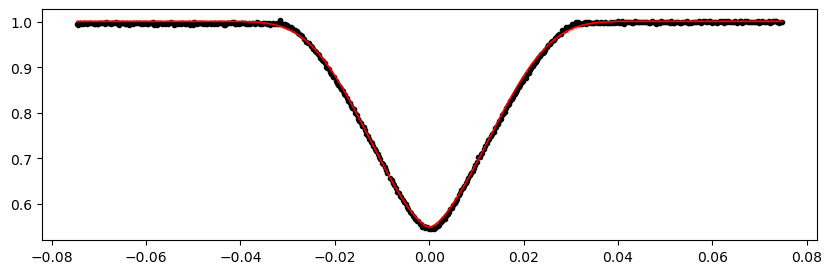

1416.2420459999998 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1335.70it/s]


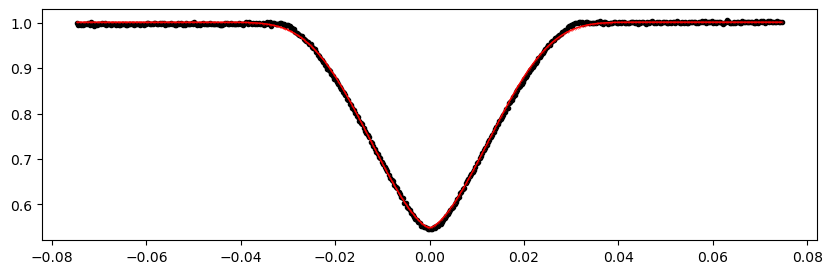

1420.931292 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1340.51it/s]


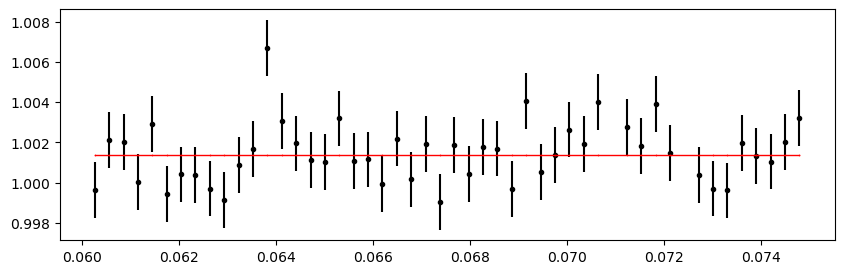

1425.620538 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.33it/s]


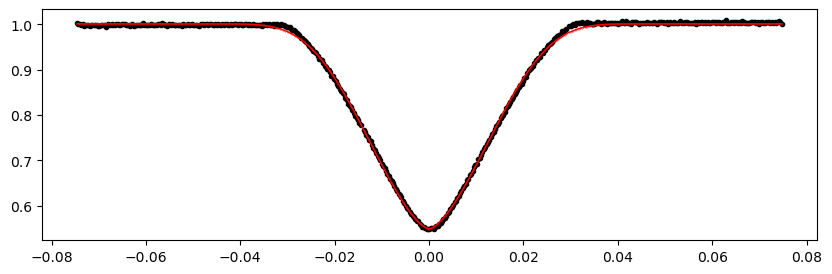

1430.309784 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1340.88it/s]


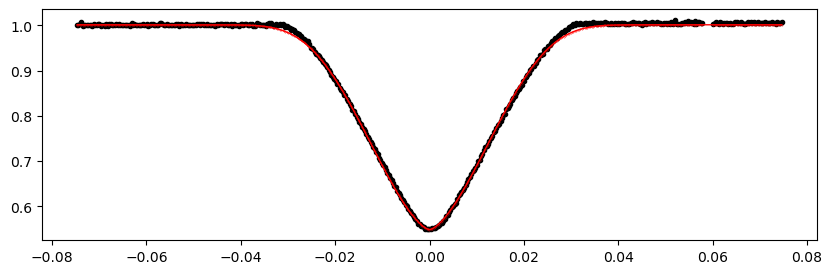

1434.99903 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1347.87it/s]


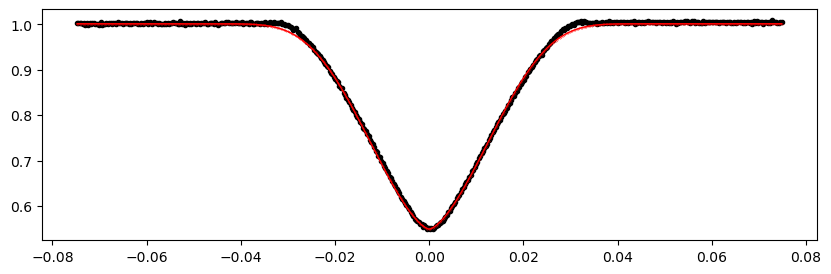

1439.6882759999999 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1341.38it/s]


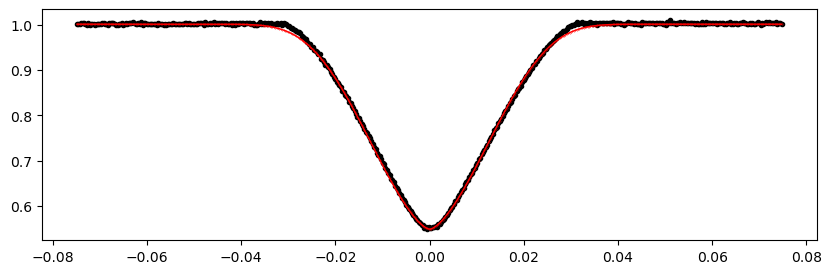

1444.377522 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1343.17it/s]


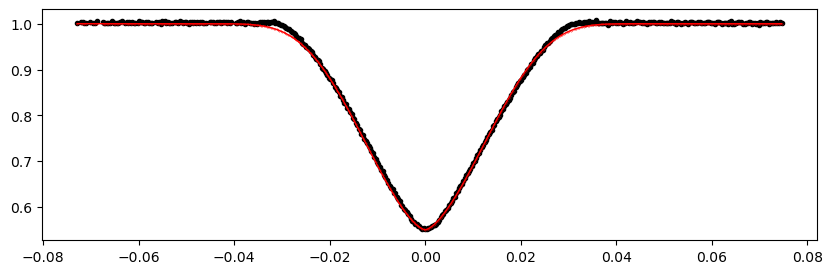

1449.066768 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1337.76it/s]


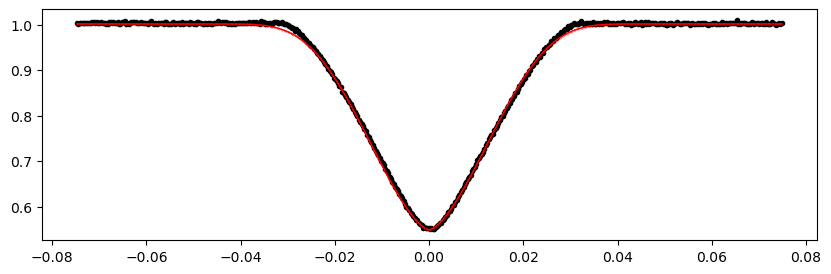

1453.7560139999998 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1340.48it/s]


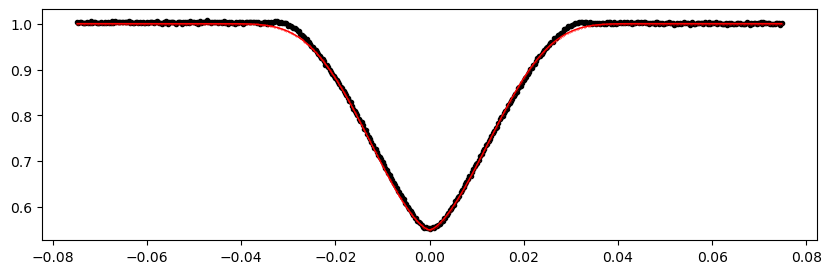

1458.44526 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1341.40it/s]


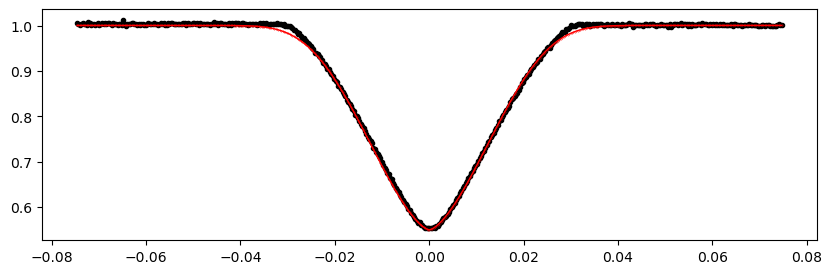

1463.1345059999999 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.32it/s]


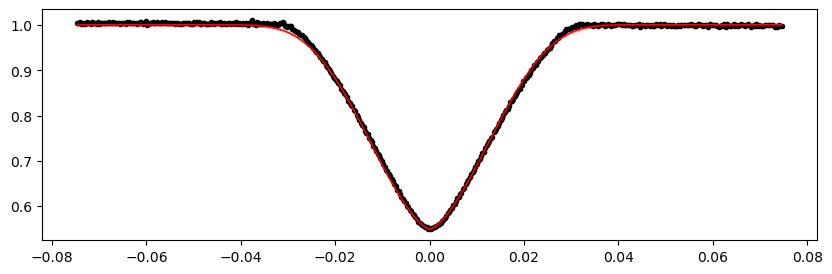

1472.512998 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1350.86it/s]


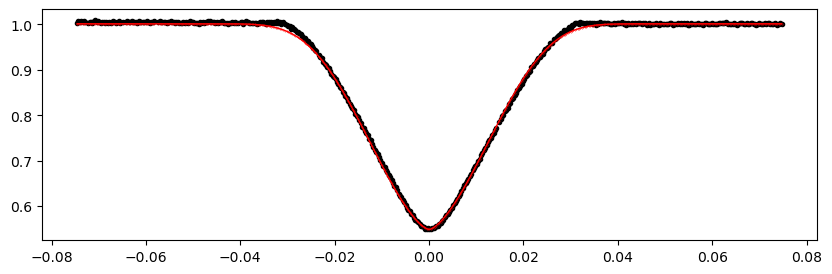

1477.2022439999998 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1347.74it/s]


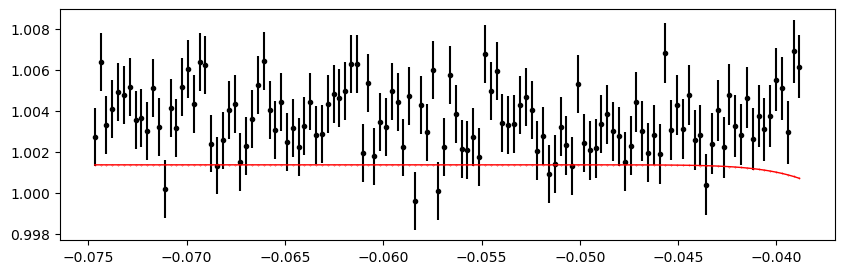

1481.89149 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1338.35it/s]


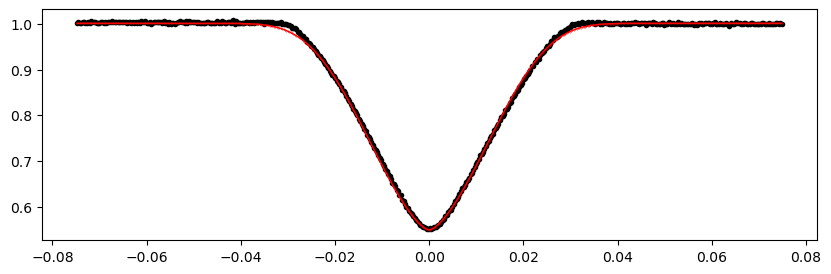

1486.580736 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1340.65it/s]


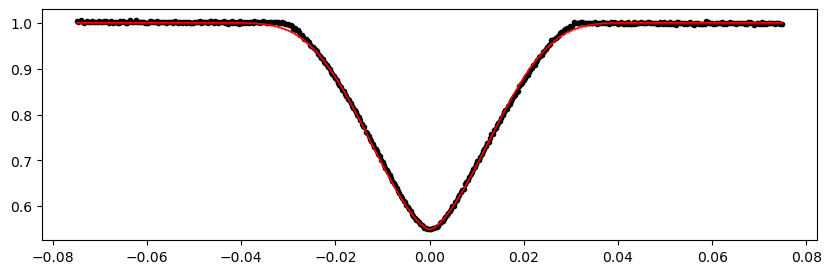

1495.959228 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1340.47it/s]


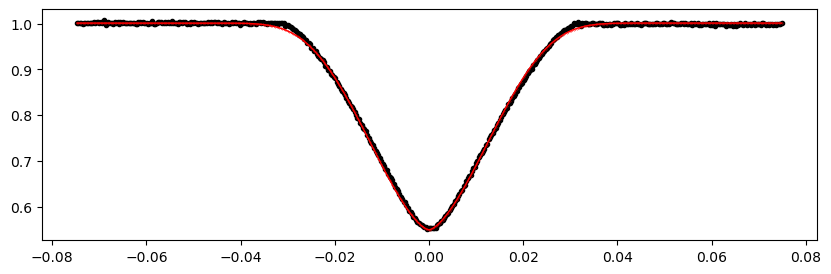

1500.6484739999999 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1335.94it/s]


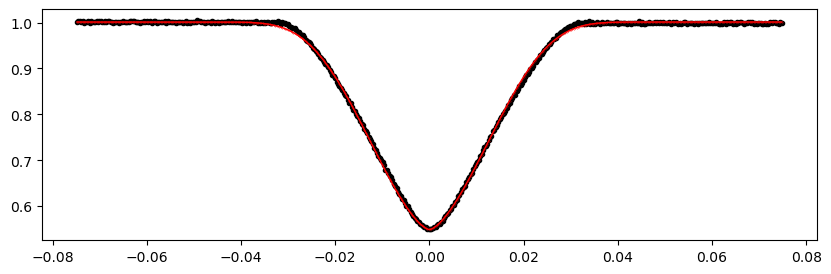

1505.33772 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1331.60it/s]


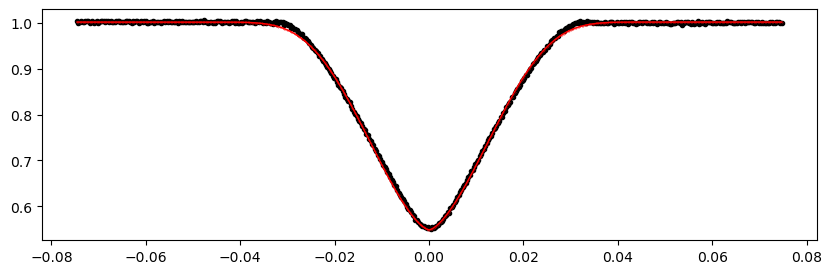

1510.026966 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1335.14it/s]


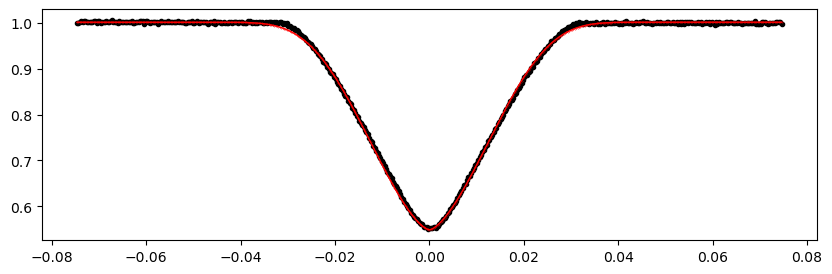

1514.7162119999998 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1320.99it/s]


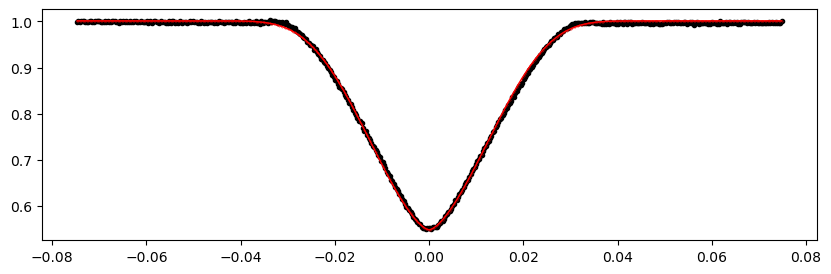

1519.405458 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1307.06it/s]


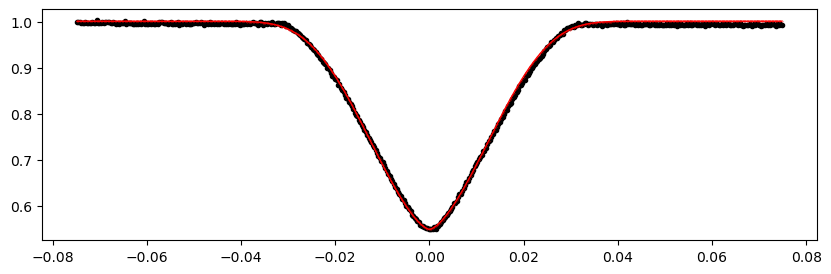

1524.0947039999999 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1341.43it/s]


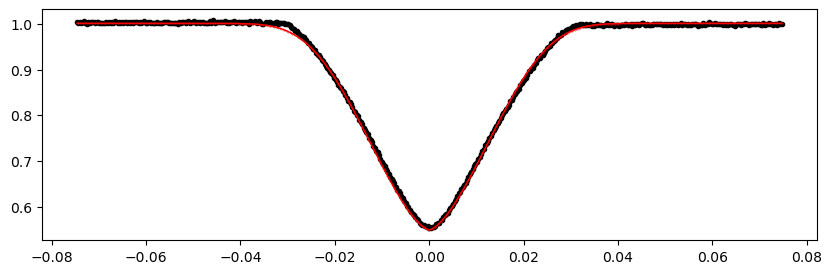

1528.78395 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1338.33it/s]


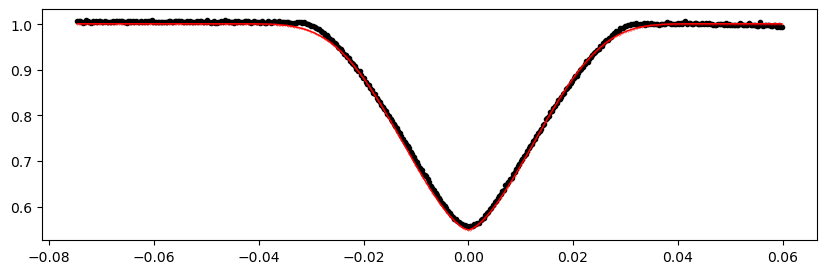

1538.1624419999998 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1341.22it/s]


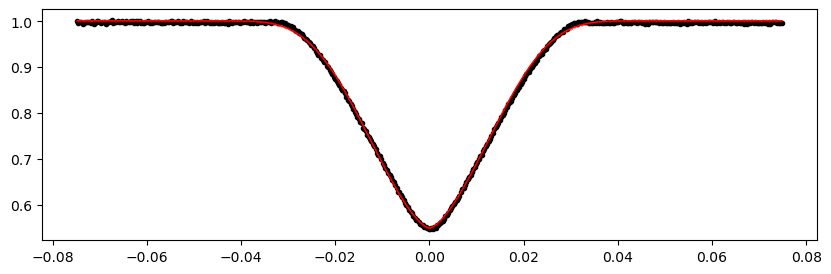

1547.5409339999999 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1343.86it/s]


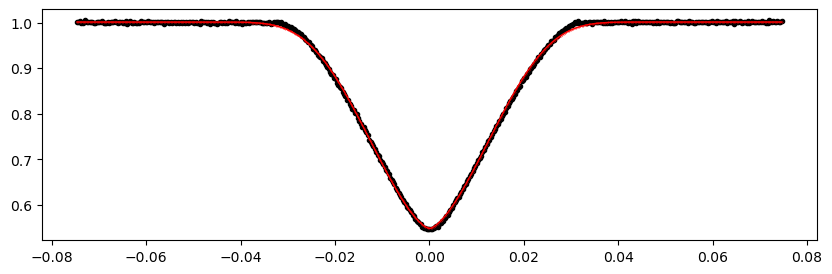

1552.23018 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1316.96it/s]


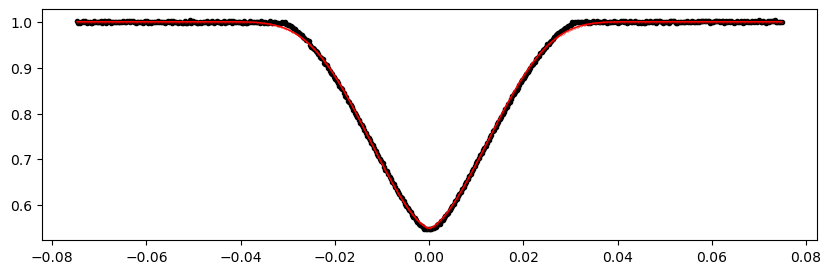

1561.6086719999998 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1330.01it/s]


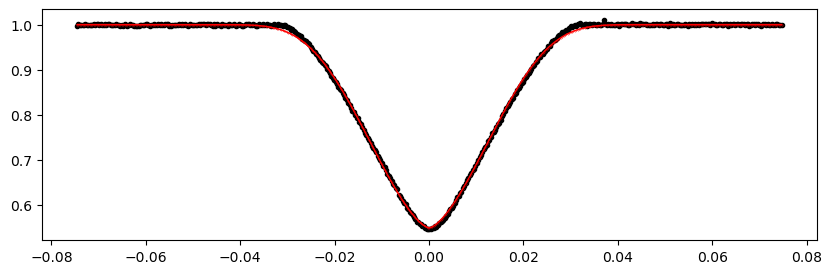

1566.297918 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1332.66it/s]


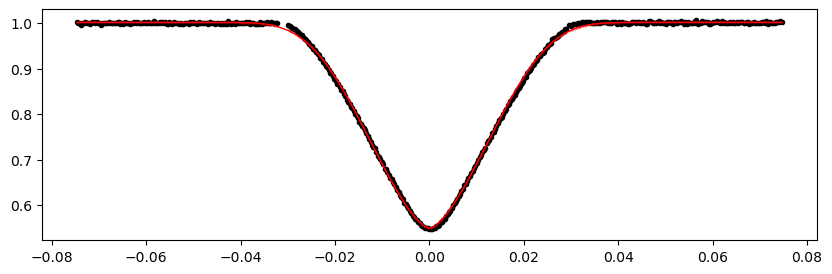

1575.67641 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1275.86it/s]


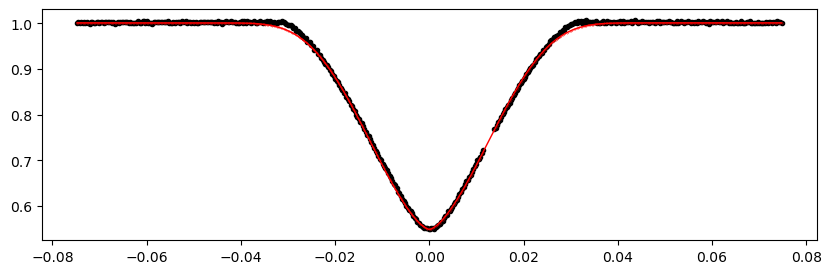

1580.365656 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1335.96it/s]


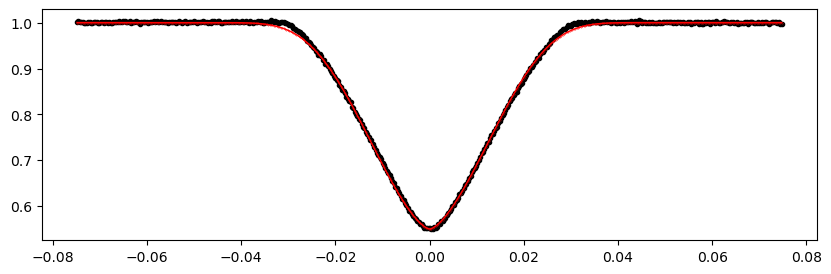

1589.744148 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.30it/s]


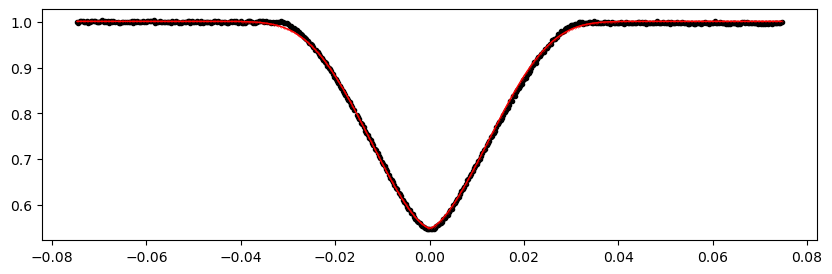

1594.433394 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1336.80it/s]


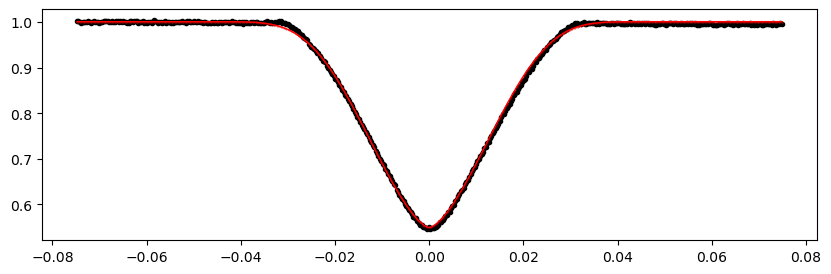

1631.9473619999999 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1336.76it/s]


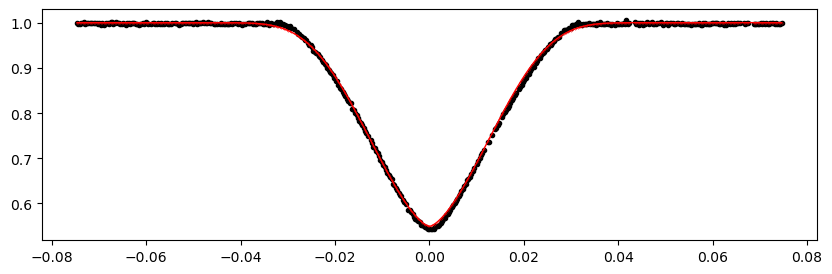

1636.6366079999998 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1331.22it/s]


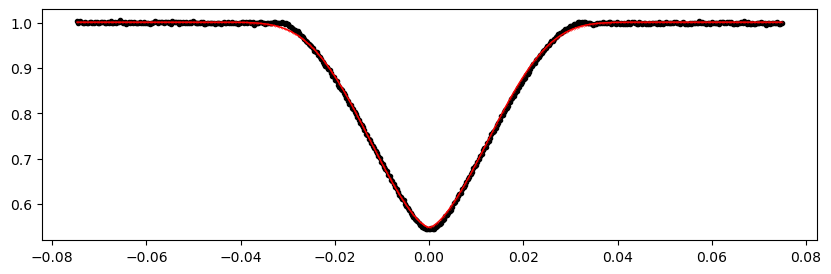

1646.0150999999998 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1341.30it/s]


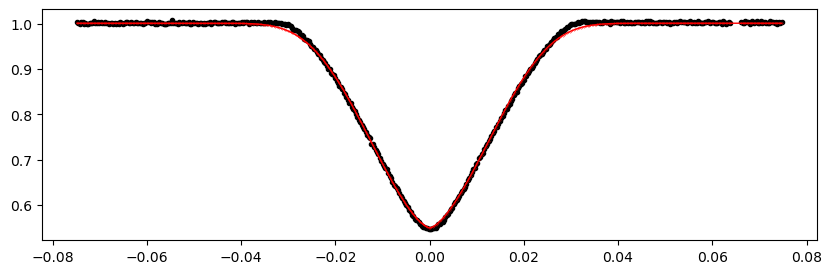

1650.704346 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1339.64it/s]


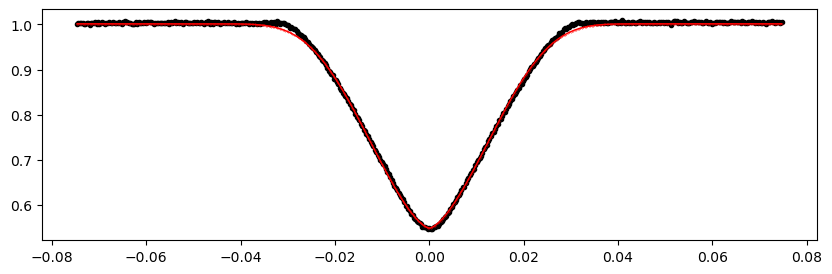

1655.393592 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1339.47it/s]


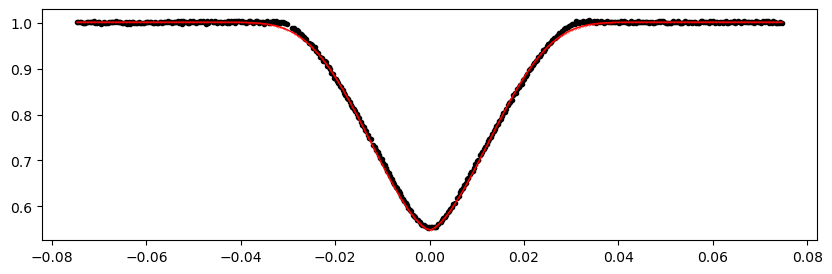

1660.0828379999998 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1341.53it/s]


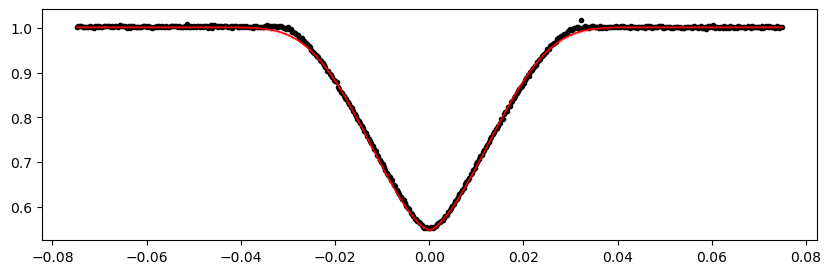

1664.772084 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.22it/s]


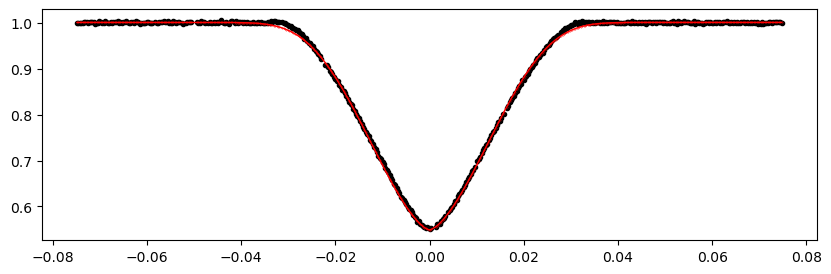

1669.4613299999999 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.44it/s]


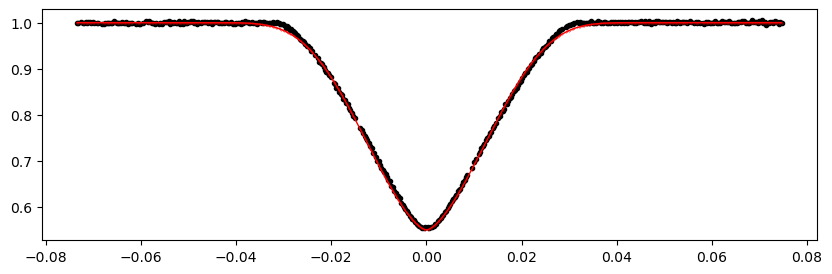

1674.150576 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1344.91it/s]


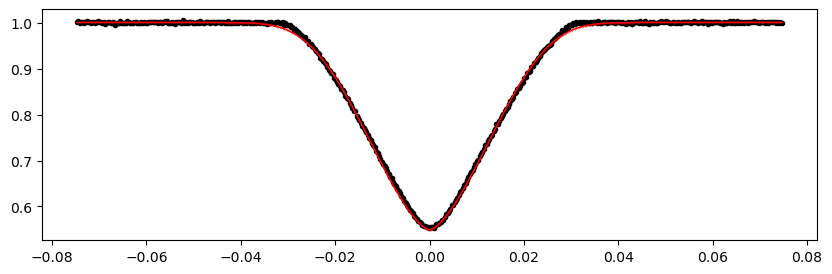

1678.839822 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1341.39it/s]


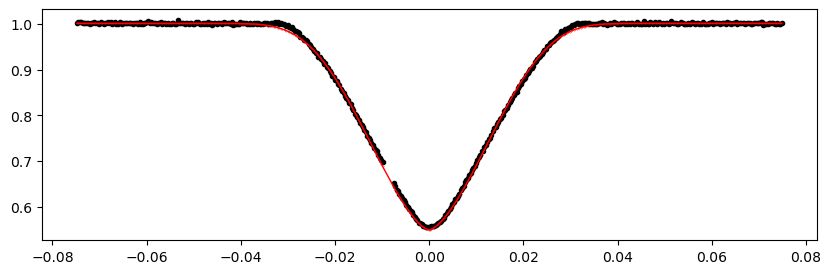

2039.911764 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1339.55it/s]


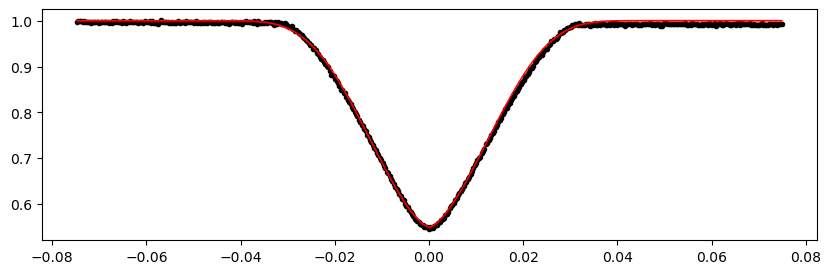

2044.6010099999999 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1335.21it/s]


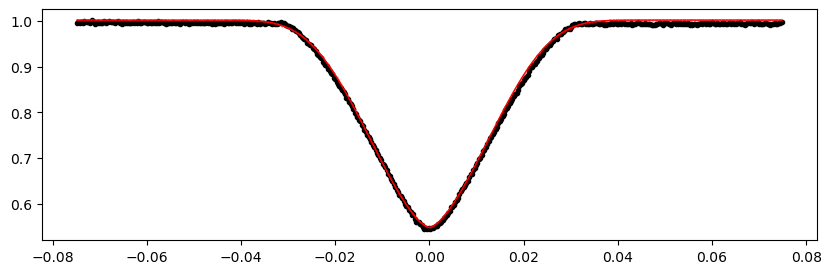

2049.2902559999998 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.81it/s]


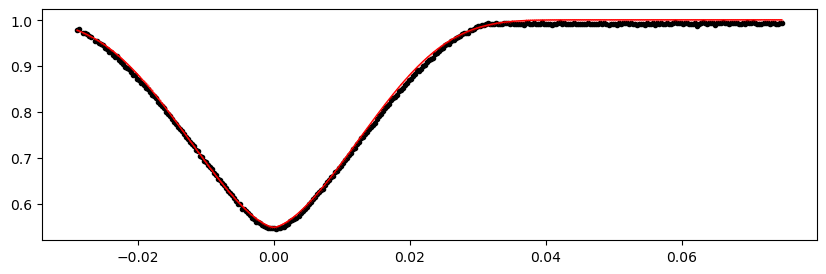

2053.979502 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.01it/s]


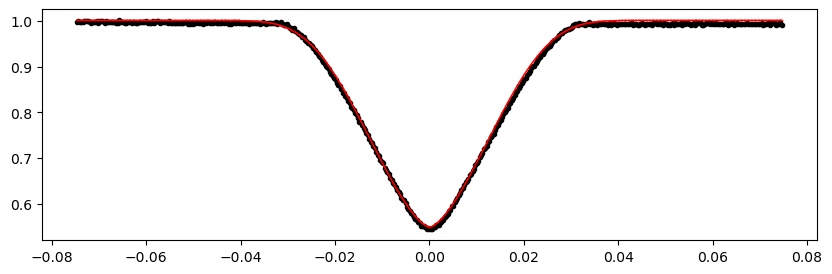

2058.668748 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1339.16it/s]


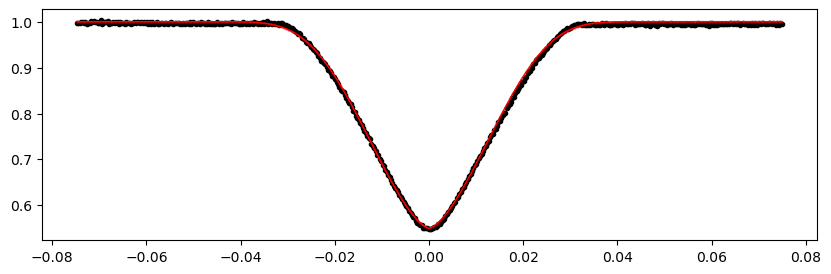

2091.49347 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1338.66it/s]


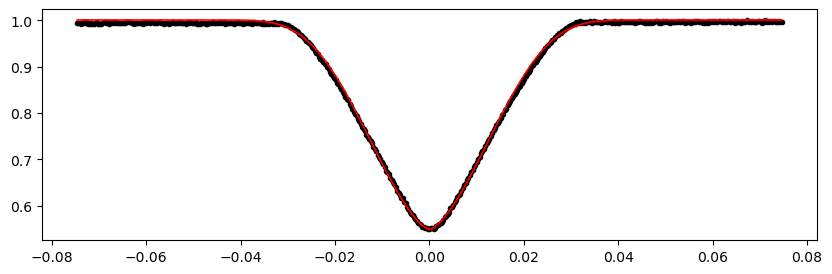

2096.182716 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1337.89it/s]


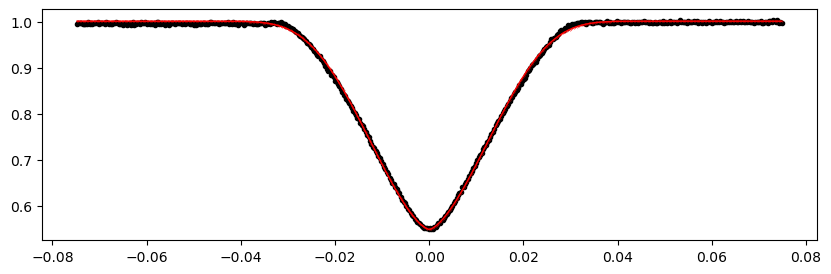

2105.561208 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1343.16it/s]


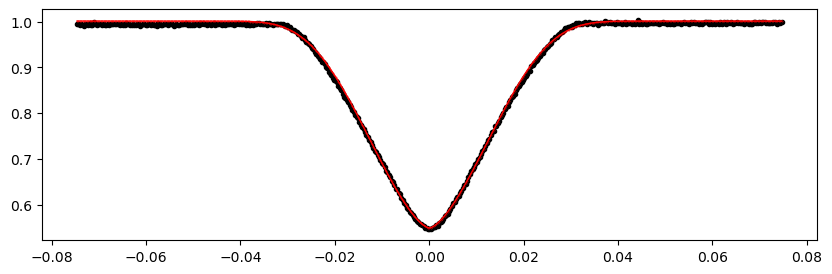

2110.250454 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1328.06it/s]


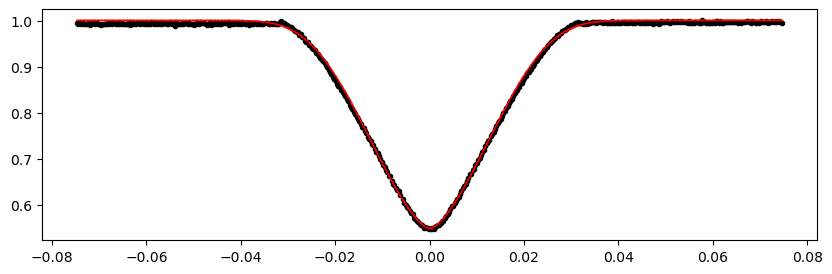

2119.628946 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.90it/s]


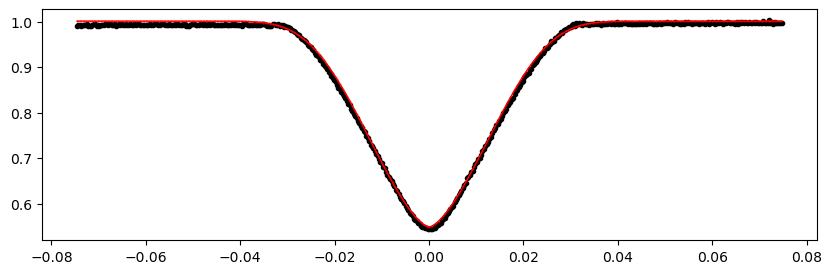

2124.3181919999997 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1330.80it/s]


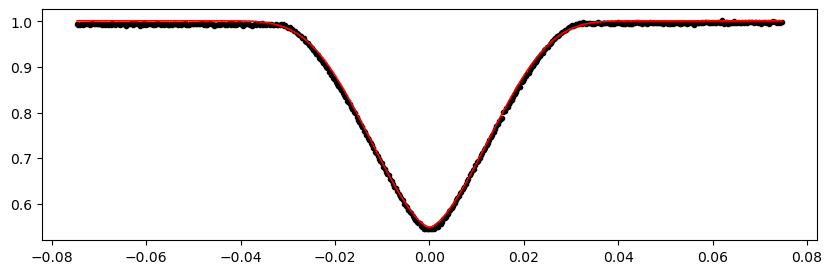

2133.696684 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1332.48it/s]


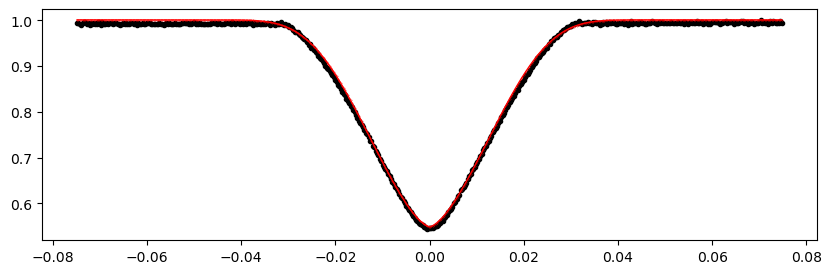

2138.38593 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1344.97it/s]


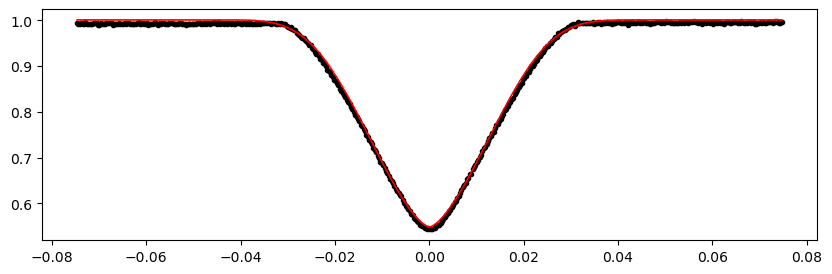

2147.7644219999997 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1338.34it/s]


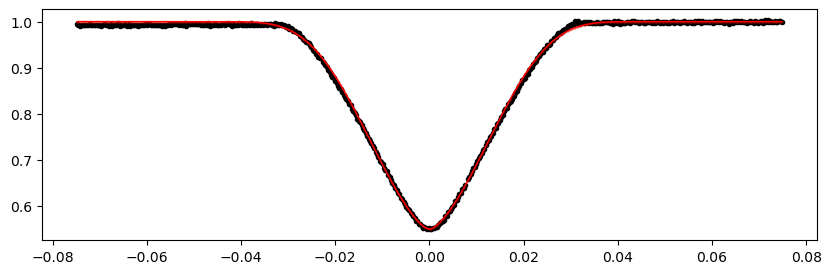

2152.453668 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1343.91it/s]


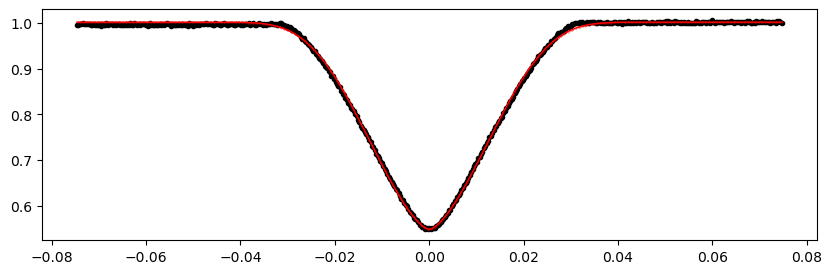

2161.83216 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1346.58it/s]


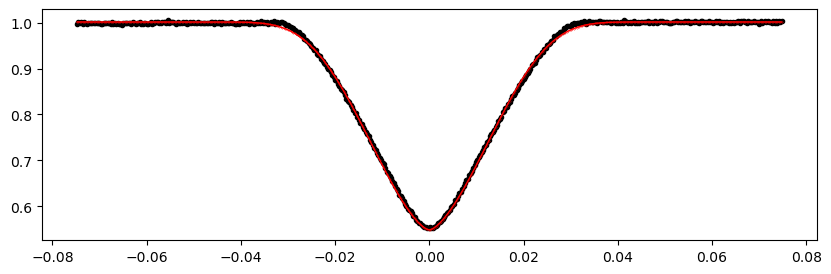

2166.521406 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1334.66it/s]


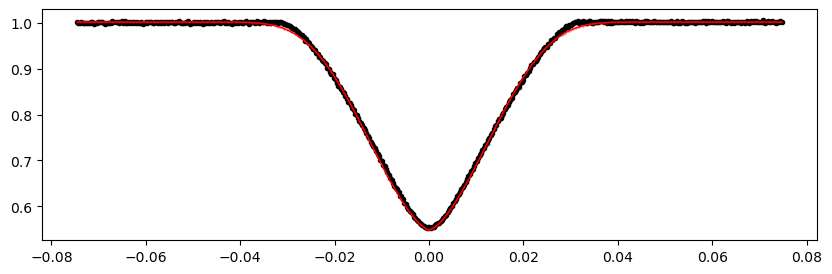

2175.8998979999997 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1338.73it/s]


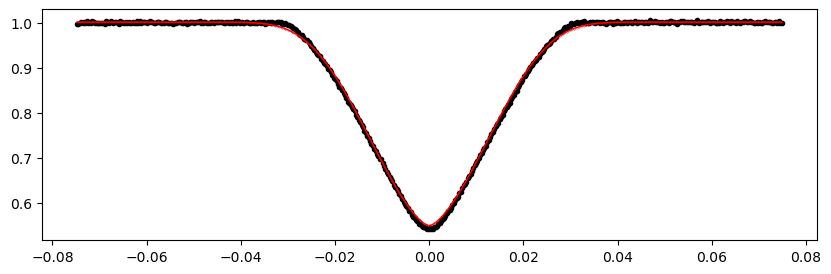

2180.589144 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1335.15it/s]


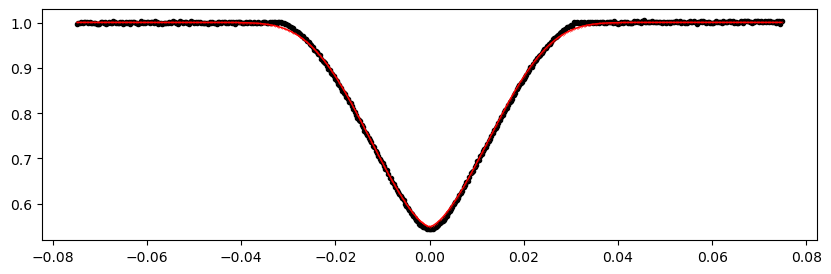

2185.27839 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1340.90it/s]


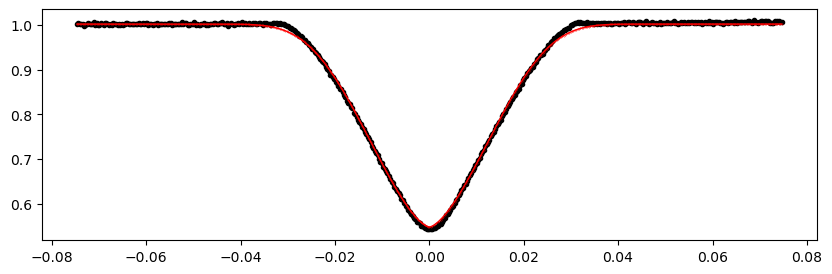

2189.967636 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.58it/s]


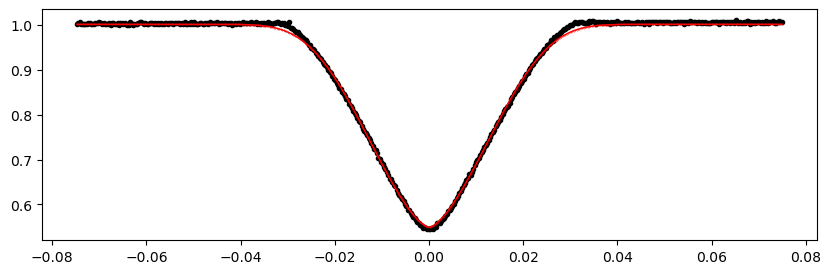

2194.6568819999998 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.83it/s]


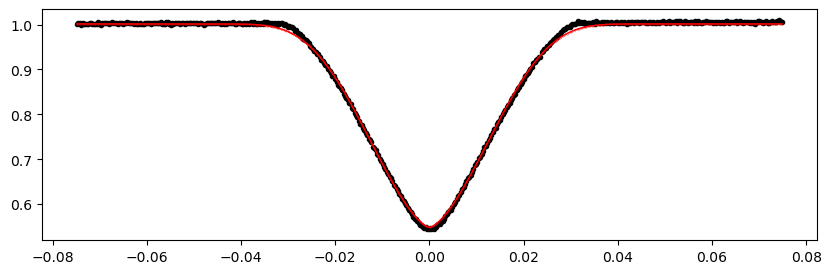

2199.346128 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1347.67it/s]


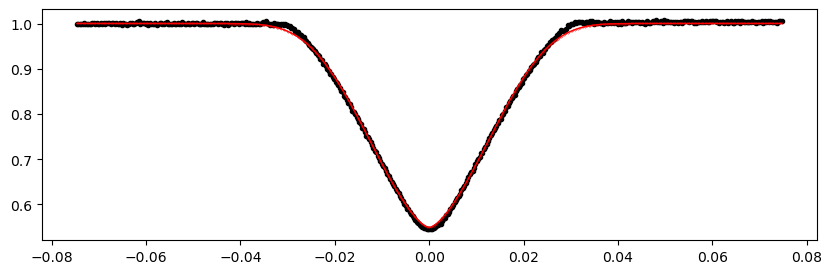

2204.035374 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1341.77it/s]


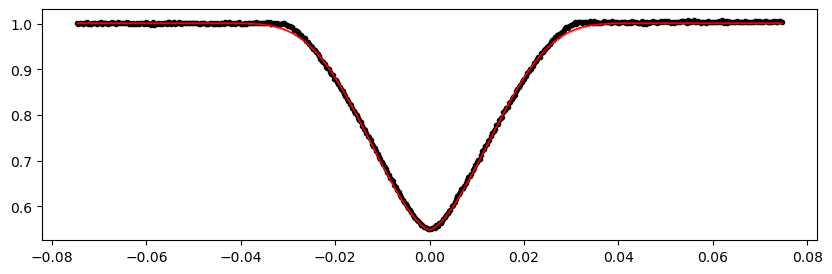

2208.72462 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1346.71it/s]


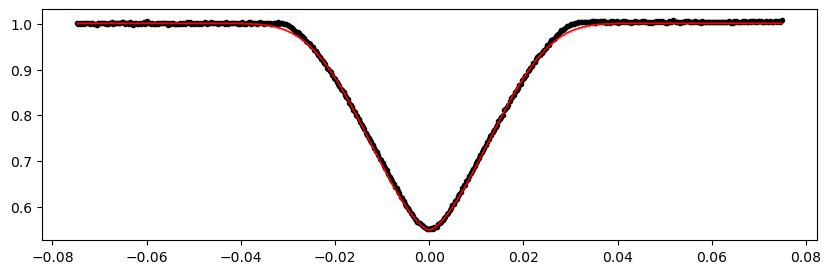

2213.413866 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.44it/s]


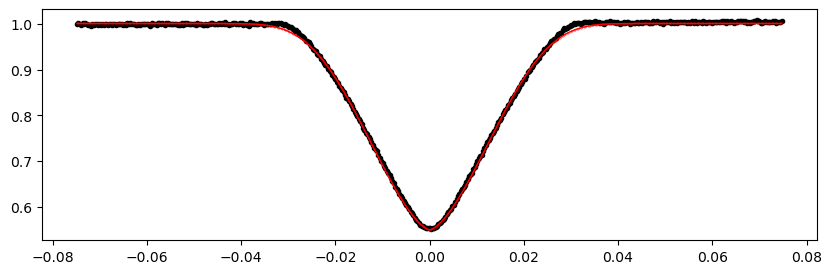

2218.103112 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1350.58it/s]


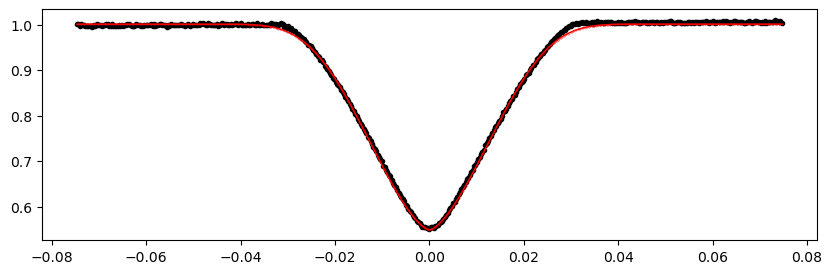

2222.7923579999997 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1344.02it/s]


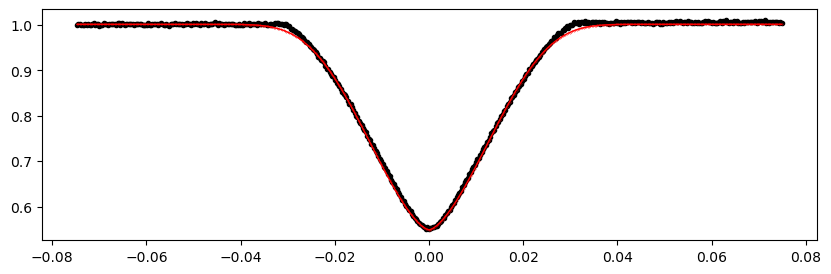

2227.481604 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1338.53it/s]


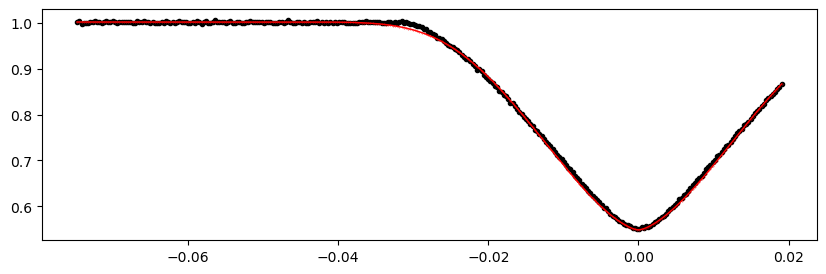

2232.17085 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1346.68it/s]


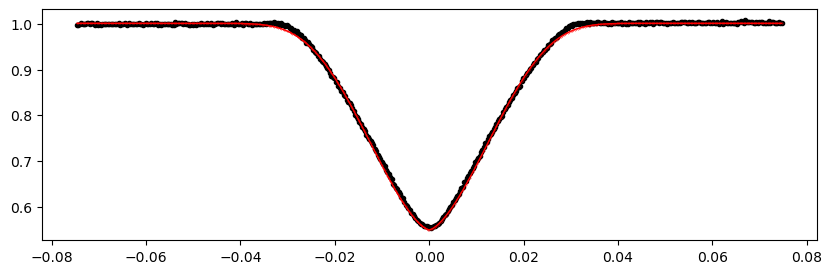

2236.860096 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1343.20it/s]


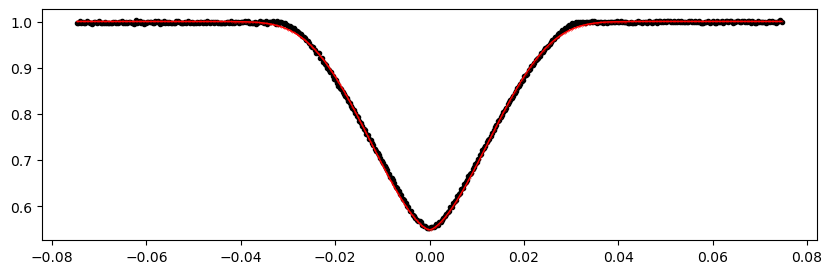

2246.238588 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1347.64it/s]


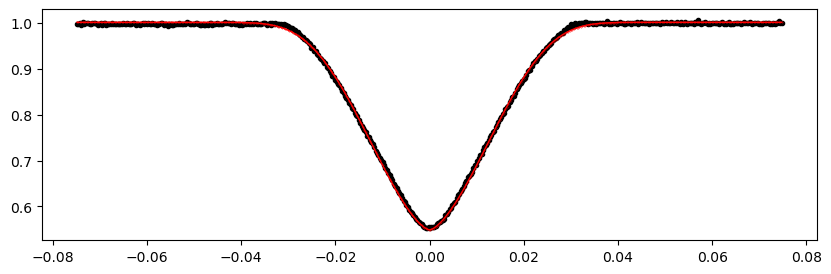

2250.927834 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.77it/s]


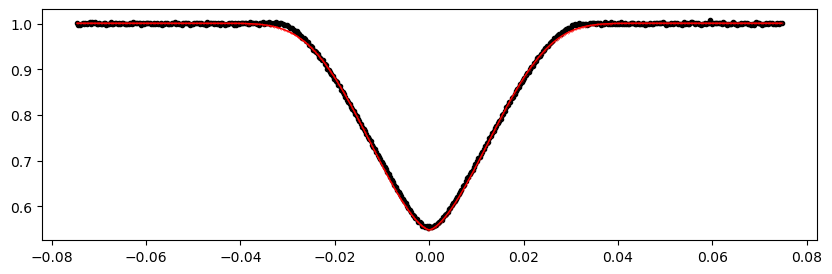

2255.61708 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1344.58it/s]


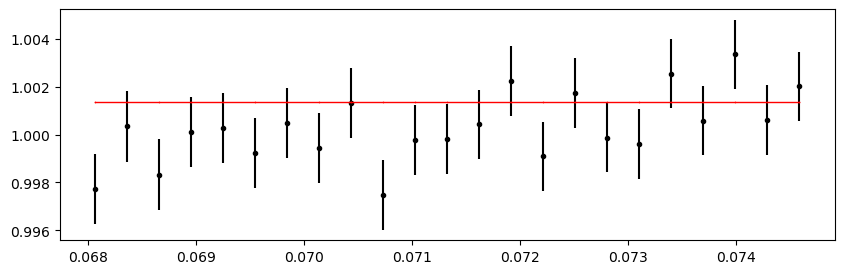

2260.306326 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.22it/s]


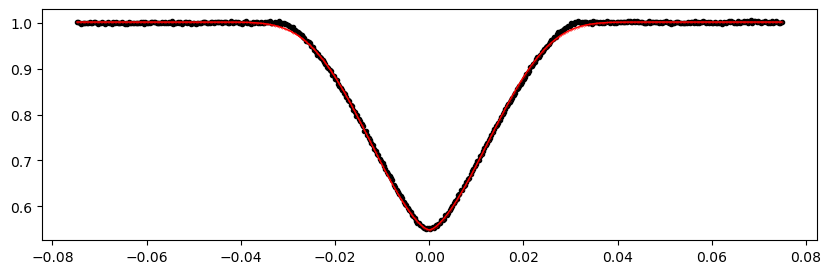

2264.995572 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1344.85it/s]


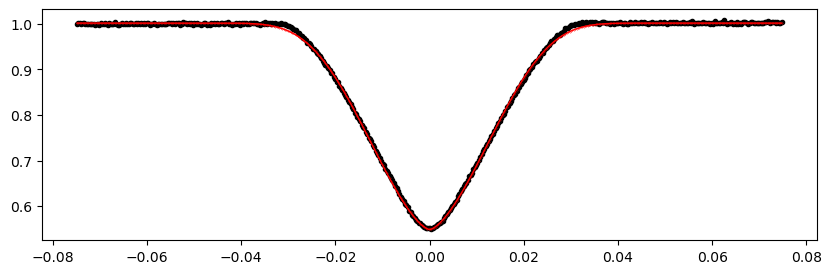

2274.3740639999996 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1344.75it/s]


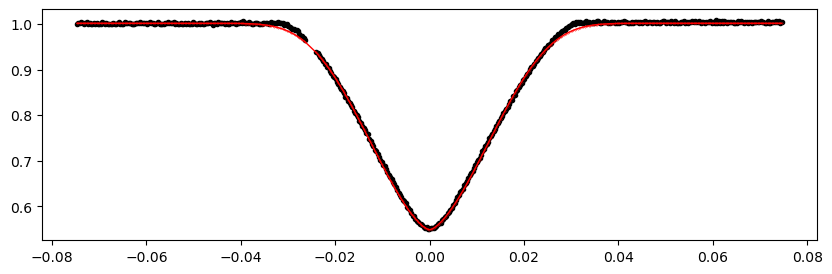

2279.06331 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1335.77it/s]


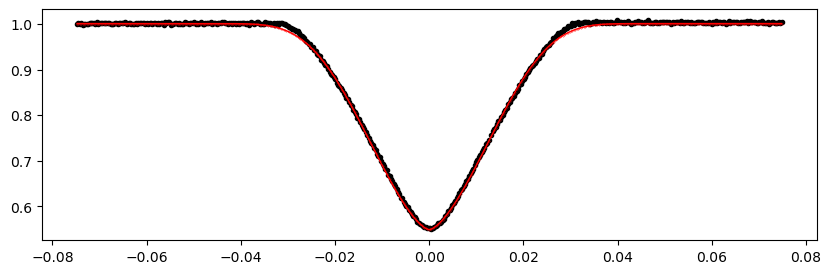

2283.752556 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1348.42it/s]


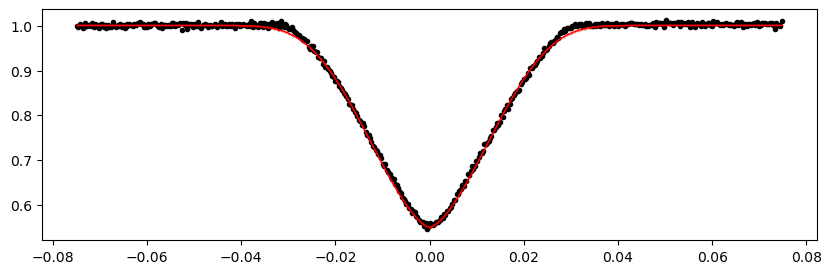

2288.441802 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.59it/s]


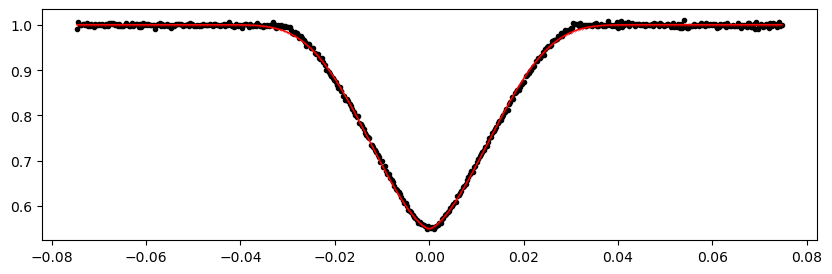

2293.1310479999997 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.73it/s]


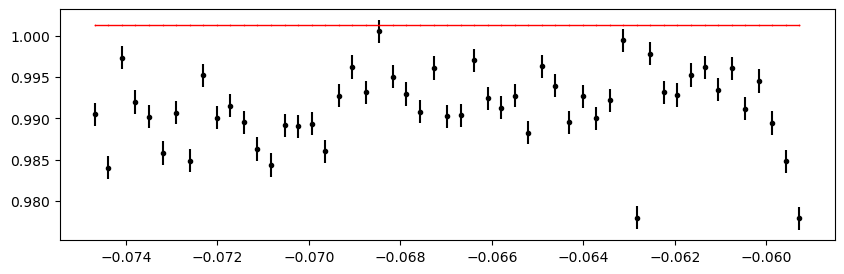

2297.820294 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1352.03it/s]


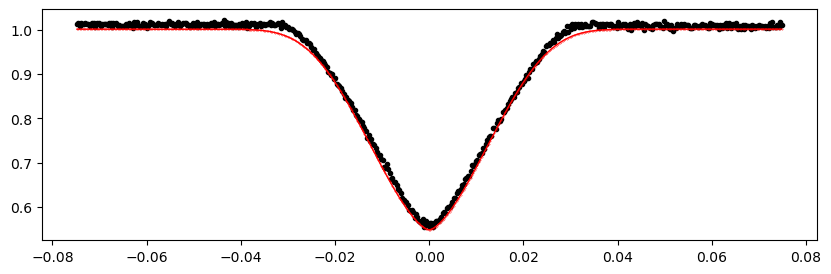

2302.50954 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1339.29it/s]


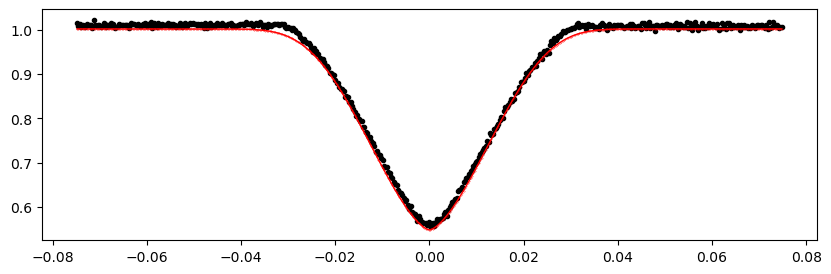

2311.888032 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.19it/s]


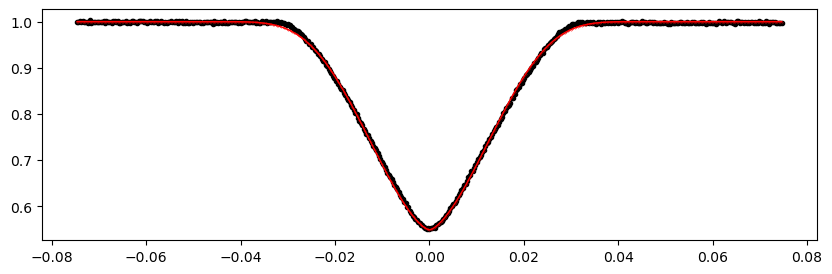

2316.5772779999998 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.65it/s]


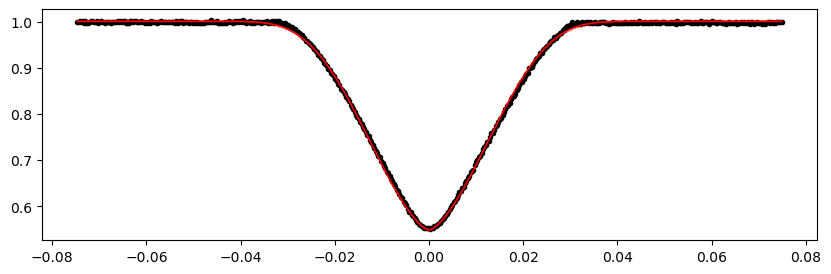

2325.95577 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.76it/s]


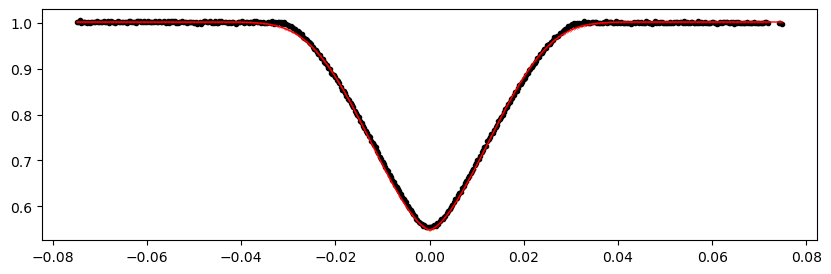

2330.645016 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1350.42it/s]


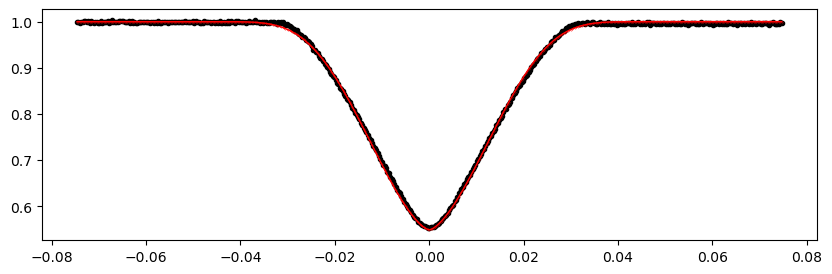

2335.334262 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1347.23it/s]


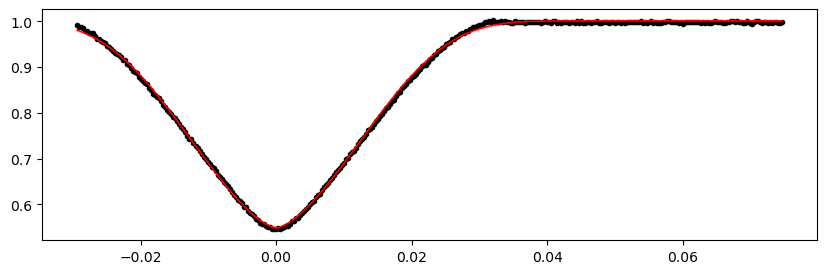

2340.0235079999998 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1341.94it/s]


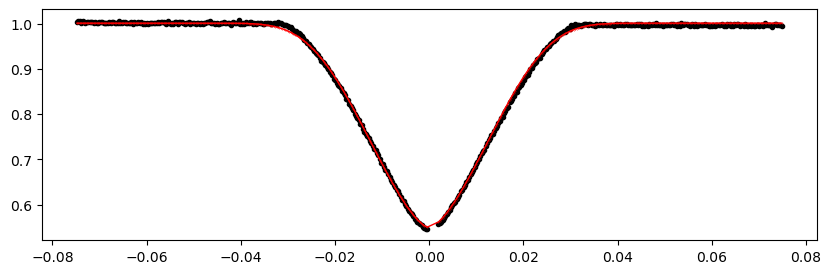

2344.712754 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1350.99it/s]


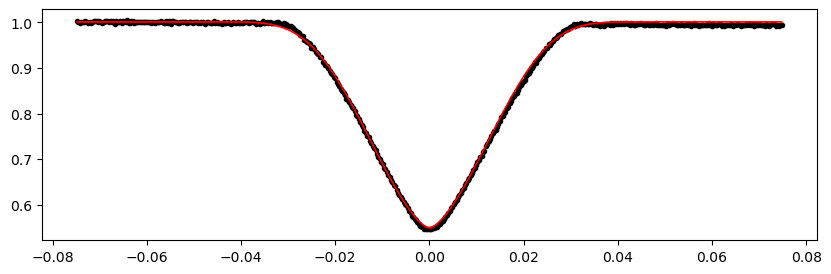

2349.402 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1334.29it/s]


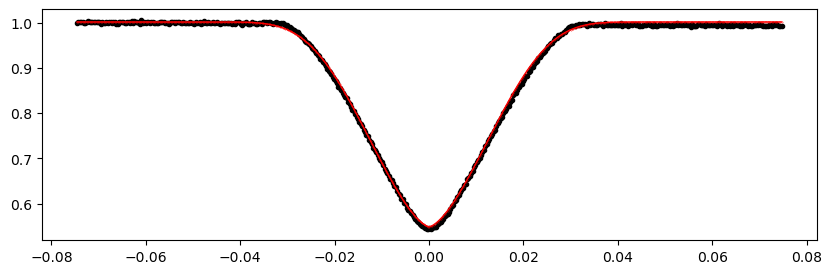

2354.091246 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1347.53it/s]


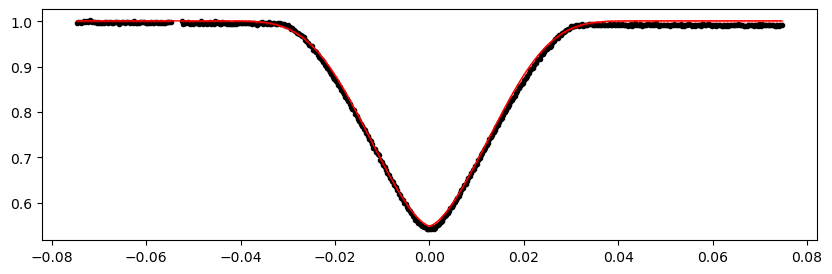

2358.780492 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1344.99it/s]


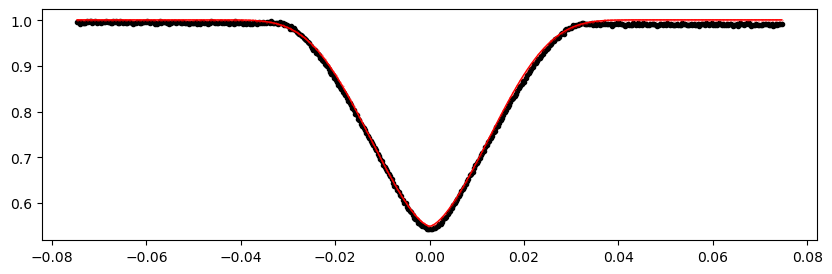

2363.469738 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1341.87it/s]


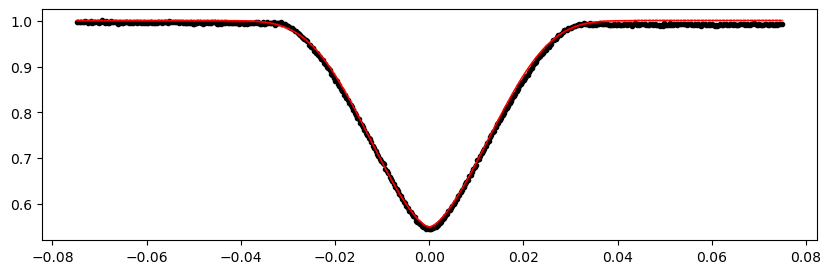

2368.1589839999997 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.68it/s]


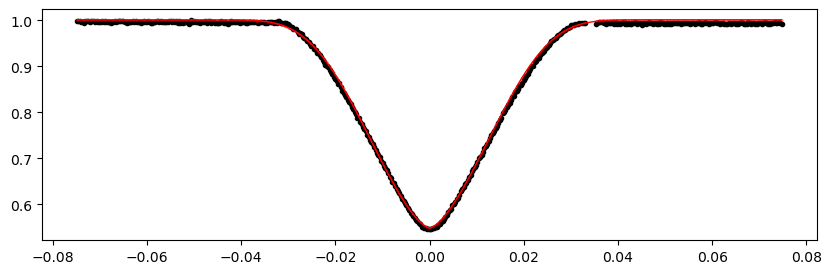

2372.84823 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1364.88it/s]


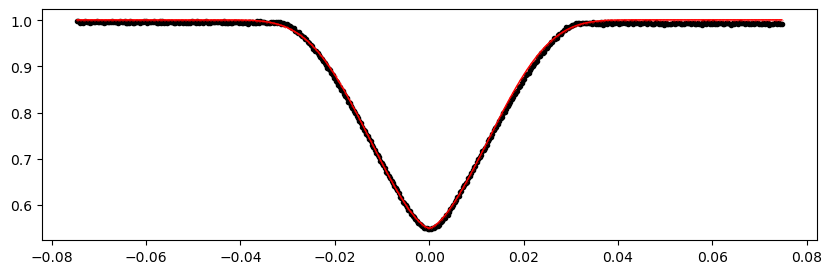

2377.537476 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1339.27it/s]


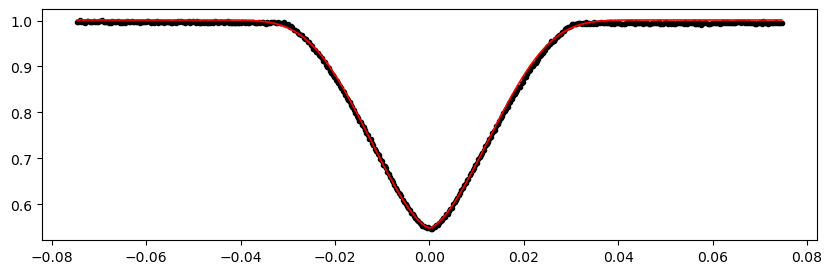

2382.226722 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1346.55it/s]


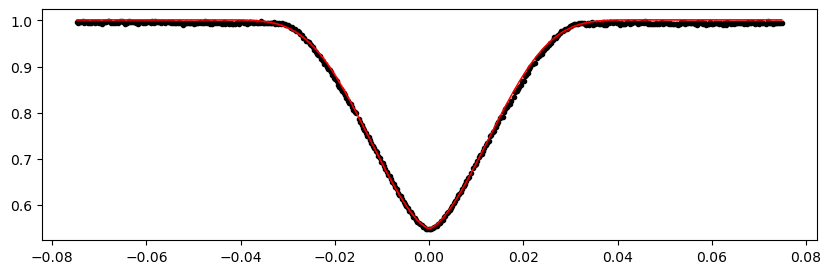

2386.915968 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.92it/s]


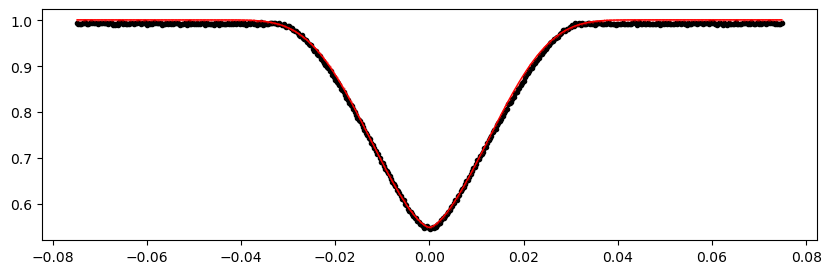

2968.382472 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1348.17it/s]


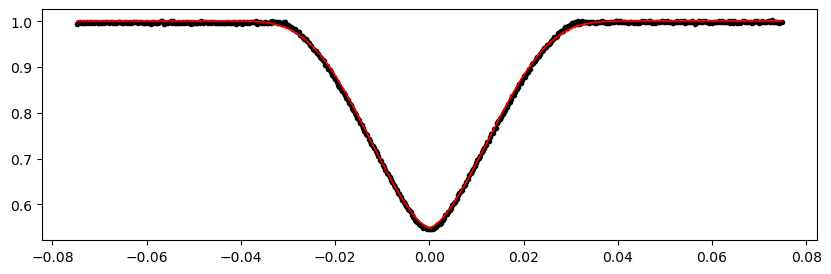

2973.071718 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1348.27it/s]


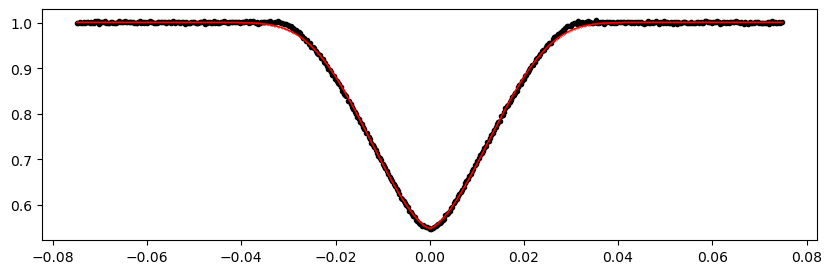

2977.760964 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1365.10it/s]


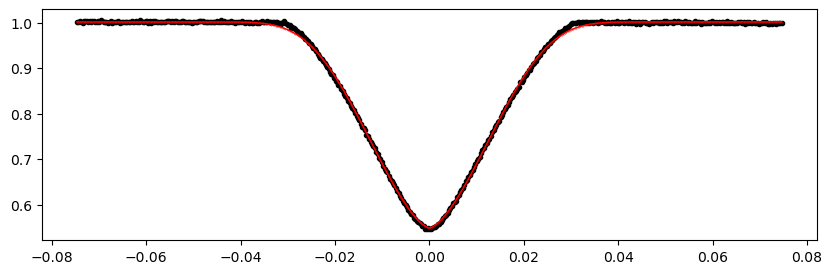

2982.45021 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1367.66it/s]


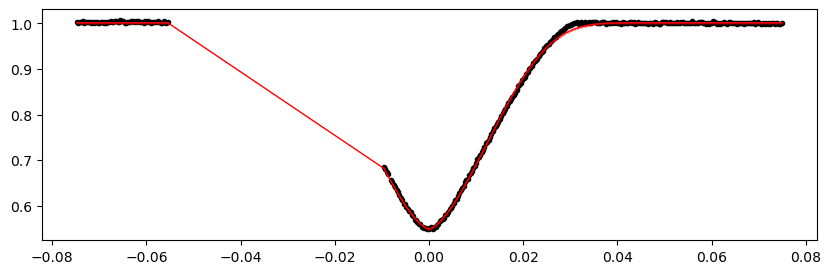

2987.139456 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1364.52it/s]


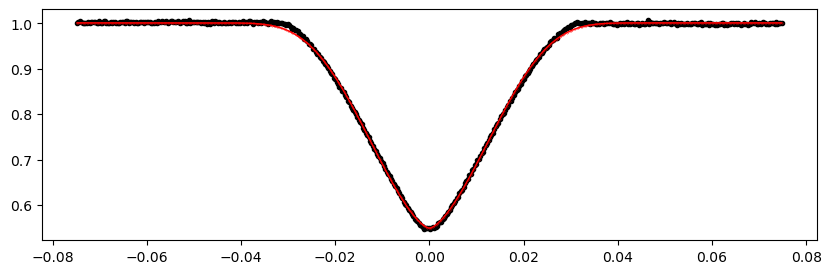

2991.828702 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1348.32it/s]


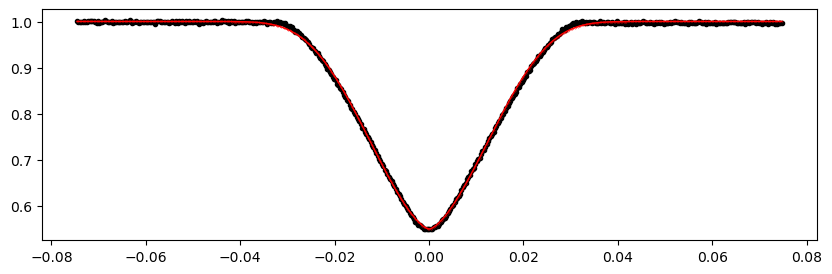

2996.5179479999997 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1352.29it/s]


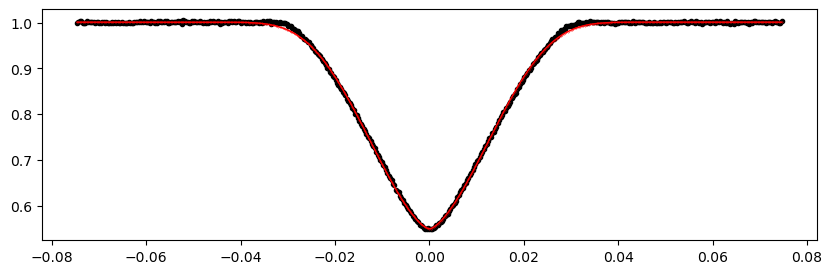

3001.2071939999996 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1348.35it/s]


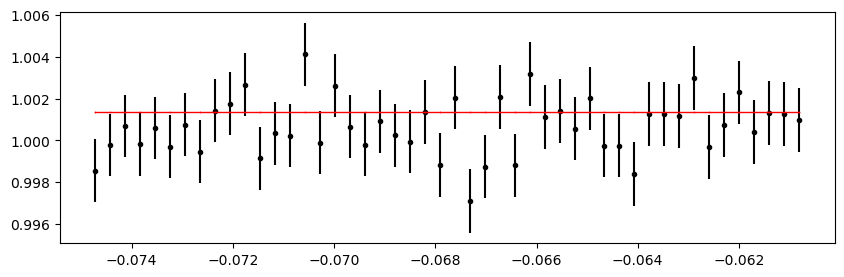

3005.8964399999995 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1306.26it/s]


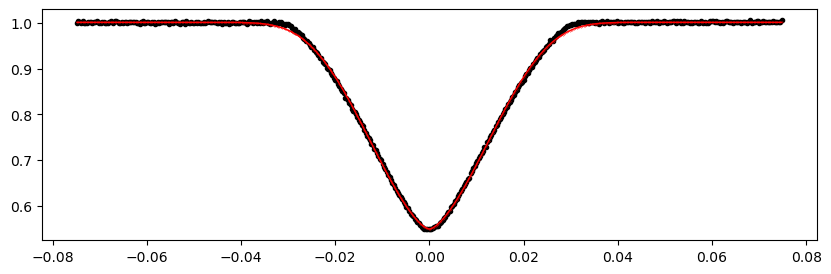

3010.585686 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1242.25it/s]


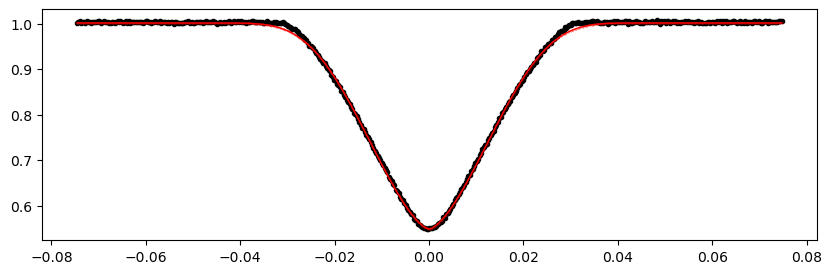

3019.964178 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1293.40it/s]


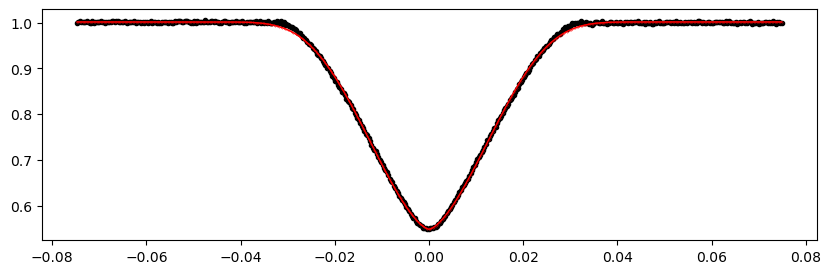

3024.653424 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1360.57it/s]


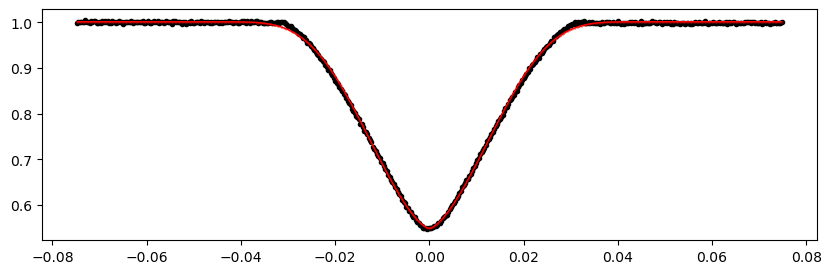

3029.34267 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.86it/s]


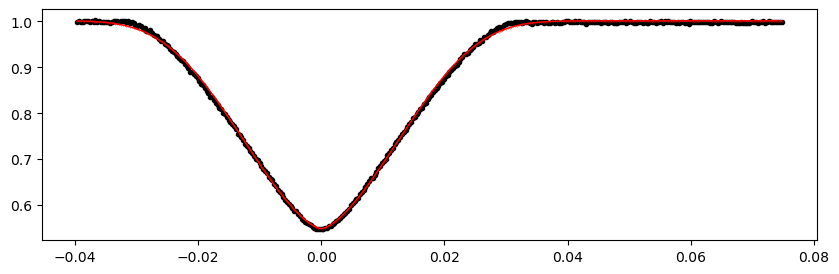

3034.031916 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1361.20it/s]


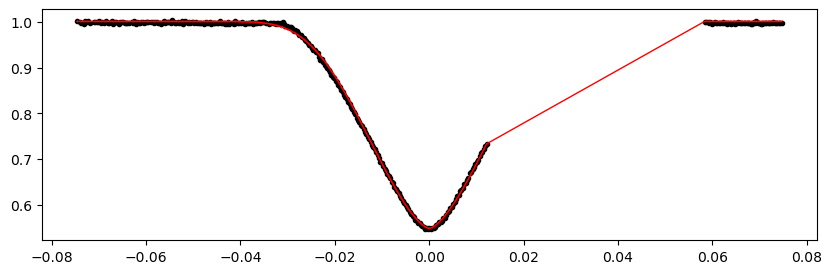

3038.721162 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.49it/s]


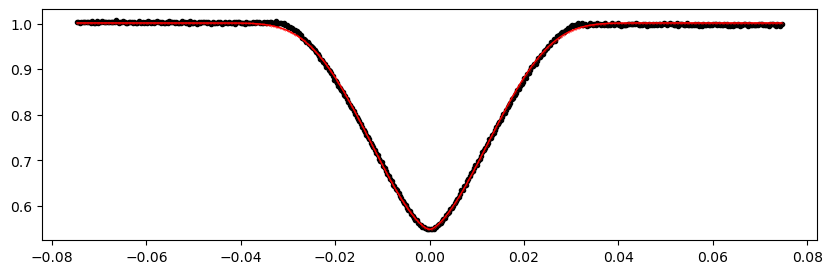

3043.4104079999997 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1376.19it/s]


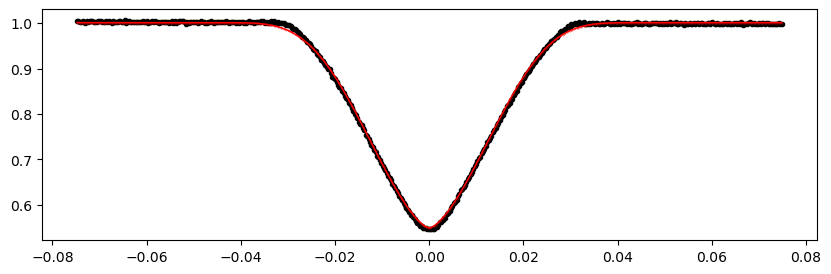

3048.0996539999996 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1362.25it/s]


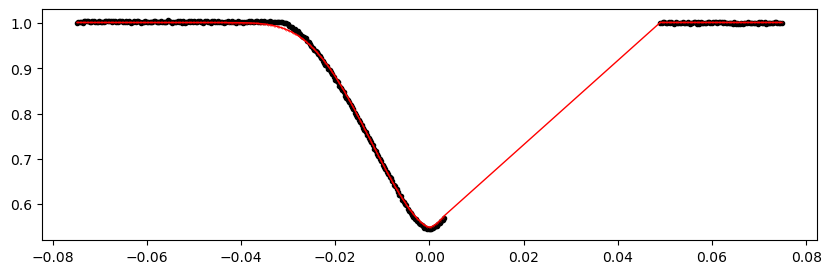

3052.7888999999996 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.67it/s]


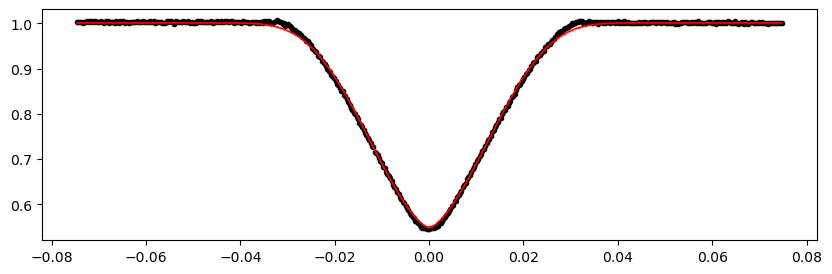

3057.478146 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1368.04it/s]


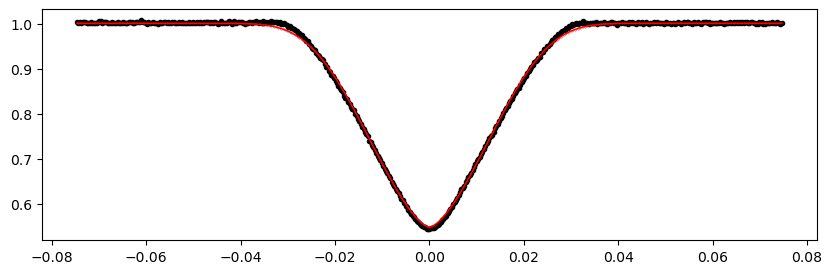

3062.167392 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:09<00:00, 1060.25it/s]


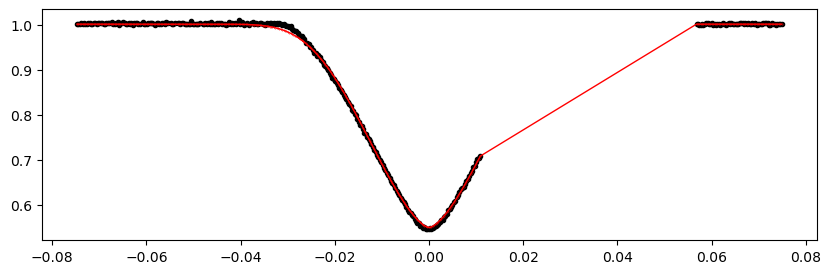

3066.856638 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:09<00:00, 1070.30it/s]


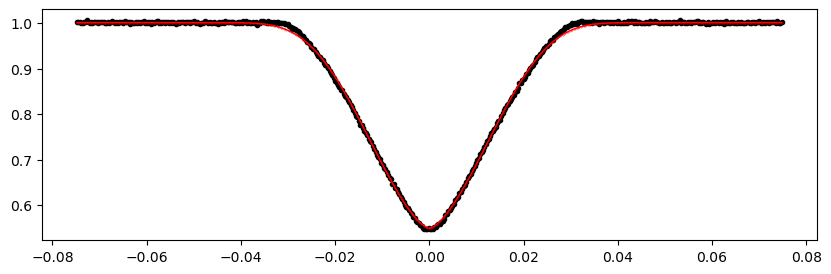

3071.545884 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1344.22it/s]


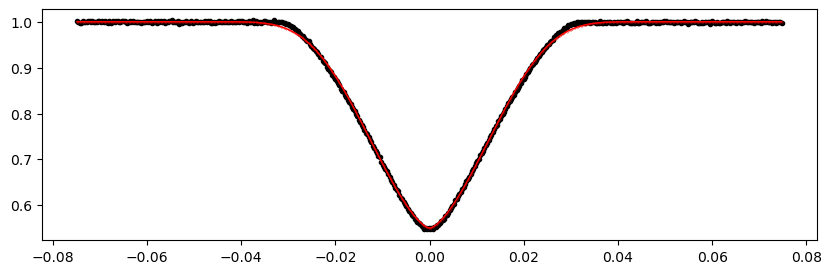

3076.23513 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1324.28it/s]


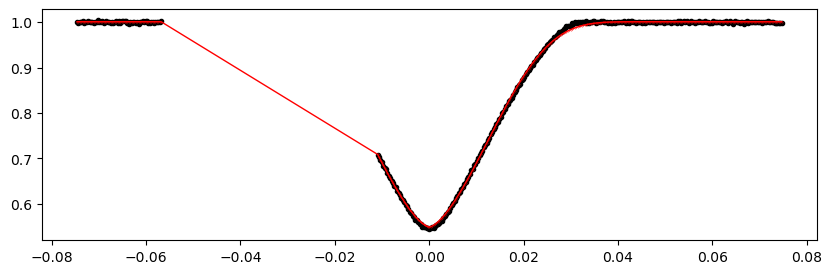

3080.924376 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1344.70it/s]


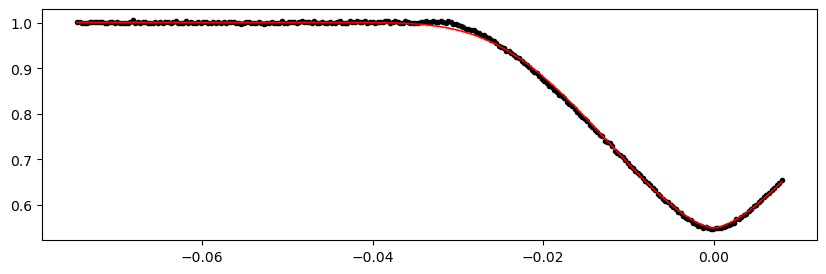

3085.613622 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1346.23it/s]


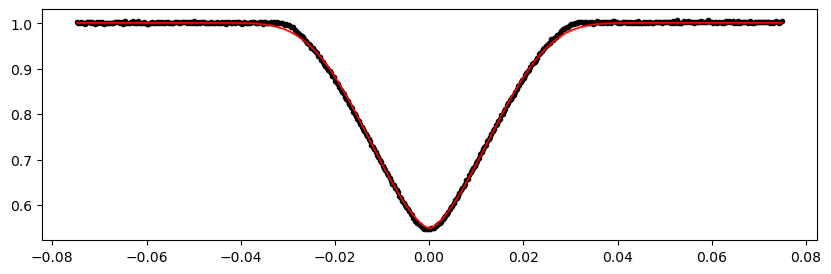

3090.3028679999998 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.67it/s]


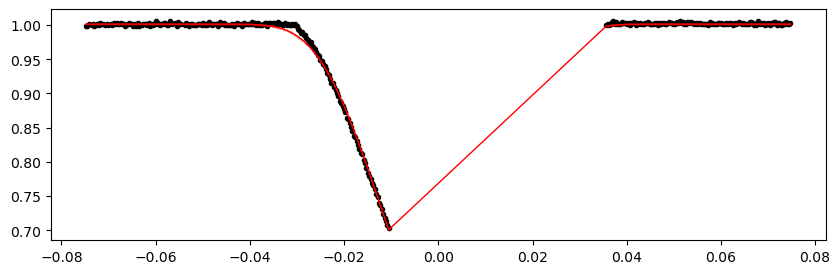

3094.9921139999997 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.01it/s]


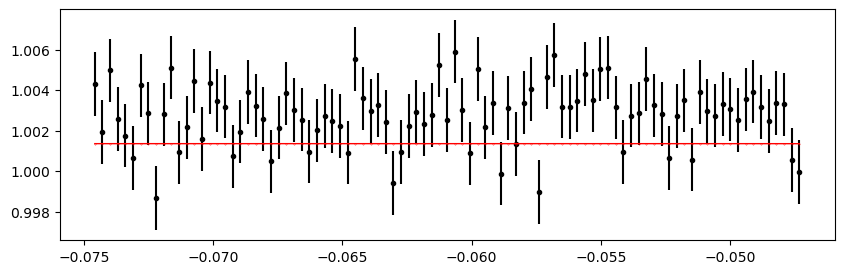

3099.6813599999996 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1340.26it/s]


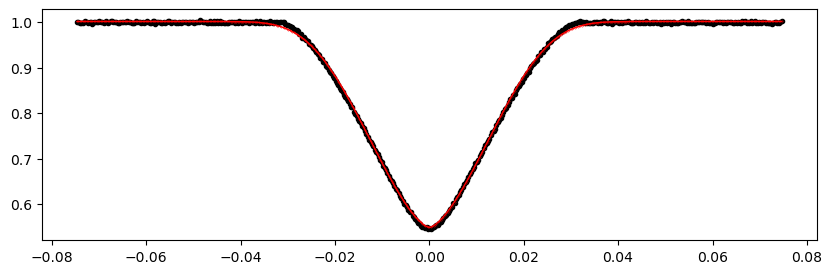

3104.370606 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.04it/s]


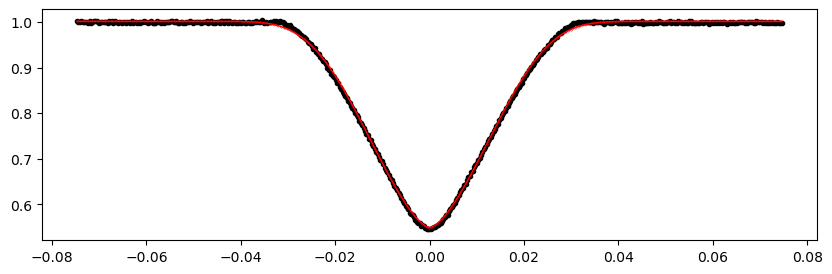

3113.749098 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1337.86it/s]


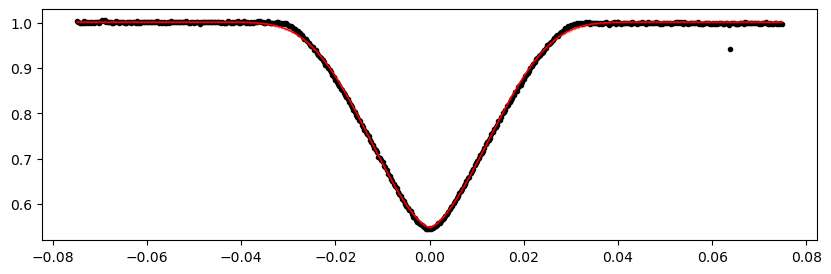

3118.438344 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1335.63it/s]


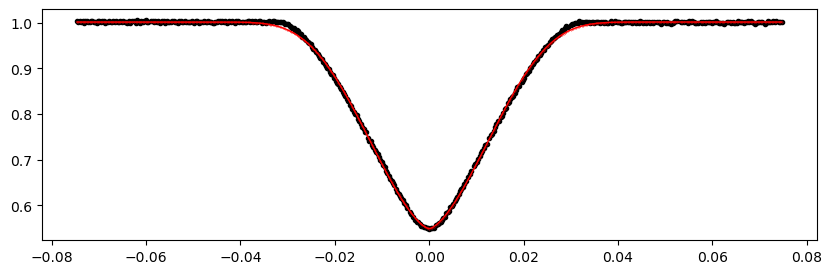

3127.816836 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1334.33it/s]


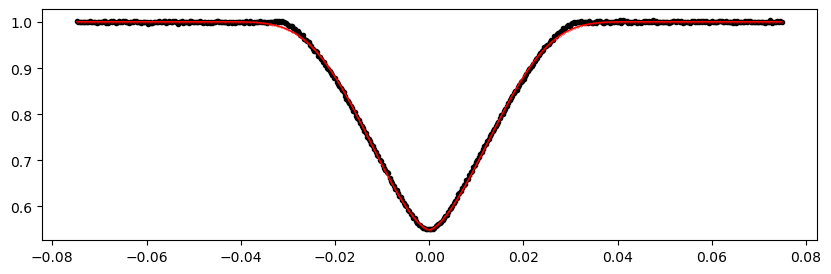

3132.506082 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1324.96it/s]


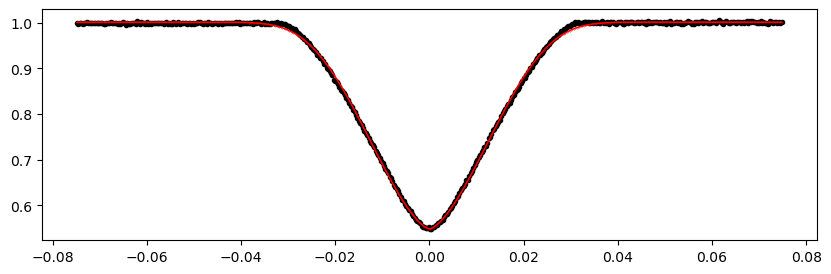

3141.8845739999997 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1336.73it/s]


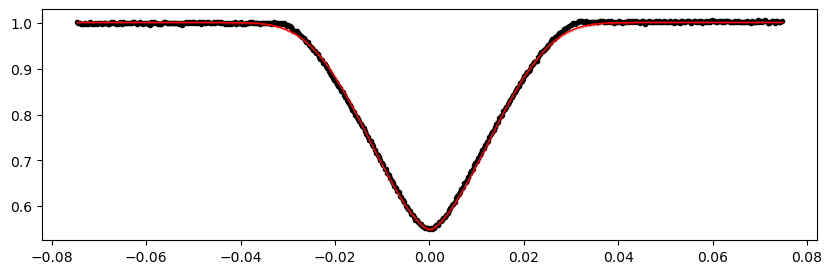

3146.5738199999996 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1325.09it/s]


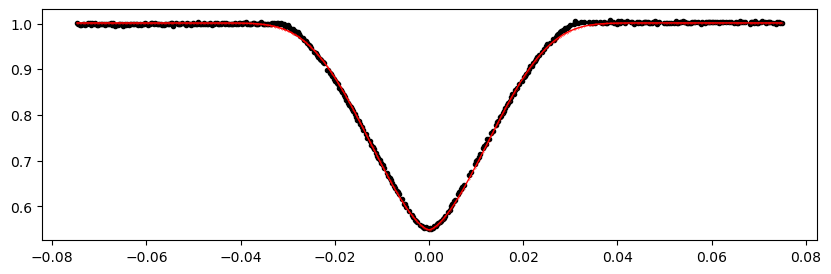

3151.2630659999995 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1340.77it/s]


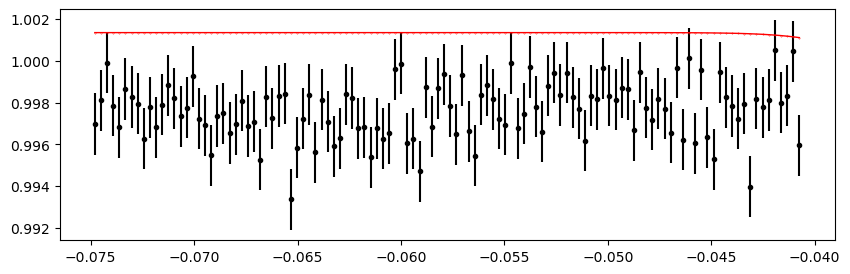

3155.952312 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1341.00it/s]


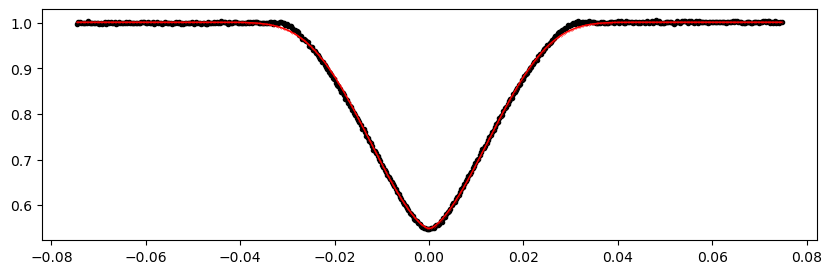

3160.641558 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1341.07it/s]


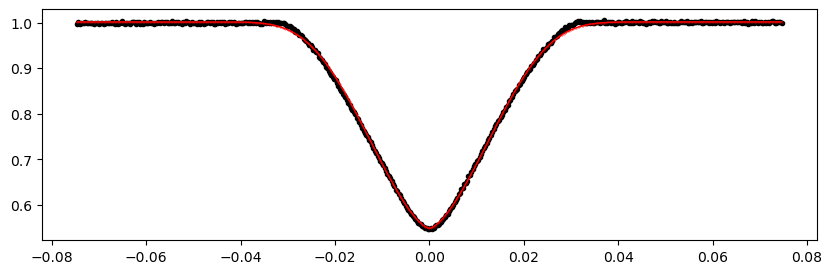

3165.330804 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1340.70it/s]


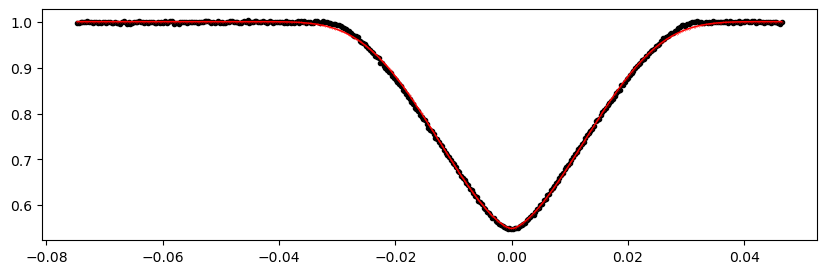

3170.02005 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1341.06it/s]


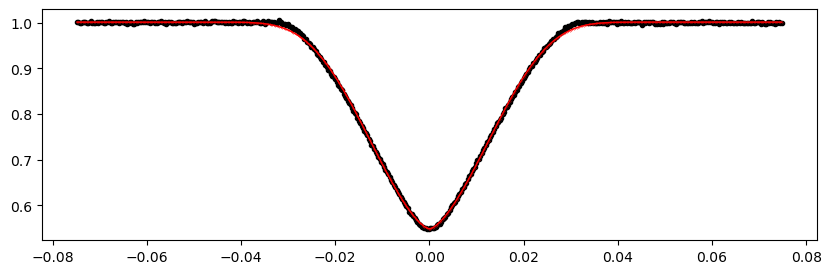

3174.709296 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.30it/s]


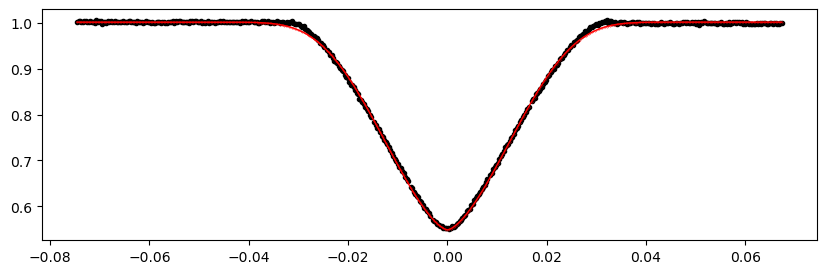

3179.398542 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.10it/s]


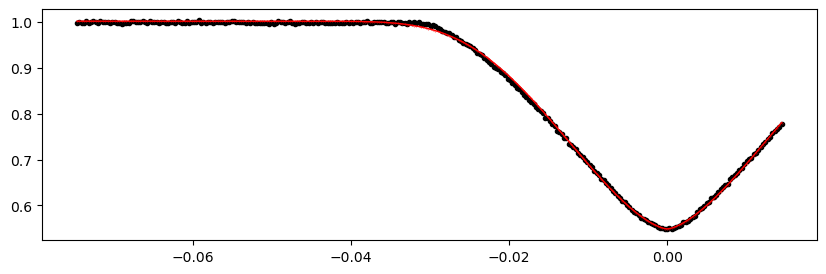

3184.087788 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.49it/s]


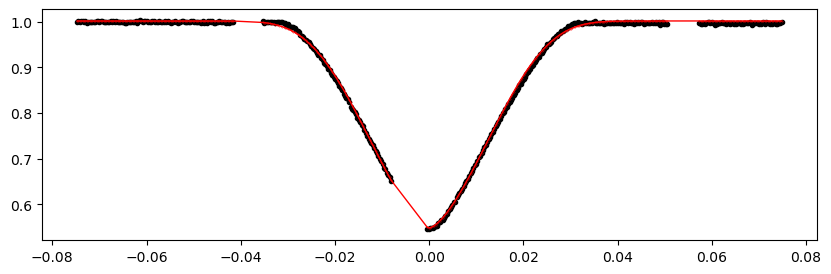

3188.7770339999997 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1346.60it/s]


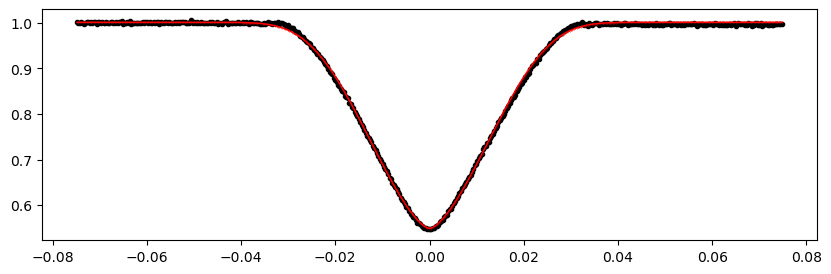

3198.1555259999996 1.0013589390322668 -0.452358403656157 -0.37500037502926503


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1338.51it/s]


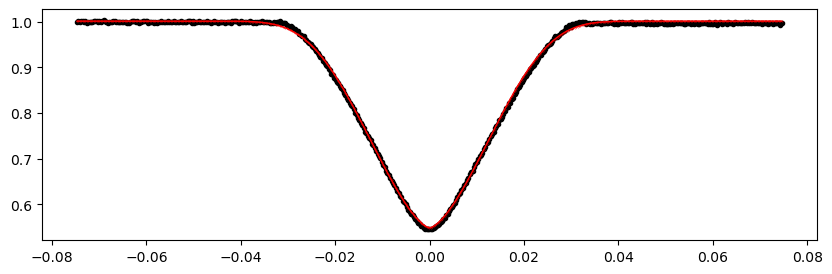

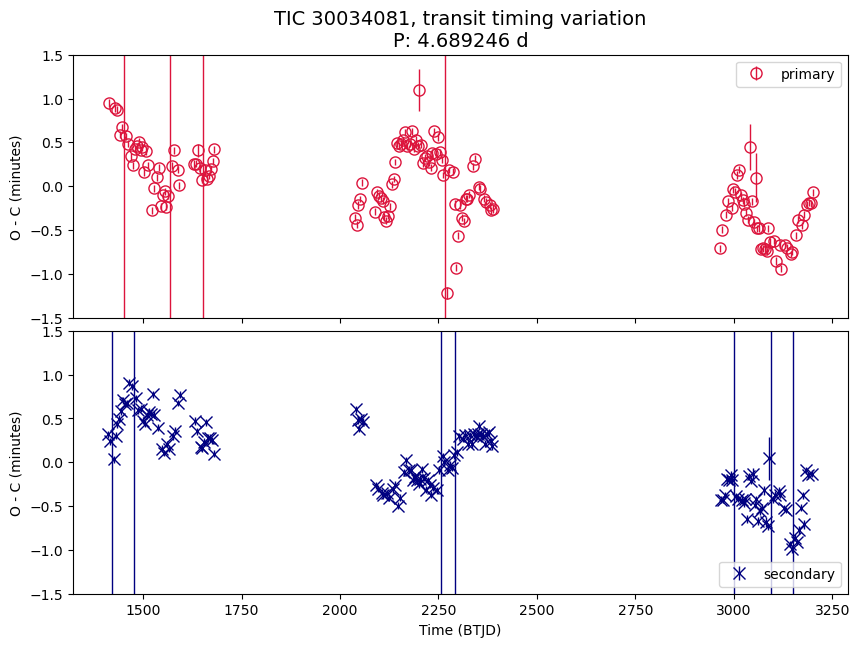

In [29]:
%matplotlib inline
# %matplotlib widget

#plot the extracted transit times to check for ETVs

fig, axs = plt.subplots(2, 1, figsize=(10, 7), sharex=True)

in_df_primary = pd.read_csv(outfile_path)
in_df_secondary = pd.read_csv(outfile_path_s)


in_df_primary['midpoint'] = in_df_primary['epoch'] + (in_df_primary['t0']*period)
in_df_primary['shift_mins'] = in_df_primary['t0']*period*24*60
in_df_primary['std_mins'] = in_df_primary['stdv_t0']*period*24*60

in_df_secondary['midpoint'] = in_df_secondary['epoch'] + (in_df_secondary['t0']*period)
in_df_secondary['shift_mins'] = in_df_secondary['t0']*period*24*60
in_df_secondary['std_mins'] = in_df_secondary['stdv_t0']*period*24*60

axs[0].errorbar(in_df_primary['epoch'], in_df_primary['shift_mins'], yerr = in_df_primary['std_mins'], 
             lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'crimson', label="primary")
axs[1].errorbar(in_df_secondary['epoch'], in_df_secondary['shift_mins'], yerr = in_df_secondary['std_mins'], 
             lw = 0, marker = 'x', elinewidth = 1, markersize = 9, color = 'navy', zorder = -2, label="secondary" );

for ax in axs:
    ax.set_ylabel("O - C (minutes)")
    ax.set_ylim(-1.5, 1.5)
    ax.legend();

axs[1].set_xlabel("Time (BTJD)")
axs[0].set_title(f"TIC {ticid}, transit timing variation\nP: {period} d", fontsize=14)

plt.subplots_adjust(hspace=0.05)
plt.show()

### Results from old `log_prior_fitting()`

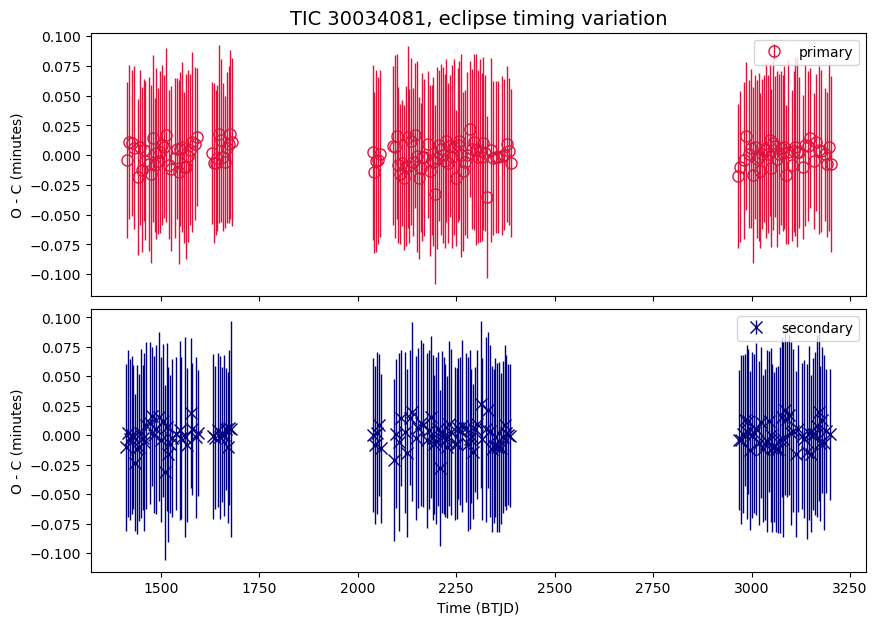


## make a periodogram 

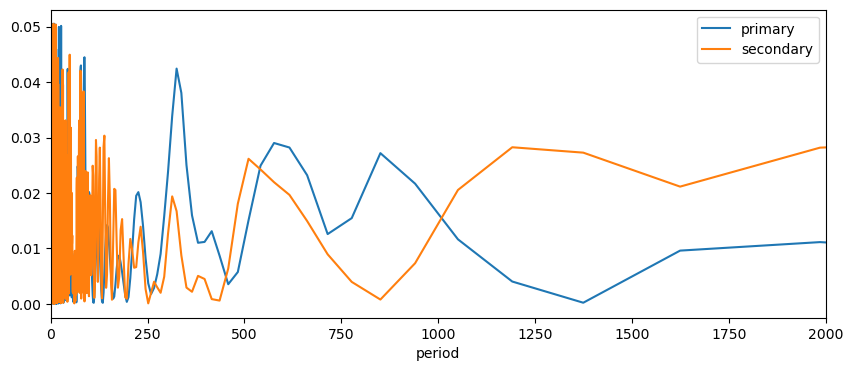

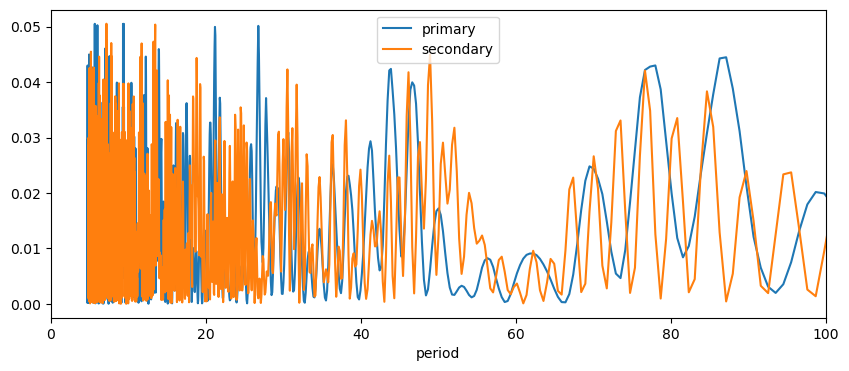

In [27]:
frequency, power = LombScargle(in_df_primary['epoch'], in_df_primary['shift_mins']).autopower()
frequency_s, power_s = LombScargle(in_df_secondary['epoch'], in_df_secondary['shift_mins']).autopower()

fig, ax = plt.subplots(figsize=(10, 4))

plt.plot(1/frequency, power, label = 'primary')    
plt.plot(1/frequency_s, power_s, label = 'secondary')    

plt.xlabel("period")
plt.xlim(0, 2000);
plt.legend()
plt.show()

if True:  # zoom
    fig, ax = plt.subplots(figsize=(10, 4))
    
    plt.plot(1/frequency, power, label = 'primary')    
    plt.plot(1/frequency_s, power_s, label = 'secondary')    
    
    plt.xlabel("period")
    plt.xlim(0, 100);
    plt.legend()
    plt.show()

In [30]:
# FILL-IN the ETV results / comments
has_etv = "Y"
comments = "EB Period to SB Period ~= 2.8:1 . The trend of primary is opposite of the one of secondary. VSX Period is half of true period."

# Eclipse depth from the model
depth_pct_p = round(-mean_alpha1 * 100, 2)
if t0_secondary is not None:
    depth_pct_s = round(-mean_alpha1_s * 100, 2)
else:
    depth_pct_s = None

summary = {
    "tic": ticid,
    "has_etv": has_etv,
    "comments": comments,
    "period": period,  # the period used in ETV analysis
    "depth_pct_p": depth_pct_p,
    "depth_pct_s": depth_pct_s,
    "epoch_p": t0_primary,
    "epoch_s": t0_secondary,
    "num_sectors": len(sr),
    "time_span": round(time[-1] - time[0], 2),
    "time_start": round(time[0], 2),
    "time_end": round(time[-1], 2),
}

summary = pd.DataFrame.from_dict(summary, orient="index")
with pd.option_context('display.max_colwidth', None, 'display.max_rows', 999, 'display.max_columns', 99):
    display(summary);

# Single line to be added to a CSV
print("")
print(summary.transpose().to_csv(
    index=False,
    header=True, 
))

,0
tic,30034081
has_etv,Y
comments,EB Period to SB Period ~= 2.8:1 . The trend of primary is opposite of the one of secondary. VSX Period is half of true period.
period,4.689246
depth_pct_p,45.1
depth_pct_s,45.24
epoch_p,1413.897423
epoch_s,1411.5528
num_sectors,30
time_span,1797.24



tic,has_etv,comments,period,depth_pct_p,depth_pct_s,epoch_p,epoch_s,num_sectors,time_span,time_start,time_end
30034081,Y,EB Period to SB Period ~= 2.8:1 . The trend of primary is opposite of the one of secondary. VSX Period is half of true period.,4.689246,45.1,45.24,1413.897423,1411.5528,30,1797.24,1410.9,3208.14

